# Set-Up

In [ ]:
# %%time
# Blok ini untuk menginstal library yang dibutuhkan saat dijalankan di Google Colab.
# Jika tidak di Colab, pastikan environment Anda sudah sesuai dengan file requirements.txt.
try:
    import google.colab
    print("🚀 Menjalankan di Google Colab. Menginstal paket yang diperlukan...")
    # Menggunakan &> /dev/null untuk menyembunyikan output instalasi yang panjang
    %pip install jenkspy rasterio scikeras &> /dev/null
    %pip uninstall -y scikit-learn &> /dev/null
    %pip install scikit-learn==1.4.2 &> /dev/null
    %pip install shap &> /dev/null
    print("✅ Instalasi selesai.")
except ImportError:
    print("🖥️ Tidak berjalan di Google Colab. Proses instalasi dilewati.")

# Verifikasi versi scikit-learn
import sklearn
print(f"Scikit-learn versi: {sklearn.__version__} (disarankan 1.4.2)")

🚀 Menjalankan di Google Colab. Menginstal paket yang diperlukan...
✅ Instalasi selesai.
Scikit-learn versi: 1.4.2 (disarankan 1.4.2)


In [ ]:
# %%time
# --- Konfigurasi Seed untuk Reproducibility ---
seed = 222111840

# --- Library Standar & Pengolahan Data ---
import os
import re
import json
import random
import numpy as np
import pandas as pd
import geopandas as gpd
import jenkspy
from joblib import dump, load


# --- Library Machine Learning & Deep Learning ---
import tensorflow as tf
from tensorflow import keras
import shap
from scikeras.wrappers import KerasClassifier
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold, GridSearchCV, train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, precision_recall_fscore_support, accuracy_score, recall_score, make_scorer
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.tree import plot_tree

# --- Library Visualisasi ---
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import from_levels_and_colors, ListedColormap
from matplotlib.patches import Patch
import matplotlib.patches as mpatches
import seaborn as sns

# --- Library Geospasial ---
import ee
import rasterio
from rasterio.mask import mask
from shapely.geometry import mapping
from rasterio.windows import Window
from rasterio.features import geometry_mask
from rasterio.enums import Resampling
from rasterio.mask import mask

# --- TensorFlow/Keras Components ---
load_model = tf.keras.models
from keras import Sequential
layers = tf.keras.layers
Conv1D = layers.Conv1D
Dense = layers.Dense
Flatten = layers.Flatten
Input = layers.Input
BatchNormalization = layers.BatchNormalization
ReLU = layers.ReLU
glorot_uniform = tf.keras.initializers.GlorotUniform(seed=seed)
he_normal = tf.keras.initializers.HeNormal(seed=seed)
lecun_normal = tf.keras.initializers.LecunNormal(seed=seed)
EarlyStopping = tf.keras.callbacks.EarlyStopping
Adam = tf.keras.optimizers.Adam
CategoricalCrossentropy = tf.keras.losses.CategoricalCrossentropy
to_categorical = tf.keras.utils.to_categorical
print("✅ Semua library berhasil diimpor.")

✅ Semua library berhasil diimpor.


In [ ]:
# %%time
# Menghubungkan Google Drive jika berjalan di Colab
try:
    import google.colab
    print("🔗 Menghubungkan Google Drive...")
    from google.colab import drive
    drive.mount('/content/drive', force_remount=False)
    BASE_PATH = '/content/drive/MyDrive/GEE_Exports'
    print("✅ Google Drive terhubung.")
except ImportError:
    print("🖥️ Tidak di Colab. Path lokal akan digunakan.")
    # Sesuaikan path ini jika Anda bekerja secara lokal
    BASE_PATH = os.path.abspath(os.path.join(os.getcwd(), "../aset"))

# Autentikasi dan inisialisasi Google Earth Engine
try:
    ee.Initialize(project='ee-222111840')
    print("🌍 Google Earth Engine terautentikasi dan terinisialisasi.")
except Exception as e:
    print("⚠️ Gagal terhubung ke GEE. Lakukan autentikasi.")
    ee.Authenticate()
    ee.Initialize(project='ee-222111840')

# Mengatur seed untuk hasil yang dapat direproduksi
os.environ['PYTHONHASHSEED'] = str(seed)
random.seed(seed)
np.random.seed(seed)
tf.keras.utils.set_random_seed(seed)
os.environ['TF_DETERMINISTIC_OPS'] = '1'
os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
tf.config.threading.set_inter_op_parallelism_threads(1)
tf.config.threading.set_intra_op_parallelism_threads(1)
print(f"🌱 Seed untuk reproducibility diatur ke: {seed}")

🔗 Menghubungkan Google Drive...
Mounted at /content/drive
✅ Google Drive terhubung.
⚠️ Gagal terhubung ke GEE. Lakukan autentikasi.
🌱 Seed untuk reproducibility diatur ke: 222111840


In [ ]:
import os

# Asumsikan BASE_PATH sudah didefinisikan dari sel sebelumnya
BASE_PATH = '/content/drive/MyDrive/GEE_Exports'

# -------------------------------------------------------------------
# >> Path Umum (Tidak Tergantung Bulan)
# -------------------------------------------------------------------
SHP = os.path.join(BASE_PATH, 'rawa_pening.shp')
LC_PATH = os.path.join(BASE_PATH, 'lc.json')


# -------------------------------------------------------------------
# >> Path untuk Bulan JUNI
# -------------------------------------------------------------------
SAMPLE_PATH_JUN              = os.path.join(BASE_PATH, 'data_sample_jun.csv')
IMAGE_PATH_JUN               = os.path.join(BASE_PATH, 'rawa_pening_image_jun.tif')
IMAGE_S1_PATH_JUN            = os.path.join(BASE_PATH, 'rawa_pening_image_sentinel1_jun.tif')
IMAGE_S2_PATH_JUN            = os.path.join(BASE_PATH, 'rawa_pening_image_sentinel2_jun.tif')
MODEL_RF_PATH_JUN            = os.path.join(BASE_PATH, 'model_rf_jun.joblib')
MODEL_CNN1D_PATH_JUN         = os.path.join(BASE_PATH, 'model_cnn1d_jun.keras')
SCALER_PATH_JUN              = os.path.join(BASE_PATH, 'scaler_jun.joblib')
NORMALIZER_PATH_JUN          = os.path.join(BASE_PATH, 'normalizer_jun.joblib')
OUTPUT_PATH_RF_JUN           = os.path.join(BASE_PATH, 'rf_jun.tiff')
OUTPUT_PATH_CNN1D_JUN        = os.path.join(BASE_PATH, 'cnn1_jun.tiff')
GVF_PATH_JUN                 = os.path.join(BASE_PATH, 'gvf_scores_and_ranks_jun.xlsx')

# -------------------------------------------------------------------
# >> Path untuk Bulan JULI
# -------------------------------------------------------------------
SAMPLE_PATH_JUL              = os.path.join(BASE_PATH, 'data_sample_jul.csv')
IMAGE_PATH_JUL               = os.path.join(BASE_PATH, 'rawa_pening_image_jul.tif')
IMAGE_S1_PATH_JUL            = os.path.join(BASE_PATH, 'rawa_pening_image_sentinel1_jul.tif')
IMAGE_S2_PATH_JUL            = os.path.join(BASE_PATH, 'rawa_pening_image_sentinel2_jul.tif')
MODEL_RF_PATH_JUL            = os.path.join(BASE_PATH, 'model_rf_jul.joblib')
MODEL_CNN1D_PATH_JUL         = os.path.join(BASE_PATH, 'model_cnn1d_jul.keras')
SCALER_PATH_JUL              = os.path.join(BASE_PATH, 'scaler_jul.joblib')
NORMALIZER_PATH_JUL          = os.path.join(BASE_PATH, 'normalizer_jul.joblib')
OUTPUT_PATH_RF_JUL           = os.path.join(BASE_PATH, 'rf_jul.tiff')
OUTPUT_PATH_CNN1D_JUL        = os.path.join(BASE_PATH, 'cnn1_jul.tiff')
GVF_PATH_JUL                 = os.path.join(BASE_PATH, 'gvf_scores_and_ranks_jul.xlsx')

# -------------------------------------------------------------------
# >> Path untuk Bulan AGUSTUS
# -------------------------------------------------------------------
SAMPLE_PATH_AGS              = os.path.join(BASE_PATH, 'data_sample_ags.csv')
IMAGE_PATH_AGS               = os.path.join(BASE_PATH, 'rawa_pening_image_ags.tif')
IMAGE_S1_PATH_AGS            = os.path.join(BASE_PATH, 'rawa_pening_image_sentinel1_ags.tif')
IMAGE_S2_PATH_AGS            = os.path.join(BASE_PATH, 'rawa_pening_image_sentinel2_ags.tif')
MODEL_RF_PATH_AGS            = os.path.join(BASE_PATH, 'model_rf_ags.joblib')
MODEL_CNN1D_PATH_AGS         = os.path.join(BASE_PATH, 'model_cnn1d_ags.keras')
SCALER_PATH_AGS              = os.path.join(BASE_PATH, 'scaler_ags.joblib')
NORMALIZER_PATH_AGS          = os.path.join(BASE_PATH, 'normalizer_ags.joblib')
OUTPUT_PATH_RF_AGS           = os.path.join(BASE_PATH, 'rf_ags.tiff')
OUTPUT_PATH_CNN1D_AGS        = os.path.join(BASE_PATH, 'cnn1_ags.tiff')
GVF_PATH_AGS                 = os.path.join(BASE_PATH, 'gvf_scores_and_ranks_ags.xlsx')

# Membuat folder-folder output jika belum ada
# os.makedirs(OUTPUT_PATH_RF_JUN, exist_ok=True)
# os.makedirs(OUTPUT_PATH_CNN1D_JUN, exist_ok=True)
# os.makedirs(OUTPUT_PATH_RF_JUL, exist_ok=True)
# os.makedirs(OUTPUT_PATH_CNN1D_JUL, exist_ok=True)
# os.makedirs(OUTPUT_PATH_RF_AGS, exist_ok=True)
# os.makedirs(OUTPUT_PATH_CNN1D_AGS, exist_ok=True)

print("✅ Semua variabel path statis berhasil didefinisikan.")

✅ Semua variabel path statis berhasil didefinisikan.


In [ ]:
# Memuat file JSON yang berisi informasi kelas dan palet warna
with open(LC_PATH, 'r') as file:
    lc_data = json.load(file)

# --- Definisi Variabel Global ---
SENTINEL1_BANDS = ["VV", "VH"] # Band asli S1
# Band S2 dan Indeks dari GEE
SENTINEL2_BANDS = ["B1","B2","B3","B4","B5","B6","B7","B8","B8A","B9","B11","B12",
                   "NDVI","GNDVI","EVI","SAVI","WAVI","RENDVI","NDAVI","FAI",
                   "NDWI","MNDWI","NDBI","NBI","NBAI","BSI","NDBSI"]

FEATURE_NAMES =["B1","B2","B3","B4","B5","B6","B7","B8","B8A","B9","B11","B12","NDVI","GNDVI","EVI","SAVI","WAVI","RENDVI","NDAVI","FAI","NDWI","MNDWI","NDBI","NBI","NBAI","BSI","NDBSI","VV","VH","landcover"]

# Gabungan semua band yang digunakan sebagai fitur
BANDS = SENTINEL2_BANDS + SENTINEL1_BANDS
LABEL = 'landcover'

# Variabel yang diambil dari file lc.json
CLASSES = lc_data["label"]
PALETTE = lc_data["palette"]
N_CLASSES = len(CLASSES)

print("✅ Data sampel dan variabel global berhasil dimuat.")
print(f"Jumlah kelas: {N_CLASSES}")
print(f"Nama kelas: {CLASSES}")# %%time
# --- Pengecekan Metadata Citra Geospasial Salah Satu Bulan ---
print("--- Metadata Citra TIF ---")
with rasterio.open(IMAGE_PATH_JUN) as src:
    print(f"  CRS (Sistem Koordinat): {src.crs}")
    print(f"  Jumlah Band: {src.count}")
    print(f"  Lebar x Tinggi: {src.width} x {src.height} piksel")
    print(f"  Tipe Data: {src.dtypes[0]}")
    # Mencocokkan nama band dari file TIF dengan variabel BANDS
    print(f"  Nama Band di file: {src.descriptions}")
print("-" * 25)

# --- Pengecekan Informasi Kelas ---
print("\n--- Informasi Kelas (dari lc.json) ---")
print(json.dumps(LC_PATH, indent=2))
print("-" * 25)

# --- Pengecekan Data Sampel ---
print(f"\n--- Sampel Data dari {os.path.basename(SAMPLE_PATH_JUN)} (5 baris pertama) ---")
# Read the CSV into a DataFrame before calling .head()
sample_df_jun = pd.read_csv(SAMPLE_PATH_JUN)
display(sample_df_jun.head())
print("-" * 25)

# --- Pengecekan Konsistensi Band ---
print(f"\nJumlah band di variabel BANDS: {len(BANDS)}")
print(f"Apakah jumlah band di variabel sama dengan di file TIF? {'Ya' if len(BANDS) == src.count else 'Tidak'}")

✅ Data sampel dan variabel global berhasil dimuat.
Jumlah kelas: 6
Nama kelas: ['Eceng Gondok', 'Keramba Jaring Apung', 'Air', 'Vegetasi Lain', 'Tanah', 'Lahan terbangun']
--- Metadata Citra TIF ---
  CRS (Sistem Koordinat): EPSG:32749
  Jumlah Band: 29
  Lebar x Tinggi: 607 x 612 piksel
  Tipe Data: float32
  Nama Band di file: ('B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B9', 'B11', 'B12', 'NDVI', 'GNDVI', 'EVI', 'SAVI', 'RENDVI', 'FAI', 'NDAVI', 'WAVI', 'NDWI', 'MNDWI', 'NDBI', 'NBAI', 'NBI', 'BSI', 'NDBSI', 'VV', 'VH')
-------------------------

--- Informasi Kelas (dari lc.json) ---
"/content/drive/MyDrive/GEE_Exports/lc.json"
-------------------------

--- Sampel Data dari data_sample_jun.csv (5 baris pertama) ---


,system:index,B1,B11,B12,B2,B3,B4,B5,B6,B7,...,NDBSI,NDVI,NDWI,RENDVI,SAVI,VH,VV,WAVI,landcover,.geo
0,1_1_1_1_1_63_0,0.0422,0.1187,0.0528,0.0381,0.0592,0.0313,0.0992,0.2917,0.3342,...,-0.514031,0.830673,-0.702213,0.546618,0.529665,-11.151608,-11.206710,0.513919,0,"{""geodesic"":false,""type"":""Point"",""coordinates""..."
1,1_1_1_1_1_185_0,0.0430,0.1355,0.0531,0.0363,0.0612,0.0300,0.1018,0.3380,0.4007,...,-0.577416,0.863295,-0.739630,0.601332,0.605336,-15.171541,-2.000993,0.591303,0,"{""geodesic"":false,""type"":""Point"",""coordinates""..."
2,1_1_1_1_1_176_0,0.0413,0.1281,0.0491,0.0367,0.0624,0.0308,0.0980,0.3225,0.3720,...,-0.554612,0.848723,-0.715588,0.586847,0.571429,-12.900148,-5.514325,0.558044,0,"{""geodesic"":false,""type"":""Point"",""coordinates""..."
3,1_1_1_1_1_78_0,0.0400,0.1060,0.0463,0.0346,0.0560,0.0314,0.0934,0.2714,0.3037,...,-0.507824,0.811014,-0.686187,0.526249,0.485702,-12.985691,-7.830786,0.478097,0,"{""geodesic"":false,""type"":""Point"",""coordinates""..."
4,1_1_1_1_1_16_0,0.0366,0.0860,0.0369,0.0327,0.0501,0.0278,0.0755,0.2062,0.2445,...,-0.449031,0.803742,-0.672120,0.543807,0.436040,-11.630035,-9.867325,0.424004,0,"{""geodesic"":false,""type"":""Point"",""coordinates""..."


-------------------------

Jumlah band di variabel BANDS: 29
Apakah jumlah band di variabel sama dengan di file TIF? Ya


In [ ]:
lc_data

{'palette': ['#32CD32', '#BECD32', '#1E90FF', '#228B22', '#D2B48C', '#808080'],
 'values': [0, 1, 2, 3, 4, 5],
 'label': ['Eceng Gondok',
  'Keramba Jaring Apung',
  'Air',
  'Vegetasi Lain',
  'Tanah',
  'Lahan terbangun']}

# Identifikasi Fitur

## 1. Import

In [ ]:
# --- 1. Memuat dan Mempersiapkan Data ---

# Bagian ini bertujuan untuk memuat data dari file CSV untuk setiap bulan.
# Data kemudian diatur ulang urutan kolomnya agar konsisten sesuai `FEATURE_NAMES`.

# Dictionary untuk menyimpan path file dan nama bulan
data_paths = {
    "Juni": SAMPLE_PATH_JUN,
    "Juli": SAMPLE_PATH_JUL,
    "Agustus": SAMPLE_PATH_AGS
}

# Dictionary untuk menyimpan DataFrame yang sudah dimuat
data_frames = {}

# Looping untuk memuat dan memproses setiap file data
for month, path in data_paths.items():
    print(f"Memuat data untuk bulan: {month}...")
    df = pd.read_csv(path)
    # Memastikan urutan kolom sesuai dengan FEATURE_NAMES
    df = df.reindex(columns=FEATURE_NAMES)
    data_frames[month] = df
    print(f"Data {month} (beberapa baris teratas):")
    print(df.head())
    print("-" * 30)

Memuat data untuk bulan: Juni...
Data Juni (beberapa baris teratas):
       B1      B2      B3      B4      B5      B6      B7      B8     B8A  \
0  0.0422  0.0381  0.0592  0.0313  0.0992  0.2917  0.3342  0.3384  0.3553   
1  0.0430  0.0363  0.0612  0.0300  0.1018  0.3380  0.4007  0.4089  0.4306   
2  0.0413  0.0367  0.0624  0.0308  0.0980  0.3225  0.3720  0.3764  0.3962   
3  0.0400  0.0346  0.0560  0.0314  0.0934  0.2714  0.3037  0.3009  0.3220   
4  0.0366  0.0327  0.0501  0.0278  0.0755  0.2062  0.2445  0.2555  0.2560   

       B9  ...      NDWI     MNDWI      NDBI       NBI      NBAI       BSI  \
0  0.3251  ... -0.702213 -0.334458 -0.730061  0.004884 -0.384257 -0.430199   
1  0.3963  ... -0.739630 -0.377733 -0.770130  0.003896 -0.436903 -0.457999   
2  0.3905  ... -0.715588 -0.344882 -0.769213  0.004018 -0.445824 -0.444406   
3  0.2833  ... -0.686187 -0.308642 -0.733295  0.004832 -0.391989 -0.418905   
4  0.2128  ... -0.672120 -0.263777 -0.747606  0.004015 -0.399512 -0.433831   


## 2. Standardisasi dan Normalisasi Data

In [ ]:
# --- 2. Standardisasi dan Normalisasi Data ---

# Tujuan dari langkah ini adalah untuk melakukan pra-pemrosesan pada fitur.
# 1. Standardisasi: Mengubah distribusi fitur agar memiliki mean 0 dan standar deviasi 1.
#    Ini berguna untuk algoritma yang sensitif terhadap skala fitur.
# 2. Normalisasi: Mengubah skala fitur ke dalam rentang [0, 1].

# Dictionary untuk menyimpan hasil pra-pemrosesan
x_raw_data = {}
x_scaled_data = {}
y_labels = {}

# Looping melalui data setiap bulan untuk dilakukan pra-pemrosesan
for month, df in data_frames.items():
    # Ekstrak data mentah (fitur) dan label
    x_raw = df[BANDS].to_numpy()
    y = df[LABEL].to_numpy()

    # Inisialisasi scaler dan normalizer
    scaler = StandardScaler()
    normalizer = MinMaxScaler()

    # Terapkan standardisasi, lalu normalisasi
    x_scaled = scaler.fit_transform(x_raw)
    x_scaled = normalizer.fit_transform(x_scaled)

    # Simpan hasilnya ke dalam dictionary
    x_raw_data[month] = x_raw
    x_scaled_data[month] = x_scaled
    y_labels[month] = y

    print(f"Data {month} telah berhasil di-standardisasi dan di-normalisasi.")
    print(x_scaled)

# Untuk kemudahan akses di sel berikutnya (jika mengikuti skrip lama)
x_raw_jun, y_jun = x_raw_data["Juni"], y_labels["Juni"]
x_raw_jul, y_jul = x_raw_data["Juli"], y_labels["Juli"]
x_raw_ags, y_ags = x_raw_data["Agustus"], y_labels["Agustus"]

x_jun, x_jul, x_ags = x_scaled_data["Juni"], x_scaled_data["Juli"], x_scaled_data["Agustus"]


Data Juni telah berhasil di-standardisasi dan di-normalisasi.
[[0.11622807 0.0389498  0.10443491 ... 0.16232167 0.56105178 0.79472706]
 [0.125      0.03375649 0.11158798 ... 0.11929499 0.77709493 0.71000229]
 [0.10635965 0.03491056 0.11587983 ... 0.13477469 0.69464276 0.75787454]
 ...
 [0.32894737 0.23889209 0.32403433 ... 0.77323159 0.72803189 0.79763762]
 [0.35416667 0.38084247 0.60586552 ... 0.65332286 0.54014005 0.72568862]
 [0.33114035 0.08655511 0.12446352 ... 0.76865494 0.67742525 0.71099025]]
Data Juli telah berhasil di-standardisasi dan di-normalisasi.
[[0.14194237 0.07894737 0.16994633 ... 0.15287607 0.71001395 0.73786683]
 [0.12059765 0.08566629 0.16875373 ... 0.12797793 0.74319725 0.77659976]
 [0.11739594 0.07726764 0.14967203 ... 0.20144196 0.71998942 0.7407707 ]
 ...
 [0.25827108 0.30235162 0.35480024 ... 0.66136895 0.75993767 0.72557623]
 [0.30416222 0.54423292 0.5515802  ... 0.52746697 0.7495059  0.62288459]
 [0.24653148 0.20716685 0.24031008 ... 0.72195208 0.78143218 0

## 3. Visualisasi Box Plot

Memulai visualisasi box plot individual dan identifikasi outlier...


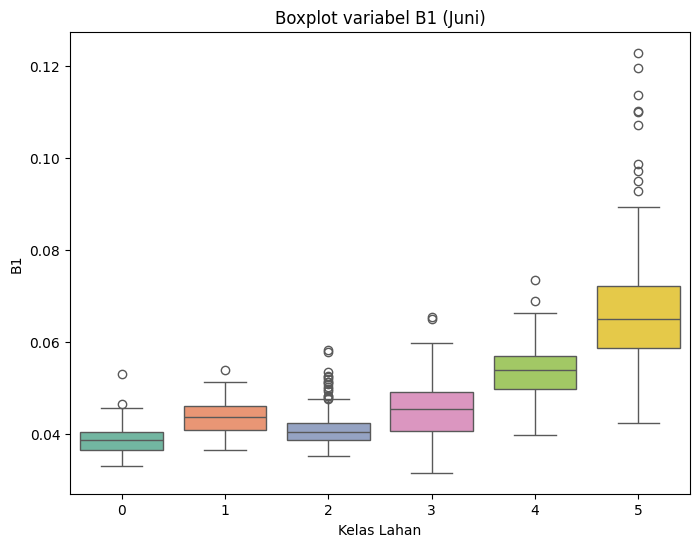

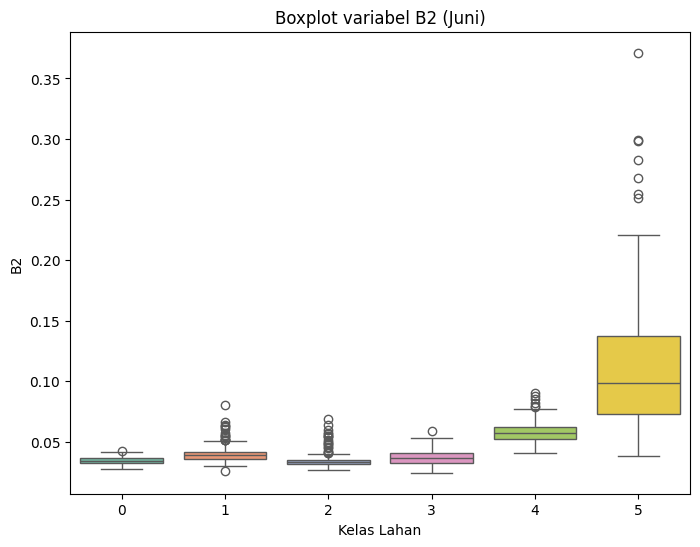

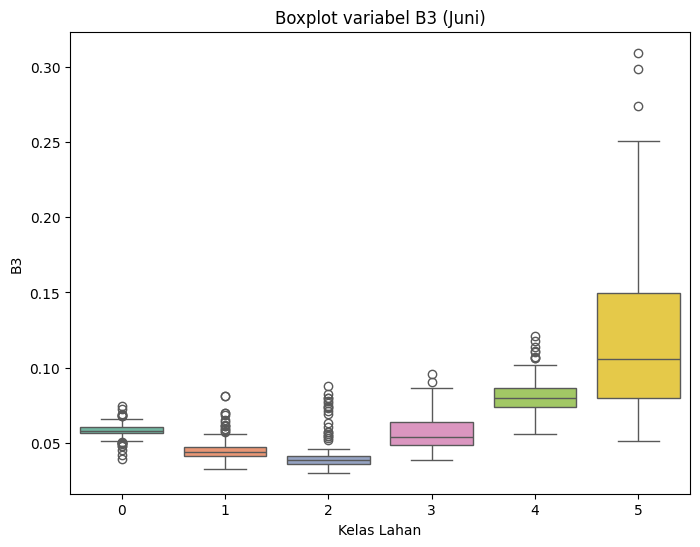

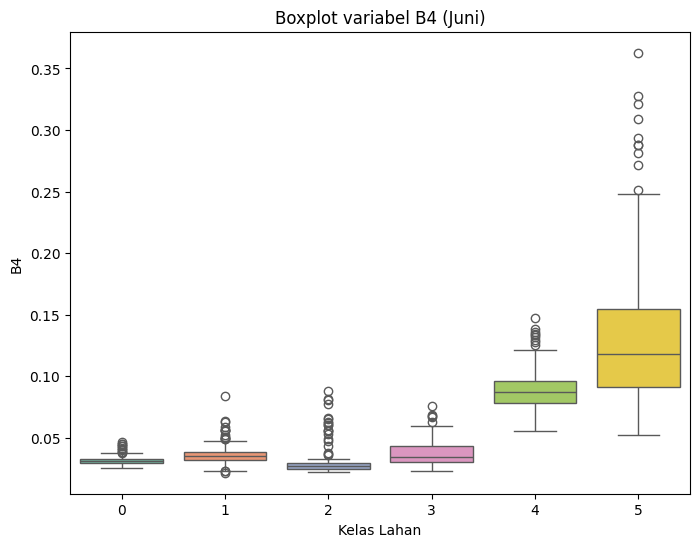

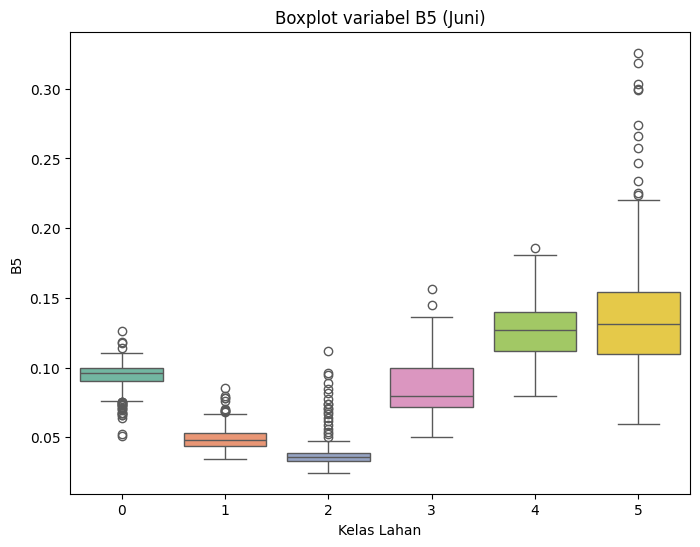

...

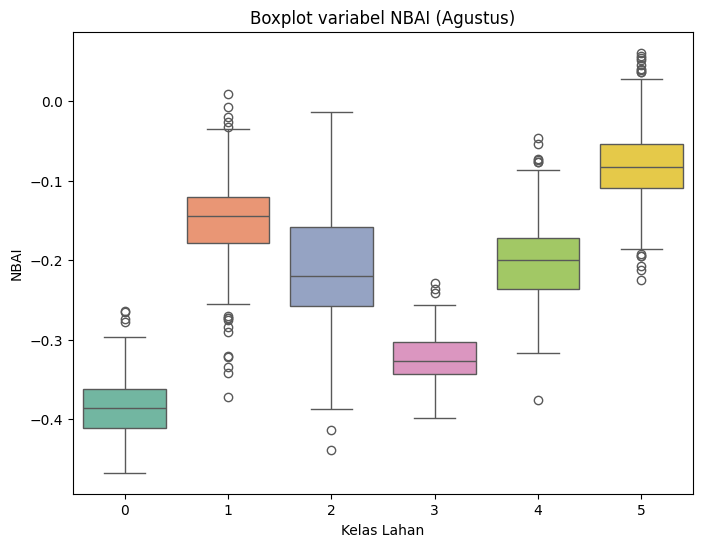

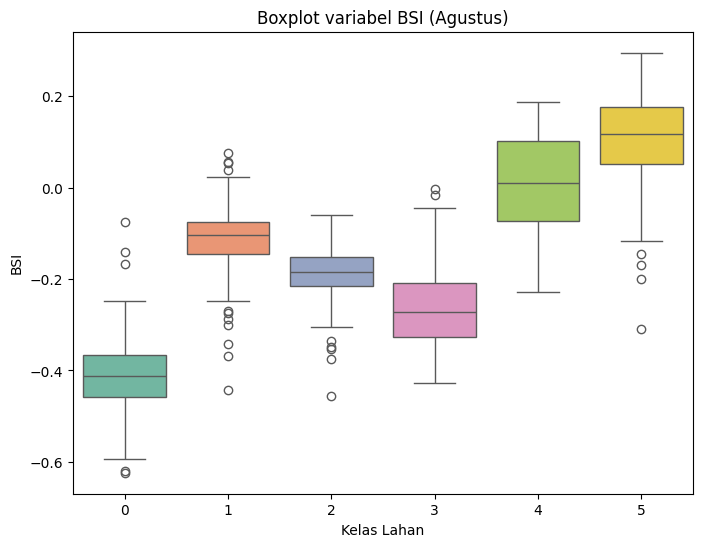

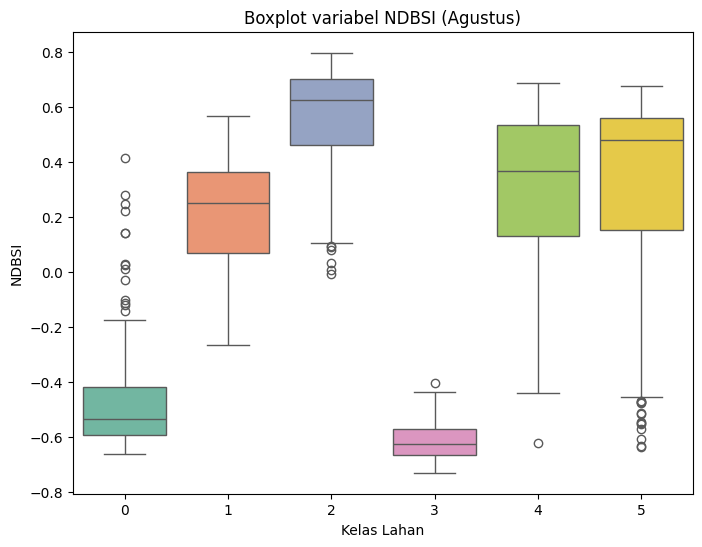

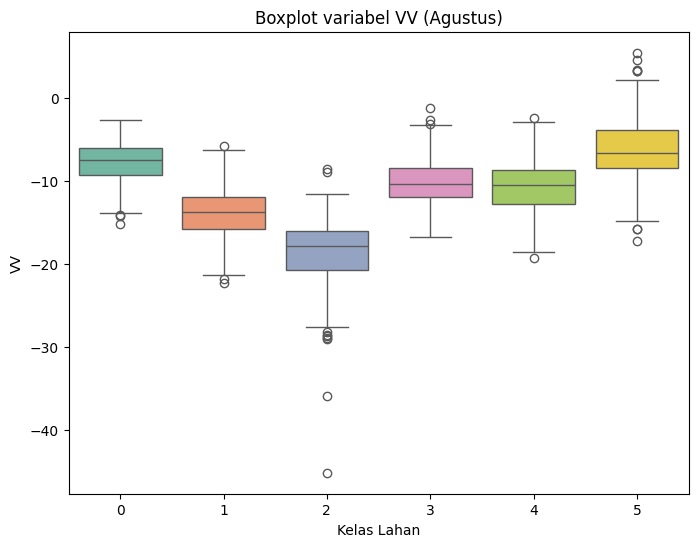

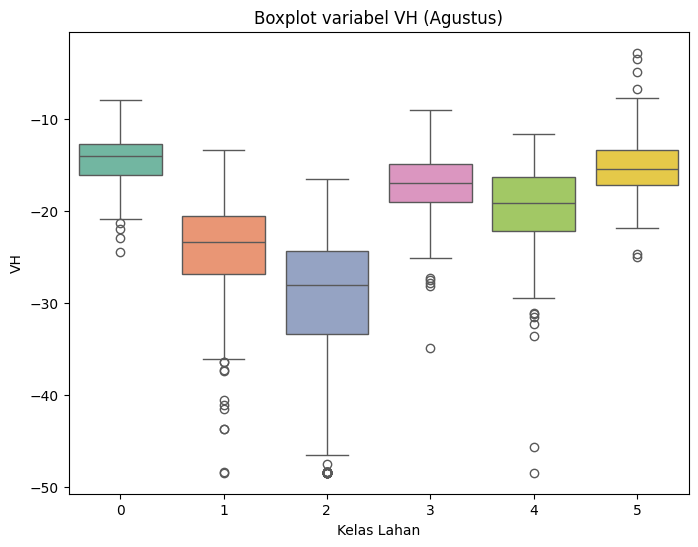


--- Outliers Teridentifikasi pada Data Juni ---
        system:index band  landcover_class      value
0             2_80_0   B1                5   0.085100
1              2_4_0   B1                5   0.078500
2            2_147_0   B1                5   0.076600
3            2_183_0   B1                5   0.079700
4             2_79_0   B1                5   0.085100
5            2_153_0   B1                5   0.075400
6             2_99_0   B1                5   0.075700
7            2_125_0   B1                5   0.092700
8             2_77_0   B1                5   0.119500
9             2_19_0   B1                5   0.075000
10           2_184_0   B1                5   0.113700
11           2_138_0   B1                5   0.098600
12            2_78_0   B1                5   0.122800
13           2_146_0   B1                5   0.078400
14           2_141_0   B1                5   0.074900
15            2_95_0   B1                5   0.075800
16            2_88_0   B1        

In [ ]:
# --- 3.1. Visualisasi Box Plot Individual (Identifikasi Outlier) ---

# Bagian ini membuat box plot untuk setiap variabel pada setiap bulan untuk
# memvisualisasikan distribusi dan mengidentifikasi outlier.

print("Memulai visualisasi box plot individual dan identifikasi outlier...")

# Dataset dan label per bulan, kita sertakan PATH ke data asli
data_dict = {
    "Juni": (x_raw_jun, y_jun, data_paths['Juni']),
    "Juli": (x_raw_jul, y_jul, data_paths['Juli']),
    "Agustus": (x_raw_ags, y_ags, data_paths['Agustus'])
}

# Dictionary untuk menyimpan informasi outlier
outliers_dict = {}

# Looping melalui setiap bulan
for month, (x_raw, y, sample_data_path) in data_dict.items():

    # ==============================================================================
    # Muat ulang DataFrame dari file CSV di dalam loop.
    # Ini memastikan kita selalu memiliki data asli dengan kolom 'system:index'.
    # ==============================================================================
    sample_data_df = pd.read_csv(sample_data_path)
    # ==============================================================================

    outlier_list = []

    # Looping melalui setiap variabel/band
    for i, band in enumerate(BANDS):
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=y, y=x_raw[:, i], hue=y, palette="Set2", legend=False)
        plt.title(f'Boxplot variabel {band} ({month})')
        plt.xlabel('Kelas Lahan')
        plt.ylabel(band)

        # Identifikasi outlier menggunakan metode IQR
        Q1 = np.percentile(x_raw[:, i], 25)
        Q3 = np.percentile(x_raw[:, i], 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers = ((x_raw[:, i] < lower_bound) | (x_raw[:, i] > upper_bound))
        outlier_indices = np.where(outliers)[0]
        plt.show()

        # Menambahkan informasi outlier ke dalam list
        for j in outlier_indices:
            # Mengambil 'system:index' dari DataFrame yang baru dimuat
            system_index = sample_data_df['system:index'].iloc[j]
            outlier_list.append({
                'system:index': system_index,
                'band': band,
                'landcover_class': y[j],
                'value': x_raw[j, i]
            })

    # Konversi list menjadi DataFrame
    outliers_dict[month] = pd.DataFrame(outlier_list)

# Menampilkan DataFrames yang berisi outlier
pd.set_option('display.max_rows', None)
for month, df in outliers_dict.items():
    print(f"\n--- Outliers Teridentifikasi pada Data {month} ---")
    if df.empty:
        print("Tidak ada outlier yang ditemukan.")
    else:
        print(df)


Memulai visualisasi box plot temporal per fitur...


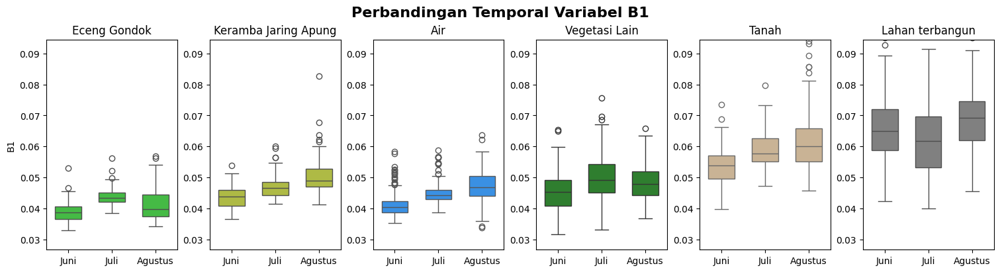

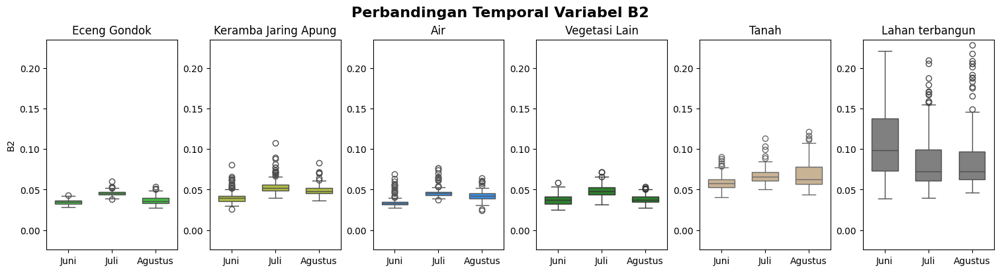

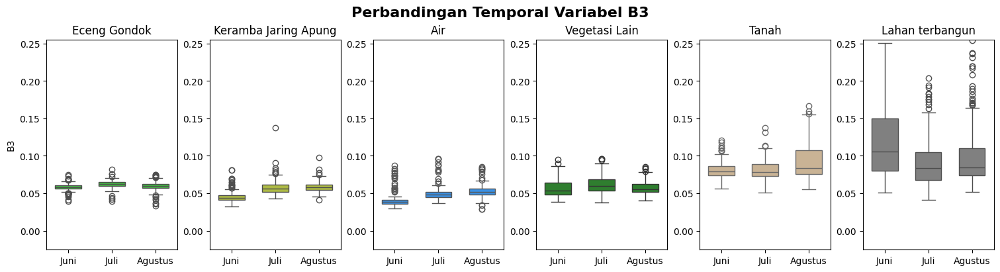

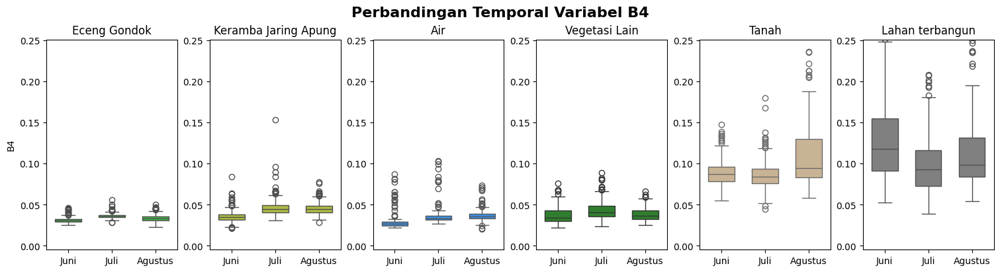

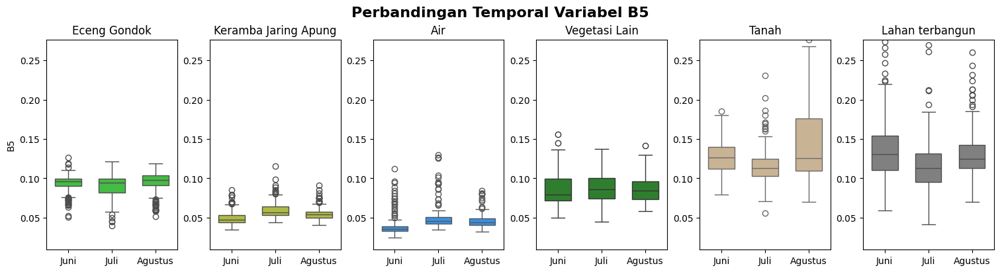

...

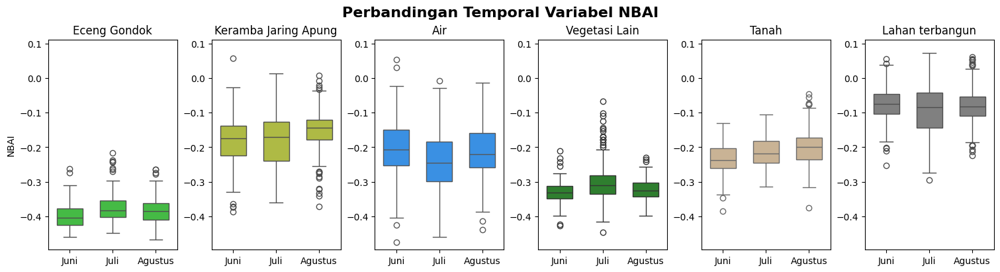

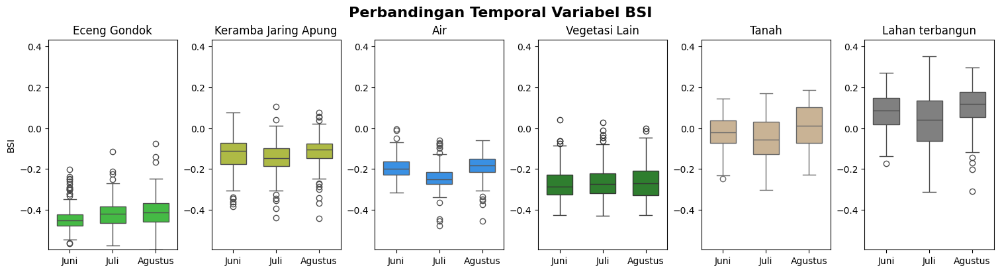

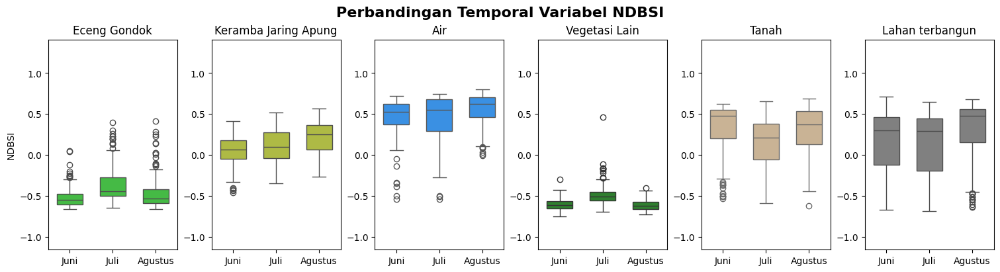

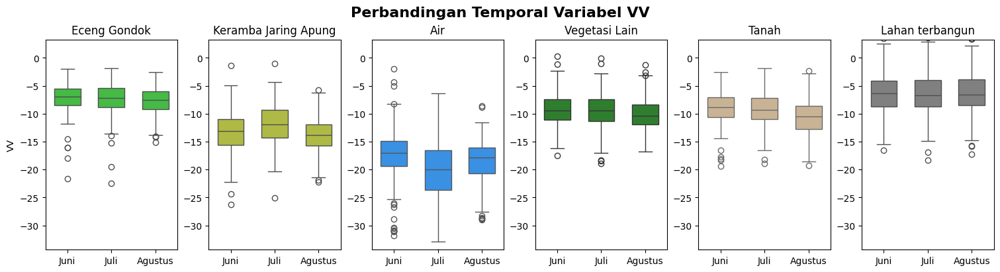

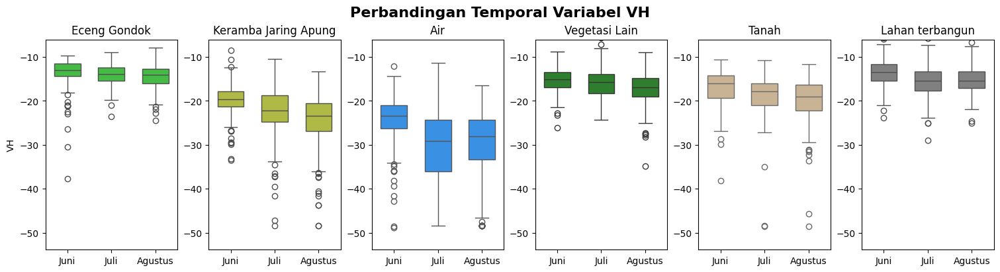


Visualisasi box plot temporal per fitur selesai. 📈


In [ ]:
# --- 3.2. Visualisasi Box Plot Temporal per Fitur ---

# Bagian ini bertujuan untuk memvisualisasikan perubahan (dinamika temporal) dari setiap fitur
# (band atau indeks) selama periode Juni, Juli, dan Agustus.
#
# Untuk setiap fitur, akan dibuat satu gambar (figure) yang terdiri dari beberapa subplot.
# Masing-masing subplot mewakili satu kelas tutupan lahan, yang menampilkan box plot
# untuk setiap bulan. Ini memungkinkan kita untuk membandingkan distribusi nilai
# sebuah fitur antar bulan untuk setiap kelas secara spesifik.

print("\nMemulai visualisasi box plot temporal per fitur...")

# --- Persiapan Data dan Konfigurasi ---
# Menggunakan data mentah yang sudah diekstrak sebelumnya
data_dict = {'Juni': x_raw_jun, 'Juli': x_raw_jul, 'Agustus': x_raw_ags}
labels_dict = {'Juni': y_jun, 'Juli': y_jul, 'Agustus': y_ags}

# Konversi informasi kelas dan palet warna untuk plotting
landcover_classes = {val: label for val, label in zip(lc_data["values"], lc_data["label"])}
PALETTE_DICT = {label: color for label, color in zip(lc_data["label"], lc_data["palette"])}

# --- Menghitung Batas Sumbu Y yang Konsisten ---
# Tujuannya adalah agar semua subplot dalam satu figure (untuk satu band) memiliki skala sumbu Y yang sama,
# sehingga perbandingan visual antar kelas menjadi valid.
# Batas dihitung berdasarkan nilai 'whisker' terendah dan tertinggi dari semua box plot.
y_lims = {}
for i, band in enumerate(BANDS):
    lower_whiskers = []
    upper_whiskers = []

    for class_val in landcover_classes:
        for month in data_dict:
            mask = labels_dict[month] == class_val
            if not mask.any():
                continue # Lewati jika tidak ada data untuk kombinasi ini

            values = data_dict[month][mask, i]
            Q1 = np.percentile(values, 25)
            Q3 = np.percentile(values, 75)
            IQR = Q3 - Q1
            lower = Q1 - 1.5 * IQR
            upper = Q3 + 1.5 * IQR
            lower_whiskers.append(lower)
            upper_whiskers.append(upper)

    # Simpan batas sumbu Y untuk band saat ini
    if lower_whiskers and upper_whiskers:
        y_lims[band] = (min(lower_whiskers), max(upper_whiskers))
    else:
        y_lims[band] = (0, 1) # Fallback jika tidak ada data

# --- Proses Plotting per Fitur ---
# Loop melalui setiap fitur untuk membuat satu plot terpisah per fitur
for i, band in enumerate(BANDS):
    y_min, y_max = y_lims[band]

    # Buat figure baru untuk setiap band, dengan subplot sebanyak jumlah kelas
    fig, axes = plt.subplots(1, len(landcover_classes), figsize=(15, 4), constrained_layout=True)
    fig.suptitle(f"Perbandingan Temporal Variabel {band}", fontsize=16, weight='bold')

    # Loop melalui setiap kelas tutupan lahan untuk membuat subplot
    for j, (class_val, class_label) in enumerate(landcover_classes.items()):
        ax = axes[j]

        # Kumpulkan data untuk kelas ini dari semua bulan
        data_per_class = {
            month: data_dict[month][labels_dict[month] == class_val, i]
            for month in data_dict.keys() if (labels_dict[month] == class_val).any()
        }

        # Jika tidak ada data untuk kelas ini, beri label dan lewati
        if not data_per_class:
            ax.set_title(f'{class_label}\n(Data tidak tersedia)', fontsize=10)
            ax.set_yticklabels([])
            ax.set_xticklabels([])
            ax.tick_params(axis='both', which='both', length=0)
            continue

        # Konversi data ke format DataFrame yang sesuai untuk Seaborn
        df_plot = pd.DataFrame({
            "Value": np.concatenate(list(data_per_class.values())),
            "Timestamp": np.repeat(list(data_per_class.keys()), [len(v) for v in data_per_class.values()])
        })

        # Buat box plot untuk membandingkan data antar bulan
        sns.boxplot(x="Timestamp", y="Value", data=df_plot, ax=ax,
                    color=PALETTE_DICT[class_label], width=0.6)

        ax.set_title(f'{class_label}', fontsize=12)
        ax.set_xlabel('')
        # Hanya tampilkan label sumbu Y pada subplot paling kiri
        ax.set_ylabel(band if j == 0 else '')
        # Terapkan batas sumbu Y yang konsisten
        ax.set_ylim(y_min, y_max)

    # Simpan dan tampilkan figure untuk band saat ini
    plt.savefig(f"{BASE_PATH}/Perbandingan_Temporal_{band}.svg", format="svg", bbox_inches='tight')
    plt.show()

print("\nVisualisasi box plot temporal per fitur selesai. 📈")


Memulai visualisasi perbandingan spesifik: Eceng Gondok vs. Vegetasi Lain...


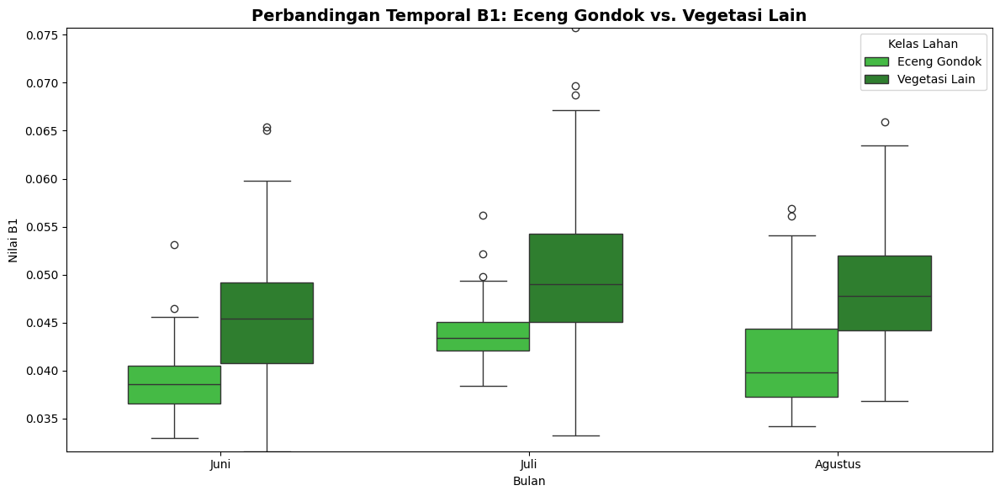

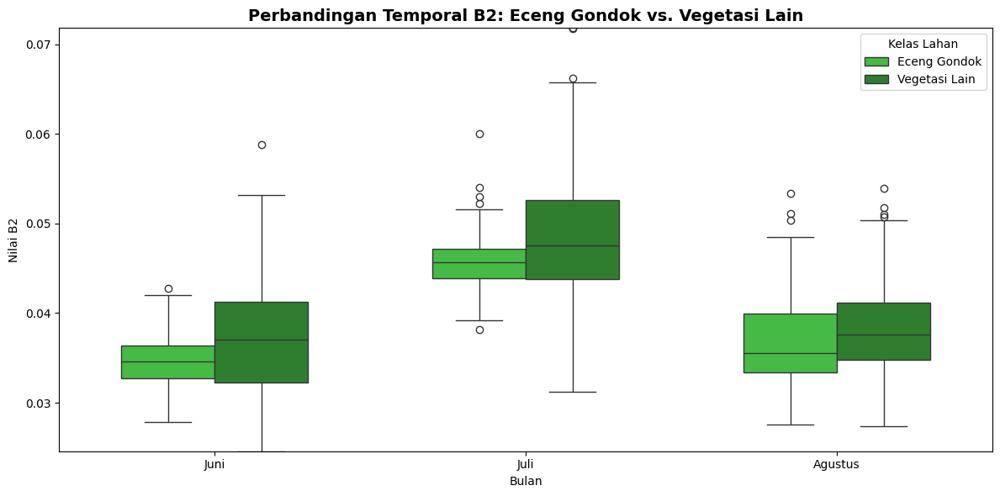

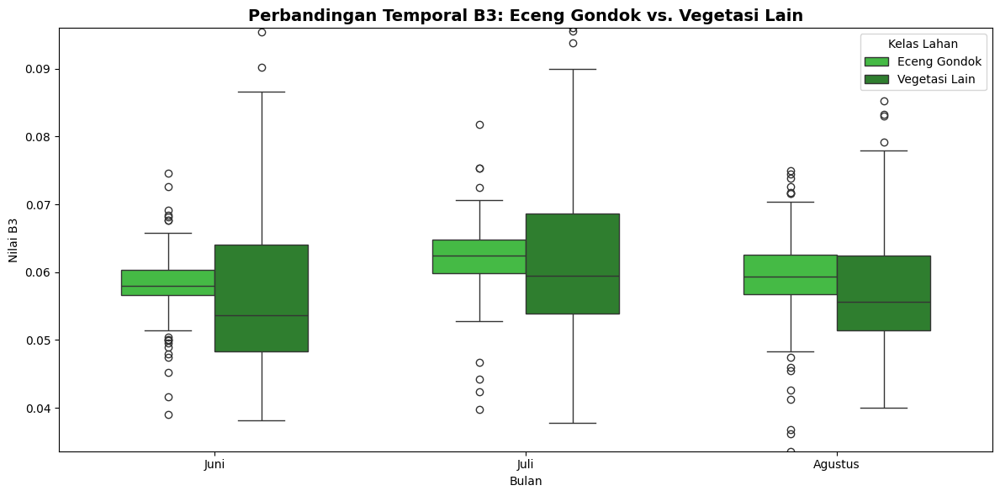

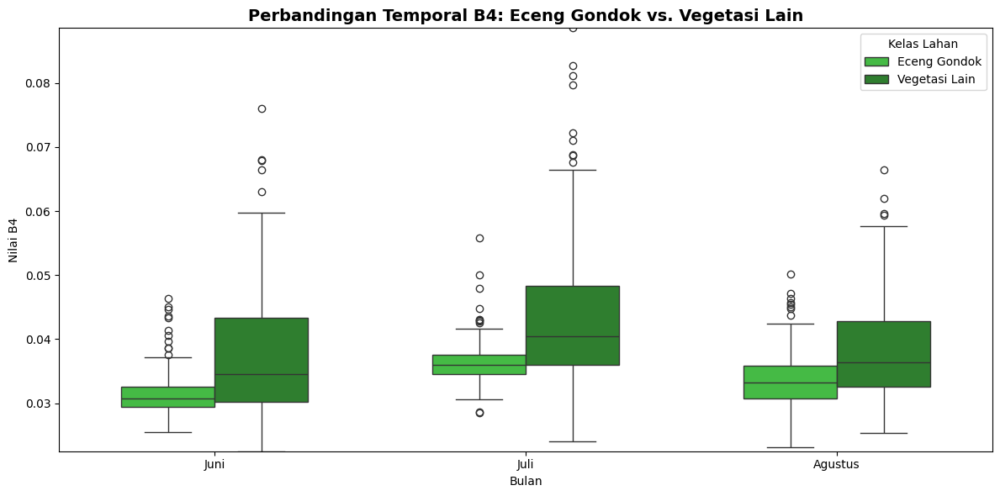

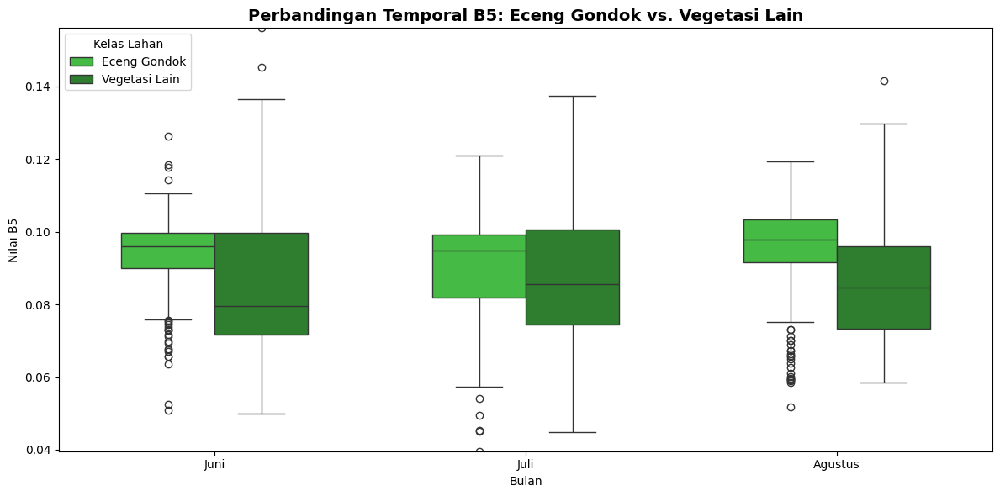

...

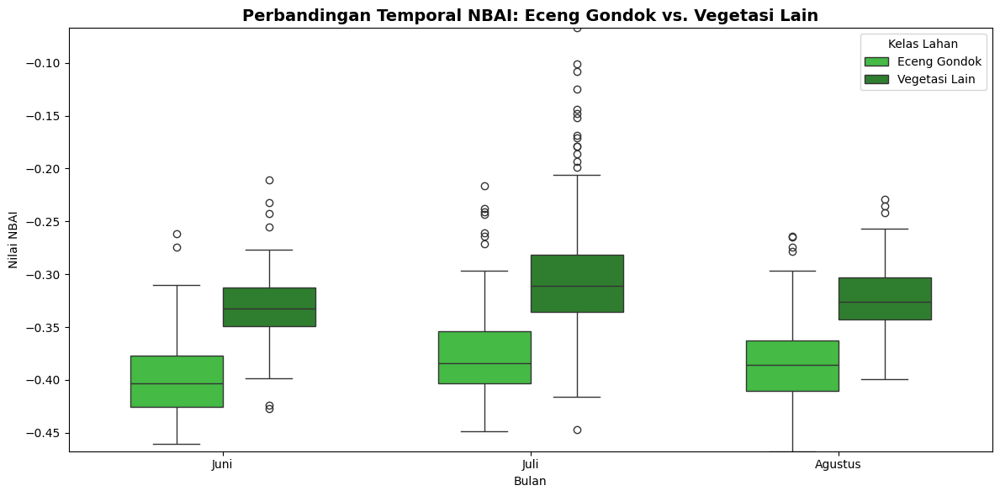

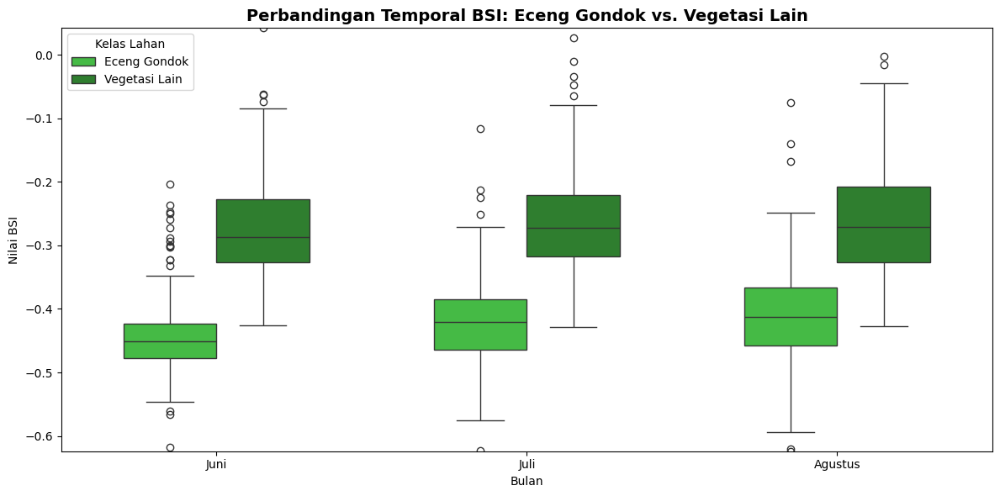

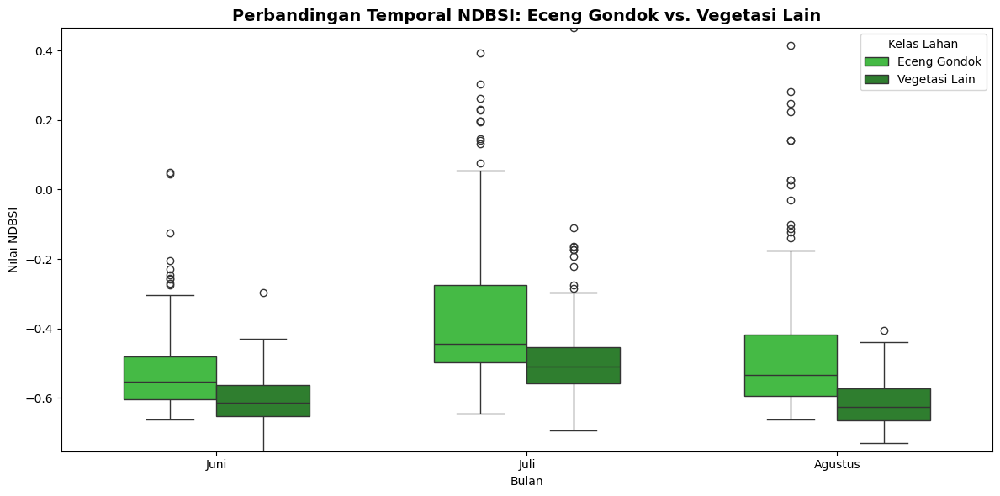

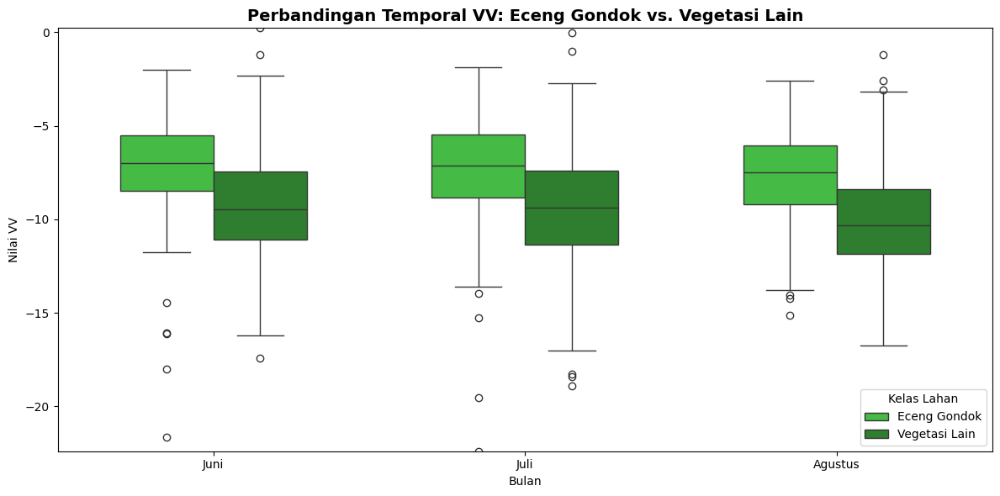

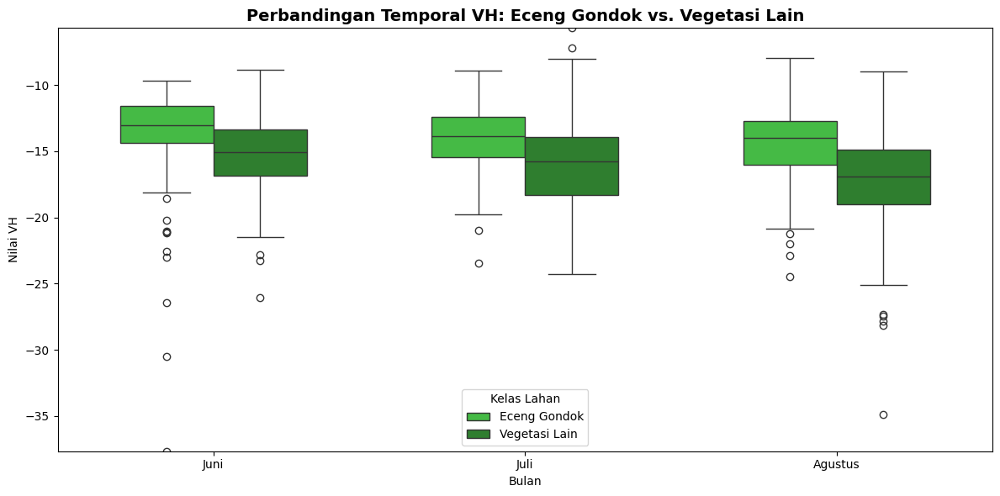


Visualisasi perbandingan spesifik selesai. 🌿


In [ ]:
# --- 3.3. Perbandingan Spesifik: Eceng Gondok vs. Vegetasi Lain ---

# Bagian ini melakukan analisis yang lebih terfokus untuk membandingkan secara langsung
# antara kelas 'Eceng Gondok' dan 'Vegetasi Lain'. Kedua kelas ini seringkali memiliki
# karakteristik spektral yang mirip, sehingga perbandingan langsung ini penting untuk
# menemukan fitur-fitur yang paling efektif dalam membedakan keduanya dari waktu ke waktu.

print("\nMemulai visualisasi perbandingan spesifik: Eceng Gondok vs. Vegetasi Lain...")

# --- Persiapan Data dan Konfigurasi ---
# Definisikan kelas yang akan dibandingkan dan palet warnanya
selected_classes = {0: "Eceng Gondok", 3: "Vegetasi Lain"}
palette = {"Eceng Gondok": "#32CD32", "Vegetasi Lain": "#228B22"}

# Menggunakan data mentah yang sudah diekstrak sebelumnya
data_dict = {'Juni': x_raw_jun, 'Juli': x_raw_jul, 'Agustus': x_raw_ags}
labels_dict = {'Juni': y_jun, 'Juli': y_jul, 'Agustus': y_ags}

# --- Menghitung Batas Sumbu Y yang Konsisten ---
# Batas sumbu Y dihitung berdasarkan nilai minimum dan maksimum absolut dari data
# untuk kedua kelas di semua bulan. Ini memastikan semua data point, termasuk outlier,
# akan terlihat di dalam plot.
y_lims = {}
for i, band in enumerate(BANDS):
    # Kumpulkan semua nilai dari kelas dan bulan yang relevan
    all_values = [
        data_dict[month][labels_dict[month] == cls, i]
        for month in data_dict.keys()
        for cls in selected_classes.keys()
        if (labels_dict[month] == cls).any()
    ]

    # Hitung min dan max dari gabungan semua nilai
    if all_values:
        concatenated_values = np.concatenate(all_values)
        y_lims[band] = (np.min(concatenated_values), np.max(concatenated_values))
    else:
        y_lims[band] = (0, 1) # Fallback

# --- Proses Plotting per Fitur ---
# Loop untuk membuat satu plot terpisah untuk setiap fitur (band)
for i, band in enumerate(BANDS):
    # Ambil batas sumbu Y yang sudah dihitung untuk band ini
    y_min, y_max = y_lims[band]

    # Gunakan list untuk menampung DataFrame sementara secara efisien
    list_of_dfs = []

    # Kumpulkan data dari semua bulan untuk kelas yang dipilih
    for month in data_dict:
        x = data_dict[month]
        y = labels_dict[month]

        for cls_val, cls_label in selected_classes.items():
            mask = y == cls_val
            if np.any(mask):
                temp_df = pd.DataFrame({
                    "Value": x[mask, i],
                    "Timestamp": [month] * np.sum(mask),
                    "Landcover Class": [cls_label] * np.sum(mask)
                })
                list_of_dfs.append(temp_df)

    # Lewati jika tidak ada data sama sekali untuk band ini
    if not list_of_dfs:
        print(f"Melewatkan band '{band}', tidak ada data untuk kelas yang dipilih.")
        continue

    # Gabungkan semua DataFrame dalam list menjadi satu
    df_plot = pd.concat(list_of_dfs, ignore_index=True)

    # --- Membuat Plot ---
    plt.figure(figsize=(12, 6))
    sns.boxplot(
        x="Timestamp",
        y="Value",
        hue="Landcover Class",
        data=df_plot,
        palette=palette,
        dodge=True, # Membuat boxplot bersebelahan
        width=0.6
    )

    plt.title(f"Perbandingan Temporal {band}: Eceng Gondok vs. Vegetasi Lain", fontsize=14, weight='bold')
    plt.xlabel("Bulan")
    plt.ylabel(f"Nilai {band}")
    plt.ylim(y_min, y_max)
    plt.legend(title="Kelas Lahan", loc="best", frameon=True)
    plt.tight_layout()

    # Simpan dan tampilkan plot
    plt.savefig(f"{BASE_PATH}/Perbandingan_Spesifik_{band}_Eceng_vs_Vegetasi.svg", dpi=300)
    plt.show()

print("\nVisualisasi perbandingan spesifik selesai. 🌿")

## 4. Kurva Spektral

In [ ]:
# --- 4.1. Persiapan Data dan Fungsi Plotting ---

# Persiapan data mentah per bulan
data_dict = {"Juni": x_raw_jun, "Juli": x_raw_jul, "Agustus": x_raw_ags}
labels_dict = {'Juni': y_jun, 'Juli': y_jul, 'Agustus': y_ags}

# Konfigurasi panjang gelombang dan nama band Sentinel-2
sentinel2_wavelengths = {
    "B1": 443, "B2": 490, "B3": 560, "B4": 665, "B5": 705, "B6": 740, "B7": 783,
    "B8": 842, "B8A": 865, "B9": 945, "B11": 1610, "B12": 2190
}

# --- Filter pita dan panjang gelombang yang diinginkan ---
selected_bands = ["B1", "B3", "B4", "B6", "B8", "B9", "B11", "B12"]
selected_wavelengths = {
    "B1": 443,
    "B3": 560,
    "B4": 665,
    "B6": 740,
    "B8": 842,
    "B9": 945,
    "B11": 1610,
    "B12": 2190
}

# Update konfigurasi plotting
s2_bands = selected_bands
s2_wl = [selected_wavelengths[b] for b in selected_bands]
s2_indices_in_bands = [BANDS.index(b) for b in selected_bands]

# Update label sumbu X
all_tick_band_names = selected_bands
all_tick_wavelengths = s2_wl

# Hitung batas sumbu Y global agar skala semua plot konsisten
# Menggunakan persentil untuk menghindari outlier ekstrem yang merusak skala
all_s2_values = np.concatenate([x_raw[:, s2_indices_in_bands] for x_raw in data_dict.values()])
y_min_global = np.percentile(all_s2_values, 1)
y_max_global = np.percentile(all_s2_values, 99)

# Konversi informasi kelas dan palet warna
landcover_classes = {val: label for val, label in zip(lc_data["values"], lc_data["label"])}
palette_dict = {label: color for label, color in zip(lc_data["label"], lc_data["palette"])}

# --- Fungsi Helper untuk Menggambar Satu Plot Spektral ---
def plot_spectral_curve_on_axis(ax, x_raw, y_labels, month):
    """Menggambar kurva spektral lengkap dengan IQR dan label pada axis yang diberikan."""

    # Gambar garis vertikal untuk setiap band
    for wl in s2_wl:
        ax.axvline(x=wl, color="gray", linestyle="--", linewidth=0.8, alpha=0.6)

    # Visualisasikan area sebaran (IQR) dan garis median untuk setiap kelas
    for class_val, class_label in landcover_classes.items():
        indices = np.where(y_labels == class_val)[0]
        if indices.size > 0:
            color = palette_dict[class_label]
            band_values = x_raw[indices][:, s2_indices_in_bands]

            lower_bound = np.percentile(band_values, 25, axis=0)
            upper_bound = np.percentile(band_values, 75, axis=0)
            median_reflectance = np.median(band_values, axis=0)

            ax.fill_between(s2_wl, lower_bound, upper_bound, color=color, alpha=0.3)
            ax.plot(s2_wl, median_reflectance, color=color, linewidth=2.5, zorder=3, label=class_label)

    # Konfigurasi Axis Utama (bawah)
    ax.set_title(f"Kurva Spektral Sentinel-2 - {month}", fontsize=14)
    ax.set_ylabel("Nilai Reflektansi")
    ax.legend(loc="best")
    ax.grid(False)
    ax.set_ylim(y_min_global, y_max_global)
    ax.set_xticks(all_tick_wavelengths)
    ax.set_xticklabels(all_tick_band_names, rotation=45, ha='right')
    ax.set_xlabel("Nama Pita")

    # Konfigurasi Axis Kedua (atas)
    ax2 = ax.twiny()
    ax2.set_xlim(ax.get_xlim())
    ax2.set_xticks(all_tick_wavelengths)
    ax2.set_xticklabels([f"{wl}" for wl in all_tick_wavelengths], rotation=0)
    ax2.set_xlabel("Panjang Gelombang (nm)")

print("Persiapan data dan fungsi plotting selesai.")

Persiapan data dan fungsi plotting selesai.



Membuat plot gabungan (1x3)...


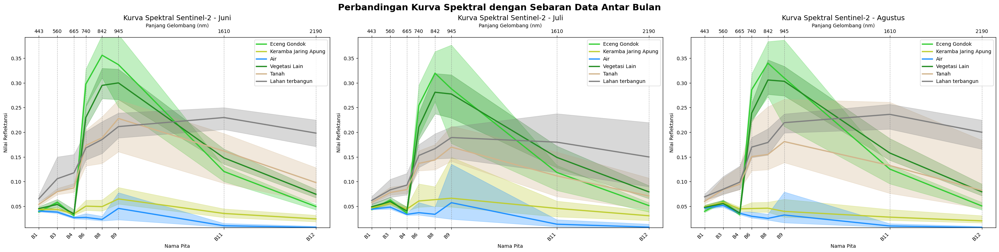


Membuat plot terpisah untuk setiap bulan...


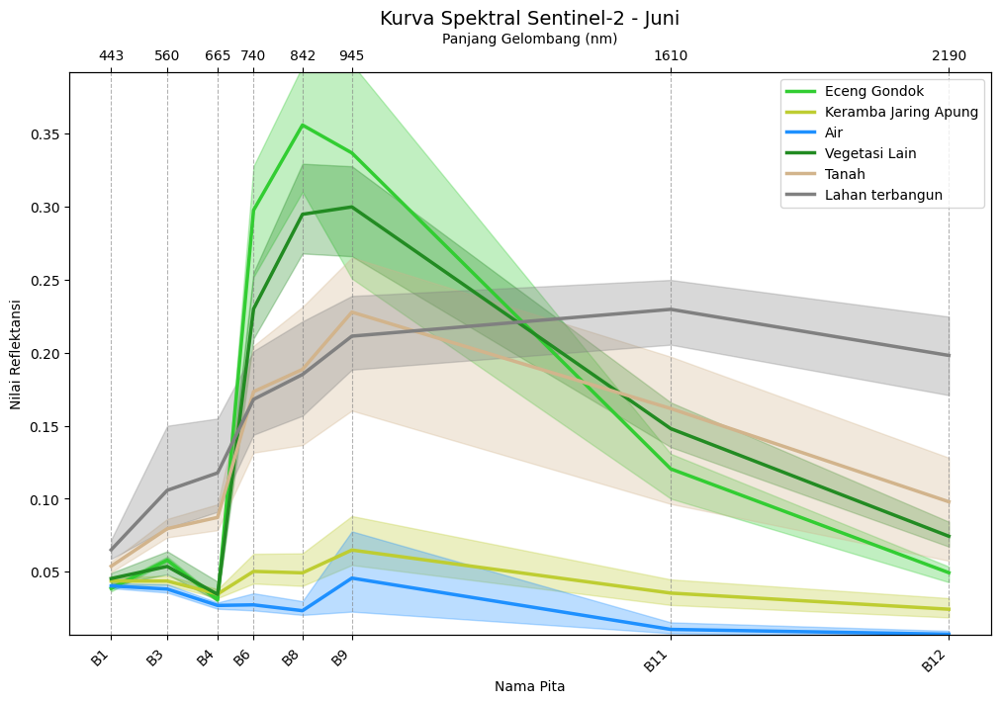

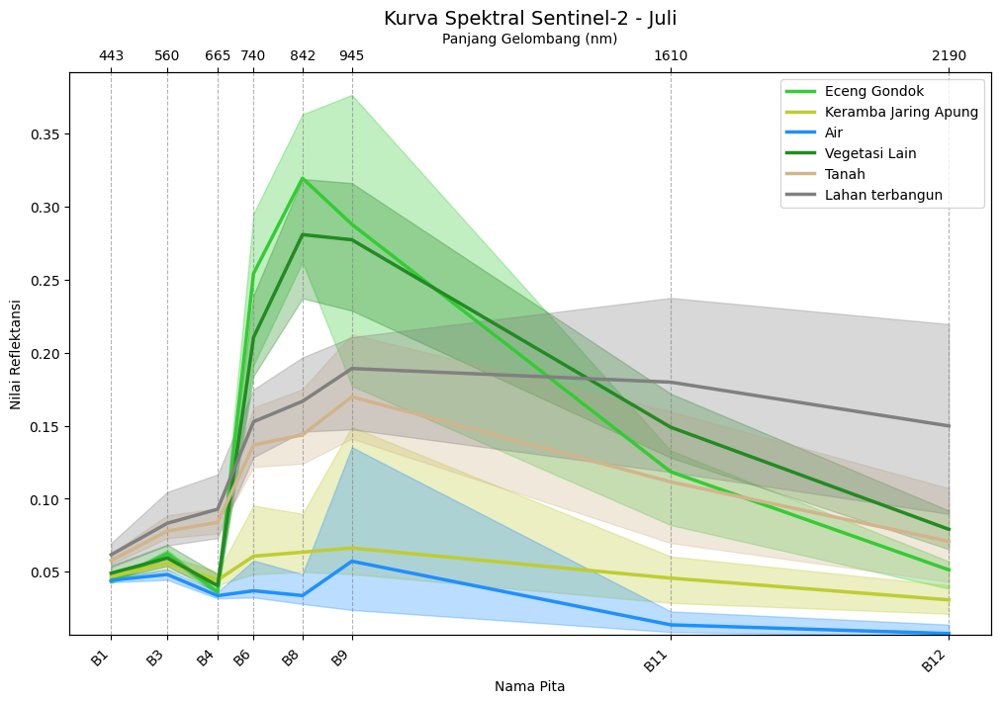

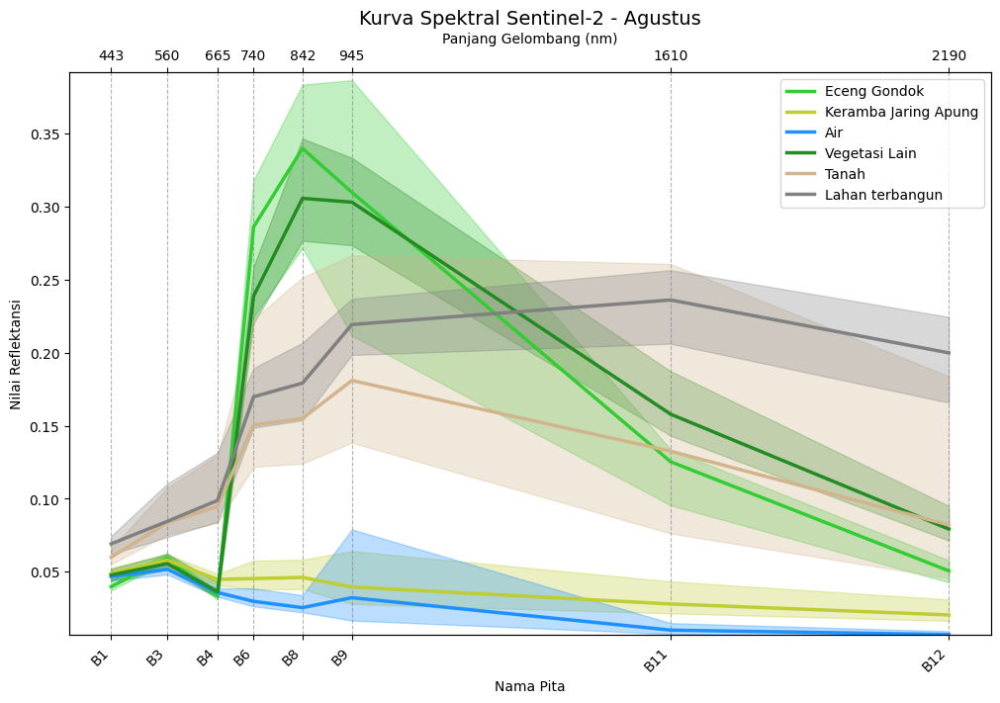


Semua visualisasi kurva spektral selesai dibuat. 🛰️


In [ ]:
# --- 4.2. Visualisasi Kurva Spektral ---

# OUTPUT 1: Menampilkan semua bulan dalam satu figure (1x3)
print("\nMembuat plot gabungan (1x3)...")
fig_gabungan, axes = plt.subplots(1, 3, figsize=(28, 7), constrained_layout=True)
fig_gabungan.suptitle("Perbandingan Kurva Spektral dengan Sebaran Data Antar Bulan", fontsize=18, weight='bold')

for i, month in enumerate(data_dict.keys()):
    plot_spectral_curve_on_axis(axes[i], data_dict[month], labels_dict[month], month)

plt.savefig(f"{BASE_PATH}/Kurva_Spektral_Distribusi_Gabungan.svg")
plt.show()

# OUTPUT 2: Menampilkan setiap bulan dalam figure terpisah
print("\nMembuat plot terpisah untuk setiap bulan...")
for month in data_dict.keys():
    fig_terpisah, ax = plt.subplots(1, 1, figsize=(10, 7), constrained_layout=True)

    plot_spectral_curve_on_axis(ax, data_dict[month], labels_dict[month], month)

    plt.savefig(f"{BASE_PATH}/Kurva_Spektral_Distribusi_{month}.svg")
    plt.show()
    plt.close(fig_terpisah) # Tutup figure untuk menghemat memori

print("\nSemua visualisasi kurva spektral selesai dibuat. 🛰️")

## 5. JNB

### 5.1. Pemilihan Variabel dengan Natural Jenks Breaks

Mencari jumlah level optimal dengan Elbow Plot GVF...


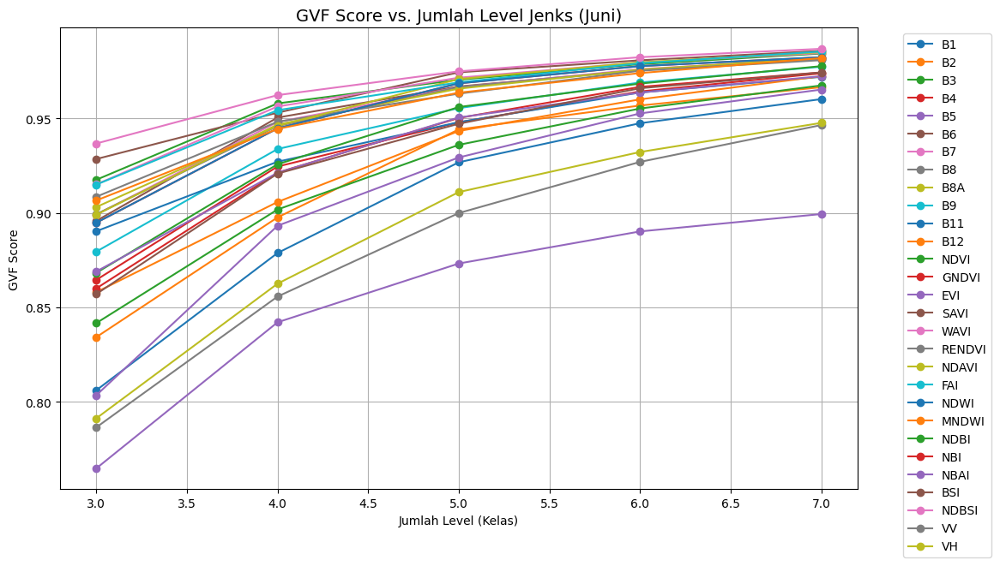

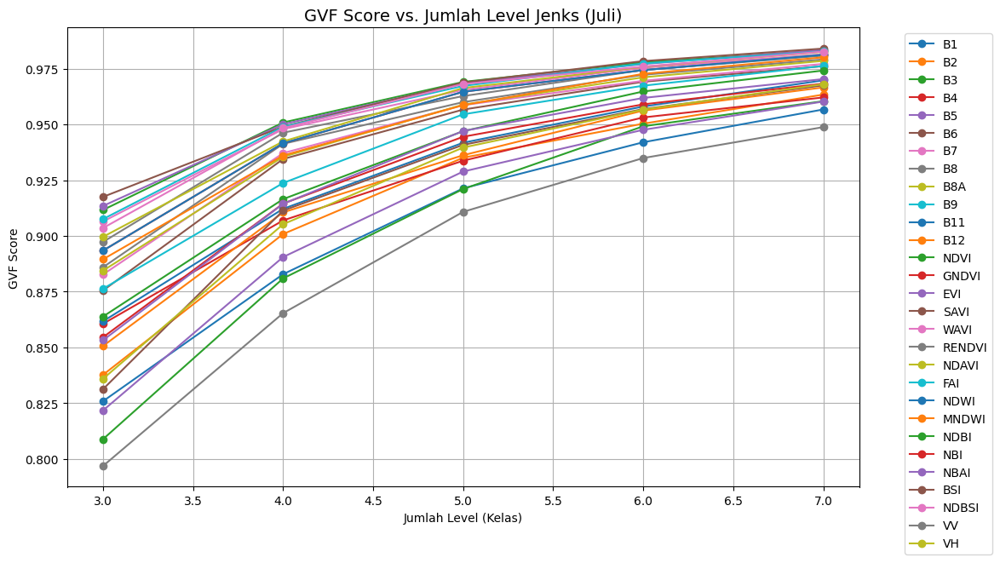

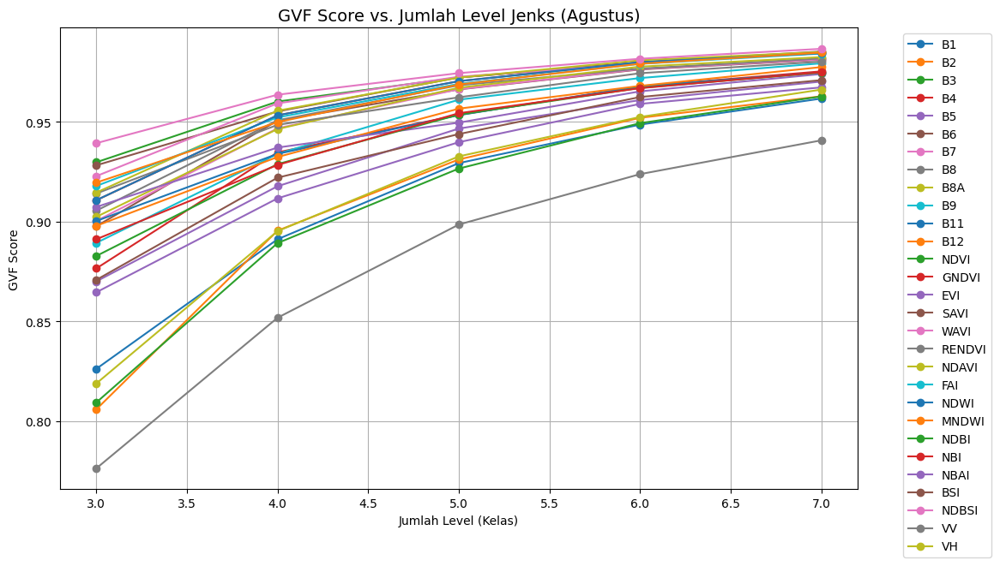


Menghitung GVF Rank dan Interval Jenks untuk 5 level...

--- GVF Score & Rank untuk Juni ---
   Variabel  GVF Score  GVF Rank
0        B1       0.93        25
1        B2       0.94        22
2        B3       0.94        22
3        B4       0.95        17
4        B5       0.93        25
5        B6       0.97         1
6        B7       0.97         1
7        B8       0.97         1
8       B8A       0.97         1
9        B9       0.96        13
10      B11       0.95        17
11      B12       0.94        22
12     NDVI       0.97         1
13    GNDVI       0.97         1
14      EVI       0.87        29
15     SAVI       0.97         1
16     WAVI       0.97         1
17   RENDVI       0.96        13
18    NDAVI       0.97         1
19      FAI       0.97         1
20     NDWI       0.97         1
21    MNDWI       0.96        13
22     NDBI       0.96        13
23      NBI       0.95        17
24     NBAI       0.95        17
25      BSI       0.95        17
26    NDBSI    

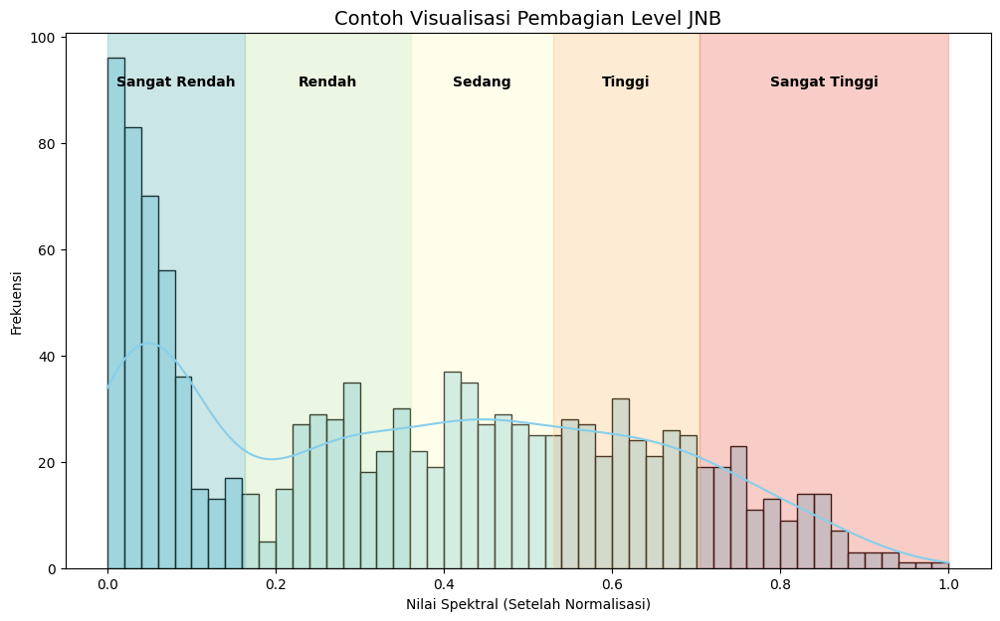

CPU times: user 8.03 s, sys: 80.4 ms, total: 8.11 s
Wall time: 12.1 s


In [ ]:
%%time
# --- 5.1. Analisis Fitur dengan Jenks Natural Breaks (JNB) ---

# --- Fungsi Helper untuk GVF ---
def gvf_value(array, n_classes):
    """Menghitung nilai Goodness of Variance Fit (GVF)."""
    try:
        breaks = jenkspy.jenks_breaks(array, n_classes)
    except Exception:
        return 0.0 # Gagal membuat breaks, GVF dianggap 0

    sdam = np.sum((array - array.mean()) ** 2)
    if sdam == 0: return 1.0 # Jika semua nilai sama, varians total 0

    sdcm = 0
    for i in range(len(breaks) - 1):
        class_values = array[(array >= breaks[i]) & (array < breaks[i+1])]
        if i == len(breaks) - 2:
            class_values = array[(array >= breaks[i]) & (array <= breaks[i+1])]
        if len(class_values) > 1:
            sdcm += np.sum((class_values - class_values.mean()) ** 2)

    return (sdam - sdcm) / sdam if sdam > 0 else 0.0

# --- Tahap 1: Menentukan Jumlah Level Optimal (Elbow Plot) ---
print("Mencari jumlah level optimal dengan Elbow Plot GVF...")
LEVEL_RANGE = range(3, 8)
for month, x_scaled in x_scaled_data.items():
    gvf_results = {level: [gvf_value(x_scaled[:, i], level) for i in range(x_scaled.shape[1])] for level in LEVEL_RANGE}
    plt.figure(figsize=(12, 7))
    for i, band in enumerate(BANDS):
        gvf_scores = [gvf_results[level][i] for level in LEVEL_RANGE]
        plt.plot(list(LEVEL_RANGE), gvf_scores, marker='o', label=band)
    plt.title(f"GVF Score vs. Jumlah Level Jenks ({month})", fontsize=14)
    plt.xlabel("Jumlah Level (Kelas)")
    plt.ylabel("GVF Score")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.show()

# --- Tahap 2: Menghitung Peringkat GVF dan Interval Breaks ---
N_LEVELS = 5
print(f"\nMenghitung GVF Rank dan Interval Jenks untuk {N_LEVELS} level...")

# ==============================================================================
# PERBAIKAN: Buat pemetaan eksplisit untuk menghindari KeyError
# ==============================================================================
MONTH_ABBREVIATIONS = {
    "Juni": "JUN",
    "Juli": "JUL",
    "Agustus": "AGS"
}
# ==============================================================================

all_intervals = {}
all_breaks_list_for_csv = []

for month, x_scaled in x_scaled_data.items():
    gvf_scores = [round(gvf_value(x_scaled[:, i], N_LEVELS), 2) for i in range(x_scaled.shape[1])]
    df_gvf = pd.DataFrame({'Variabel': BANDS, 'GVF Score': gvf_scores})
    df_gvf['GVF Rank'] = df_gvf['GVF Score'].rank(ascending=False, method='min').astype(int)
    # df_gvf = df_gvf.sort_values('GVF Rank')

    print(f"\n--- GVF Score & Rank untuk {month} ---")
    print(df_gvf)

    # Gunakan pemetaan untuk membuat nama variabel yang benar
    variable_name = f'GVF_PATH_{MONTH_ABBREVIATIONS[month]}'
    gvf_path = globals()[variable_name]

    df_gvf.to_excel(gvf_path, index=False)
    print(f"Hasil GVF untuk {month} disimpan ke {gvf_path}")

    intervals = {BANDS[i]: jenkspy.jenks_breaks(x_scaled[:, i], N_LEVELS) for i in range(x_scaled.shape[1])}
    all_intervals[month] = intervals
    for var, breaks in intervals.items():
        row = {'month': month.lower(), 'variable': var}
        row.update({f'break_{i}': b for i, b in enumerate(breaks)})
        all_breaks_list_for_csv.append(row)

df_breaks = pd.DataFrame(all_breaks_list_for_csv)
df_breaks.to_csv(f"{BASE_PATH}/jenks_breaks_intervals_all.csv", index=False)
print(f"\nFile 'jenks_breaks_intervals_all.csv' berhasil dibuat.")

# --- Tahap 3: Contoh Visualisasi Partisi JNB ---
band_to_visualize = 'B8'
month_to_visualize = 'Juni'
band_data = x_scaled_data[month_to_visualize][:, BANDS.index(band_to_visualize)]
jenks_breaks = all_intervals[month_to_visualize][band_to_visualize]
labels = ["Sangat Rendah", "Rendah", "Sedang", "Tinggi", "Sangat Tinggi"]

plt.figure(figsize=(12, 7))
sns.histplot(band_data, bins=50, kde=True, color="skyblue")
for i in range(len(jenks_breaks)-1):
    plt.axvspan(jenks_breaks[i], jenks_breaks[i+1], color=sns.color_palette("Spectral_r", n_colors=5)[i], alpha=0.3)
    mid_point = (jenks_breaks[i] + jenks_breaks[i+1]) / 2
    plt.text(mid_point, plt.ylim()[1]*0.9, labels[i], ha='center', fontsize=10, fontweight='bold')
plt.title(f"Contoh Visualisasi Pembagian Level JNB", fontsize=14)
plt.xlabel("Nilai Spektral (Setelah Normalisasi)")
plt.ylabel("Frekuensi")
plt.savefig(f"{BASE_PATH}/Visualisasi_JNB_{band_to_visualize}_{month_to_visualize}.svg", format="svg", bbox_inches='tight')
plt.show()

### 5.2. Agregasi Mean/Median Berdasarkan Variabel dan Kelas

In [ ]:
# --- 5.2. Agregasi Nilai Fitur per Kelas (Disesuaikan) ---

def aggregate_feature_values_original_format(x_data, y_data, bands, class_info, method='median'):
    """Menghitung nilai agregat dan mengembalikannya dalam format DataFrame asli."""
    agg_func = np.median if method == 'median' else np.mean

    class_labels = class_info["label"]
    class_values = class_info["values"]

    # Buat dictionary dengan kelas sebagai kunci
    data_for_df = {}
    for label, val in zip(class_labels, class_values):
        mask = (y_data == val)
        if np.any(mask):
            data_for_df[label] = agg_func(x_data[mask], axis=0)
        else:
            data_for_df[label] = [np.nan] * len(bands)

    df_agg = pd.DataFrame(data_for_df)
    df_agg['Feature'] = bands # Tambahkan kolom 'Feature'

    # Atur ulang urutan kolom
    final_order = ['Feature'] + class_labels
    df_agg = df_agg[final_order]

    return df_agg

# Lakukan agregasi untuk semua bulan menggunakan format baru
all_median_values_original_format = {
    month: aggregate_feature_values_original_format(
        x_scaled_data[month], y_labels[month], BANDS, lc_data, 'median'
    ) for month in x_scaled_data.keys()
}

print("Agregasi nilai median (format asli) per kelas selesai.")
print("\nContoh Hasil Agregasi Median Format Asli - Juni:")
print(all_median_values_original_format['Juni'])

Agregasi nilai median (format asli) per kelas selesai.

Contoh Hasil Agregasi Median Format Asli - Juni:
   Feature  Eceng Gondok  Keramba Jaring Apung       Air  Vegetasi Lain  \
0       B1      0.076754              0.132675  0.095943       0.151316   
1       B2      0.028852              0.042701  0.024812       0.035776   
2       B3      0.100143              0.048999  0.029328       0.084764   
3       B4      0.027249              0.038969  0.016115       0.038236   
4       B5      0.237226              0.077140  0.036662       0.182979   
5       B6      0.752017              0.087144  0.025551       0.570334   
6       B7      0.743171              0.084863  0.031796       0.623824   
7       B8      0.711850              0.074636  0.020790       0.584823   
8      B8A      0.742815              0.088088  0.026760       0.626406   
9       B9      0.717459              0.113727  0.071080       0.635384   
10     B11      0.257902              0.067362  0.011657       0.31965

### 5.3.Pembuatan Heatmap


Membuat heatmap untuk bulan Juni (struktur asli)...

--- Hasil Array Level (Juni) ---
['B1', 1, 2, 1, 2, 3, 4]
['B2', 1, 1, 1, 1, 2, 3]
['B3', 2, 1, 1, 2, 3, 3]
['B4', 1, 1, 1, 1, 2, 3]
['B5', 3, 1, 1, 2, 4, 4]
['B6', 5, 1, 1, 4, 3, 3]
['B7', 5, 1, 1, 4, 3, 2]
['B8', 5, 1, 1, 4, 3, 2]
['B8A', 5, 1, 1, 4, 3, 3]
['B9', 4, 1, 1, 4, 3, 3]
['B11', 2, 1, 1, 3, 3, 4]
['B12', 2, 1, 1, 2, 3, 4]
['NDVI', 5, 2, 1, 5, 4, 3]
['GNDVI', 5, 2, 1, 5, 4, 3]
['EVI', 5, 2, 2, 4, 3, 3]
['SAVI', 5, 1, 1, 4, 3, 2]
['WAVI', 5, 1, 1, 4, 3, 2]
['RENDVI', 5, 3, 1, 5, 4, 4]
['NDAVI', 5, 2, 1, 5, 4, 3]
['FAI', 5, 1, 1, 4, 2, 2]
['NDWI', 1, 4, 5, 1, 2, 3]
['MNDWI', 2, 4, 5, 1, 2, 2]
['NDBI', 1, 3, 2, 2, 3, 5]
['NBI', 1, 1, 1, 1, 2, 4]
['NBAI', 1, 4, 3, 2, 3, 5]
['BSI', 1, 4, 3, 2, 4, 5]
['NDBSI', 1, 3, 5, 1, 5, 4]
['VV', 4, 3, 2, 3, 4, 4]
['VH', 5, 3, 2, 4, 4, 5]


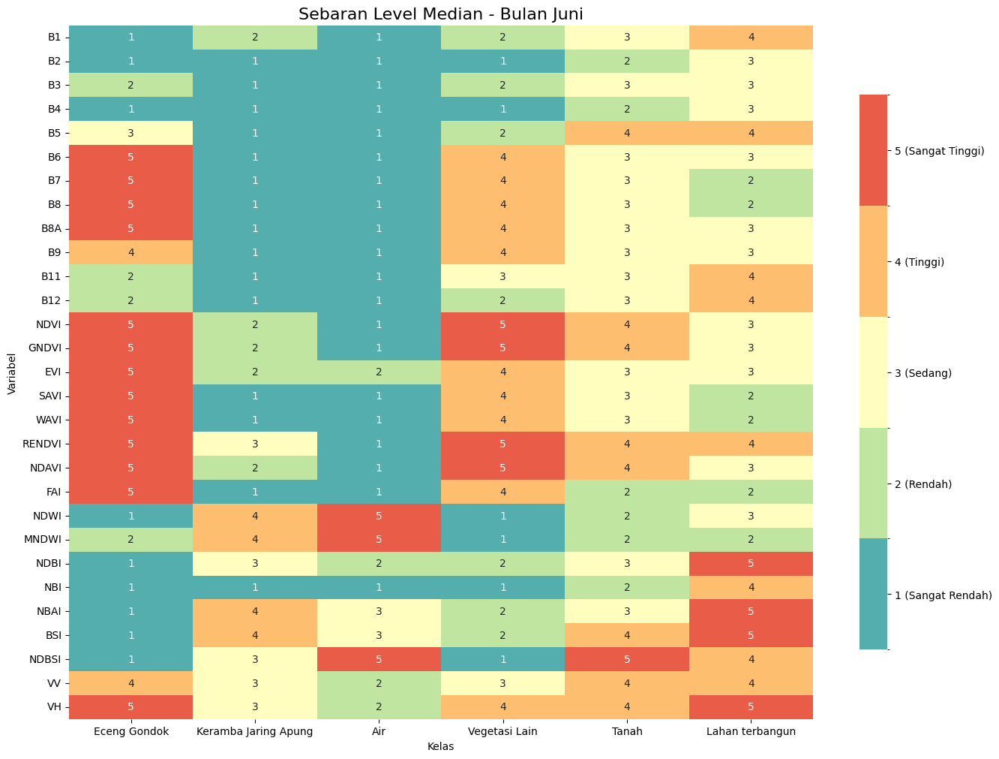


Membuat heatmap untuk bulan Juli (struktur asli)...

--- Hasil Array Level (Juli) ---
['B1', 1, 2, 1, 2, 3, 3]
['B2', 1, 1, 1, 1, 2, 3]
['B3', 2, 1, 1, 2, 3, 3]
['B4', 1, 1, 1, 1, 3, 3]
['B5', 3, 1, 1, 2, 3, 3]
['B6', 5, 1, 1, 4, 2, 3]
['B7', 4, 1, 1, 4, 2, 3]
['B8', 5, 1, 1, 4, 2, 3]
['B8A', 4, 1, 1, 4, 2, 3]
['B9', 4, 1, 1, 4, 3, 3]
['B11', 3, 2, 1, 3, 3, 4]
['B12', 2, 1, 1, 3, 3, 4]
['NDVI', 5, 2, 1, 5, 3, 3]
['GNDVI', 5, 2, 1, 5, 3, 3]
['EVI', 5, 1, 1, 4, 2, 2]
['SAVI', 5, 1, 1, 4, 2, 2]
['WAVI', 5, 1, 1, 4, 2, 2]
['RENDVI', 5, 2, 1, 5, 3, 3]
['NDAVI', 5, 2, 1, 5, 3, 3]
['FAI', 5, 1, 1, 4, 2, 2]
['NDWI', 1, 4, 5, 1, 3, 3]
['MNDWI', 1, 3, 5, 1, 2, 1]
['NDBI', 1, 3, 2, 2, 3, 4]
['NBI', 1, 1, 1, 1, 2, 3]
['NBAI', 1, 4, 3, 2, 3, 5]
['BSI', 1, 3, 2, 2, 4, 4]
['NDBSI', 1, 3, 5, 1, 4, 4]
['VV', 4, 3, 2, 4, 4, 4]
['VH', 5, 3, 2, 4, 4, 5]


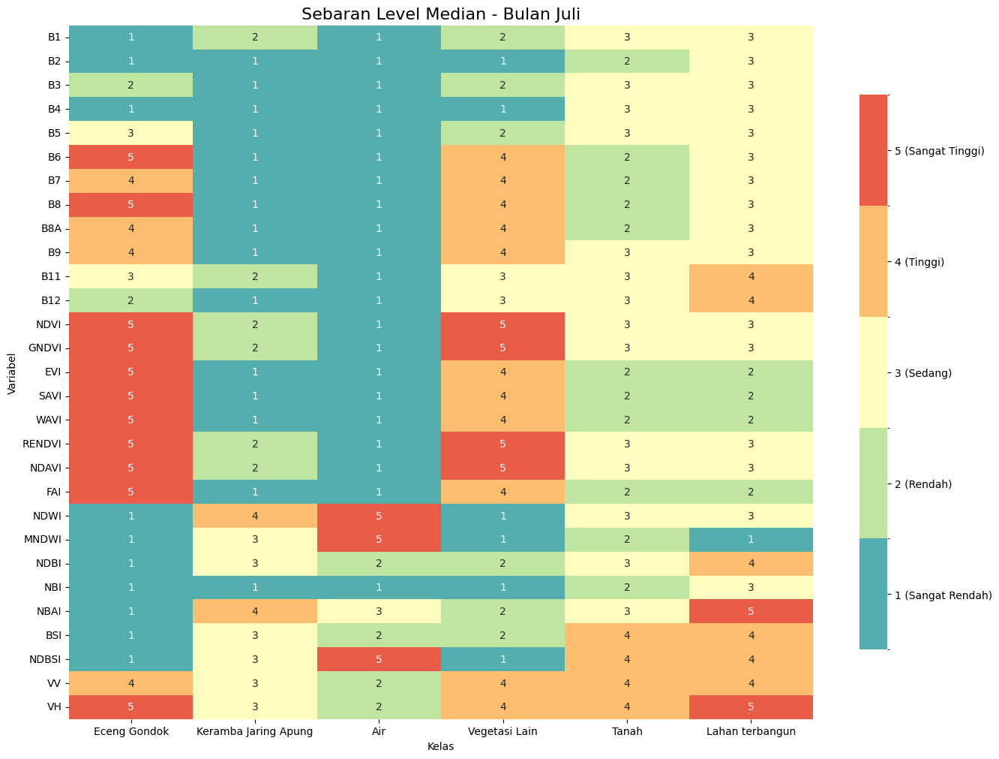


Membuat heatmap untuk bulan Agustus (struktur asli)...

--- Hasil Array Level (Agustus) ---
['B1', 1, 2, 2, 2, 3, 4]
['B2', 1, 1, 1, 1, 2, 3]
['B3', 1, 1, 1, 1, 2, 2]
['B4', 1, 1, 1, 1, 2, 3]
['B5', 2, 1, 1, 2, 3, 3]
['B6', 5, 1, 1, 4, 2, 3]
['B7', 4, 1, 1, 4, 2, 2]
['B8', 5, 1, 1, 4, 2, 3]
['B8A', 5, 1, 1, 4, 2, 3]
['B9', 4, 1, 1, 4, 3, 3]
['B11', 3, 1, 1, 3, 3, 4]
['B12', 2, 1, 1, 2, 2, 4]
['NDVI', 5, 2, 1, 5, 3, 3]
['GNDVI', 5, 2, 1, 5, 3, 3]
['EVI', 4, 1, 1, 4, 2, 2]
['SAVI', 5, 1, 1, 4, 2, 2]
['WAVI', 5, 1, 1, 4, 2, 2]
['RENDVI', 5, 2, 1, 5, 3, 3]
['NDAVI', 5, 2, 1, 5, 4, 3]
['FAI', 4, 1, 1, 4, 2, 2]
['NDWI', 1, 4, 5, 1, 3, 3]
['MNDWI', 2, 4, 5, 1, 2, 1]
['NDBI', 1, 3, 2, 2, 3, 5]
['NBI', 1, 1, 1, 1, 2, 3]
['NBAI', 1, 4, 3, 2, 3, 5]
['BSI', 1, 4, 3, 2, 4, 5]
['NDBSI', 1, 4, 5, 1, 4, 5]
['VV', 4, 3, 2, 3, 3, 4]
['VH', 5, 3, 2, 4, 4, 4]


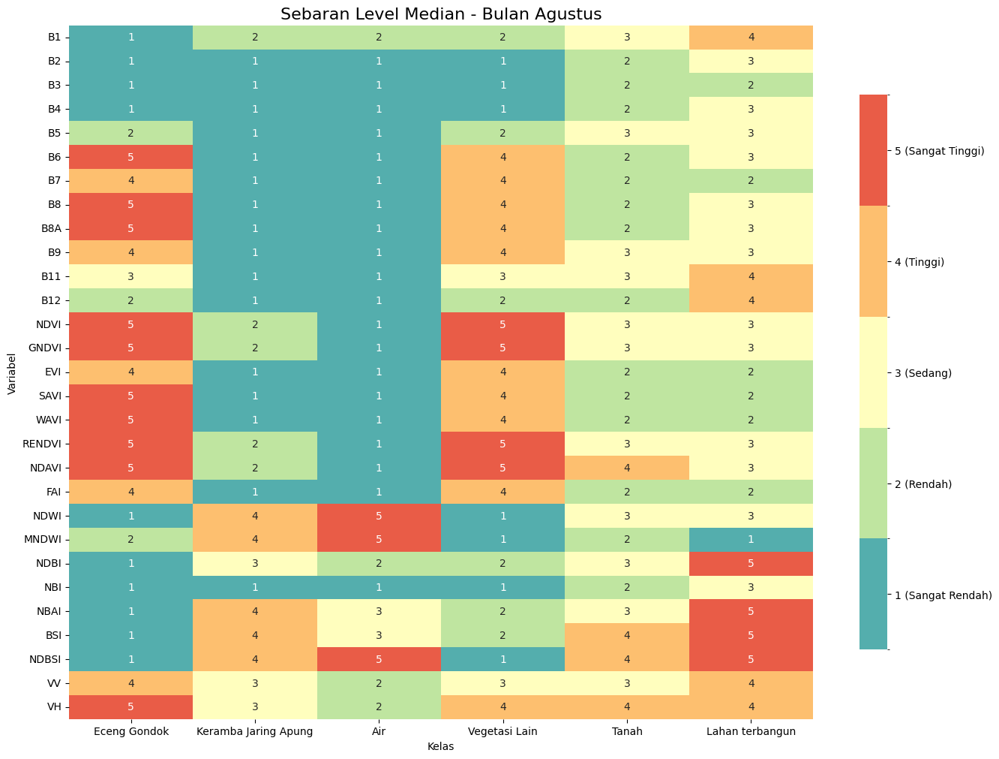

In [ ]:
# --- 5.3. Heatmap Keterpisahan Kelas (Struktur Asli - Perbaikan Final v2) ---

def create_heatmap_original_structure(intervals, bands, values_df, desired_order, cmap,
                                      figsize=(12, 8), show_level=True, month='', mode='', n_levels=5):
    """Membuat heatmap menggunakan metode pivot, mirip dengan struktur kode asli."""

    heatmap_data_list = []
    for var_name, breaks in intervals.items():
        for class_name, value_series in values_df[desired_order].items():
            band_idx = bands.index(var_name)
            val = value_series.iloc[band_idx]
            mapped_level = np.digitize(val, bins=breaks) if not pd.isna(val) else 0
            heatmap_data_list.append({
                'Feature': var_name, 'Class': class_name, 'Break Level': mapped_level, 'Value': val
            })

    heatmap_df = pd.DataFrame(heatmap_data_list)
    heatmap_df['Class'] = pd.Categorical(heatmap_df['Class'], categories=desired_order, ordered=True)
    pivot_values = 'Break Level' if show_level else 'Value'
    heatmap_pivot = heatmap_df.pivot(index='Feature', columns='Class', values=pivot_values)
    heatmap_pivot = heatmap_pivot.reindex(index=bands)

    if not show_level:
        heatmap_pivot.fillna(0, inplace=True)

    plt.figure(figsize=figsize)
    fmt = "d" if show_level else ".2f"

    if show_level:
        # ==============================================================================
        # PERBAIKAN: Ganti `cmap.N` dengan `n_levels`
        # ==============================================================================
        bounds = list(range(1, n_levels + 2))
        norm = mcolors.BoundaryNorm(bounds, n_levels) # Menggunakan n_levels, bukan cmap.N

        ax = sns.heatmap(heatmap_pivot, annot=True, fmt=fmt, cmap=cmap, norm=norm, cbar_kws={"shrink": 0.8})

        cbar = ax.collections[0].colorbar
        tick_positions = [b + 0.5 for b in bounds[:-1]]
        cbar.set_ticks(tick_positions)
        tick_labels = [f'{i+1} ({label})' for i, label in zip(range(n_levels), ["Sangat Rendah", "Rendah", "Sedang", "Tinggi", "Sangat Tinggi"])]
        cbar.set_ticklabels(tick_labels)
    else:
        sns.heatmap(heatmap_pivot, annot=True, fmt=fmt, cmap=cmap)

    plt.title(f"Sebaran {'Level' if show_level else 'Nilai'} {mode.capitalize()} - Bulan {month.capitalize()}", fontsize=16)
    plt.xlabel("Kelas")
    plt.ylabel("Variabel")
    plt.savefig(f"{BASE_PATH}/Heatmap_Level_{month}_{mode}_original.svg", bbox_inches='tight')

    print(f"\n--- Hasil Array {'Level' if show_level else 'Nilai'} ({month}) ---")
    for band_name in heatmap_pivot.index:
        row_list = heatmap_pivot.loc[band_name].tolist()
        processed_row = [int(v) if show_level else float(v) for v in row_list]
        print([band_name] + processed_row)

    plt.show()

# Panggil fungsi dengan parameter n_levels yang benar
desired_order = lc_data["label"]
cmap_5_levels = sns.color_palette("Spectral_r", n_colors=5)
for month in all_intervals.keys():
    print(f"\nMembuat heatmap untuk bulan {month} (struktur asli)...")
    create_heatmap_original_structure(
        intervals=all_intervals[month],
        bands=BANDS,
        values_df=all_median_values_original_format[month],
        desired_order=desired_order,
        cmap=cmap_5_levels,
        figsize=(16, 12),
        show_level=True,
        month=month,
        mode='median',
        n_levels=N_LEVELS
    )

## 6. Korelasi Variabel

In [ ]:
from scipy.stats import normaltest
import pandas as pd

# Fungsi untuk uji normalitas per bulan
def perform_normality_test(data, bands, month_name):
    df_asli = pd.DataFrame(data, columns=bands)

    # DataFrame baru untuk menyimpan hasil uji
    data_uji = {
        "Kolom": [],
        "Statistik": [],
        "p-value": [],
        "Keputusan": []
    }

    # Uji normalitas untuk setiap kolom
    for col in df_asli.columns:
        stat, p = normaltest(df_asli[col])
        keputusan = "Gagal Tolak" if p > 0.05 else "Tolak"
        data_uji["Kolom"].append(col)
        data_uji["Statistik"].append(stat)
        data_uji["p-value"].append(p)
        data_uji["Keputusan"].append(keputusan)

    # Membuat DataFrame baru
    df_uji_normalitas = pd.DataFrame(data_uji)

    print(f"Uji Normalitas - {month_name}:")
    print(df_uji_normalitas)

    return df_uji_normalitas

# Memanggil fungsi untuk masing-masing bulan
df_uji_normalitas_jun = perform_normality_test(x_jun, BANDS, "Juni")
df_uji_normalitas_jul = perform_normality_test(x_jul, BANDS, "Juli")
df_uji_normalitas_ags = perform_normality_test(x_ags, BANDS, "Agustus")


Uji Normalitas - Juni:
     Kolom     Statistik        p-value Keputusan
0       B1    481.165245  3.283179e-105     Tolak
1       B2    907.215334  1.001598e-197     Tolak
2       B3    706.395650  4.056333e-154     Tolak
3       B4    603.439164  9.222540e-132     Tolak
4       B5    229.314314   1.603354e-50     Tolak
5       B6    440.271810   2.489953e-96     Tolak
6       B7    624.289003  2.737571e-136     Tolak
7       B8    664.535882  4.987314e-145     Tolak
8      B8A    698.549767  2.050432e-152     Tolak
9       B9    221.239052   9.089714e-49     Tolak
10     B11     54.374381   1.558667e-12     Tolak
11     B12    302.612331   1.943422e-66     Tolak
12    NDVI   4931.161304   0.000000e+00     Tolak
13   GNDVI    393.145652   4.260950e-86     Tolak
14     EVI    224.410905   1.861192e-49     Tolak
15    SAVI   1576.417739   0.000000e+00     Tolak
16    WAVI  42345.821292   0.000000e+00     Tolak
17  RENDVI    435.480451   2.732887e-95     Tolak
18   NDAVI    878.195211  2

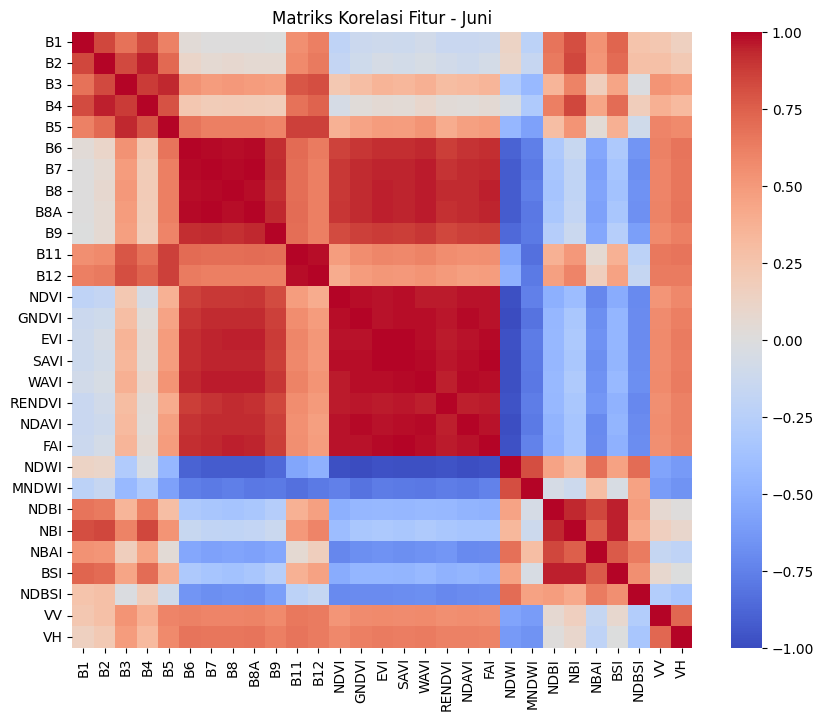

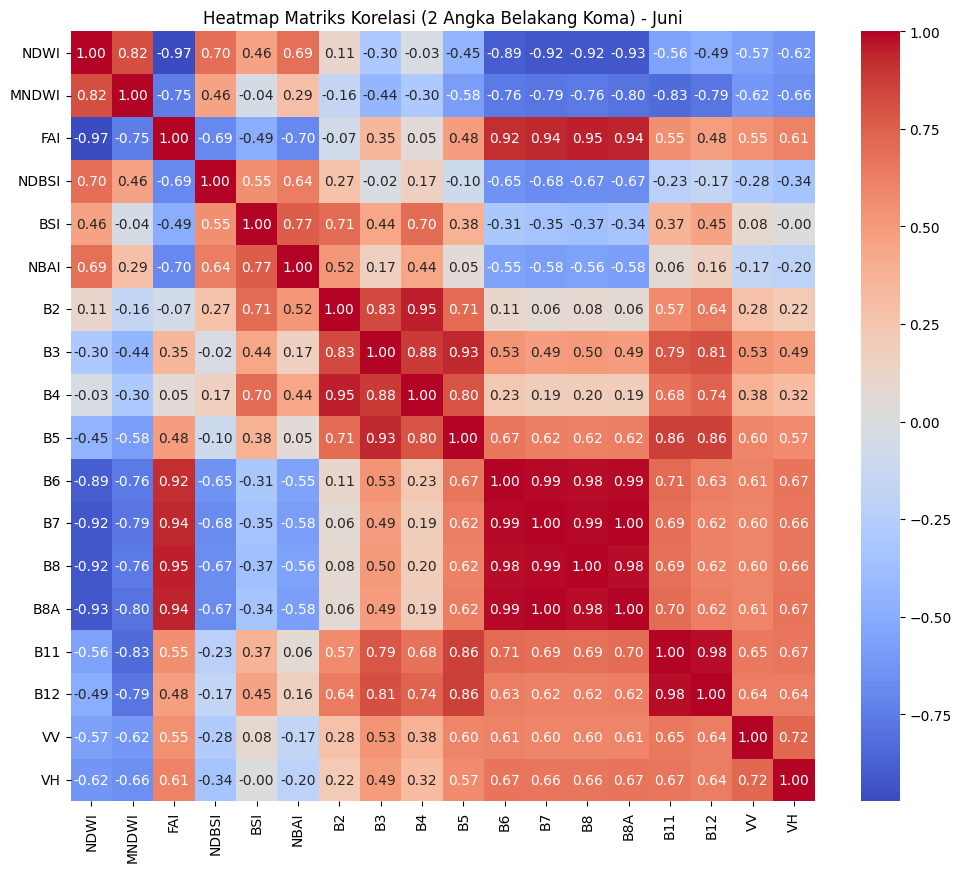

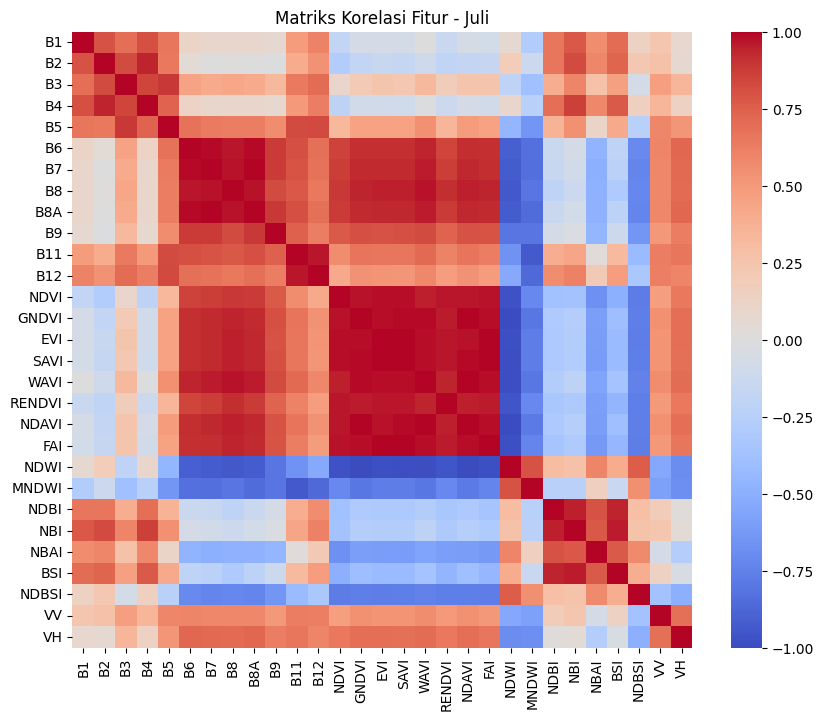

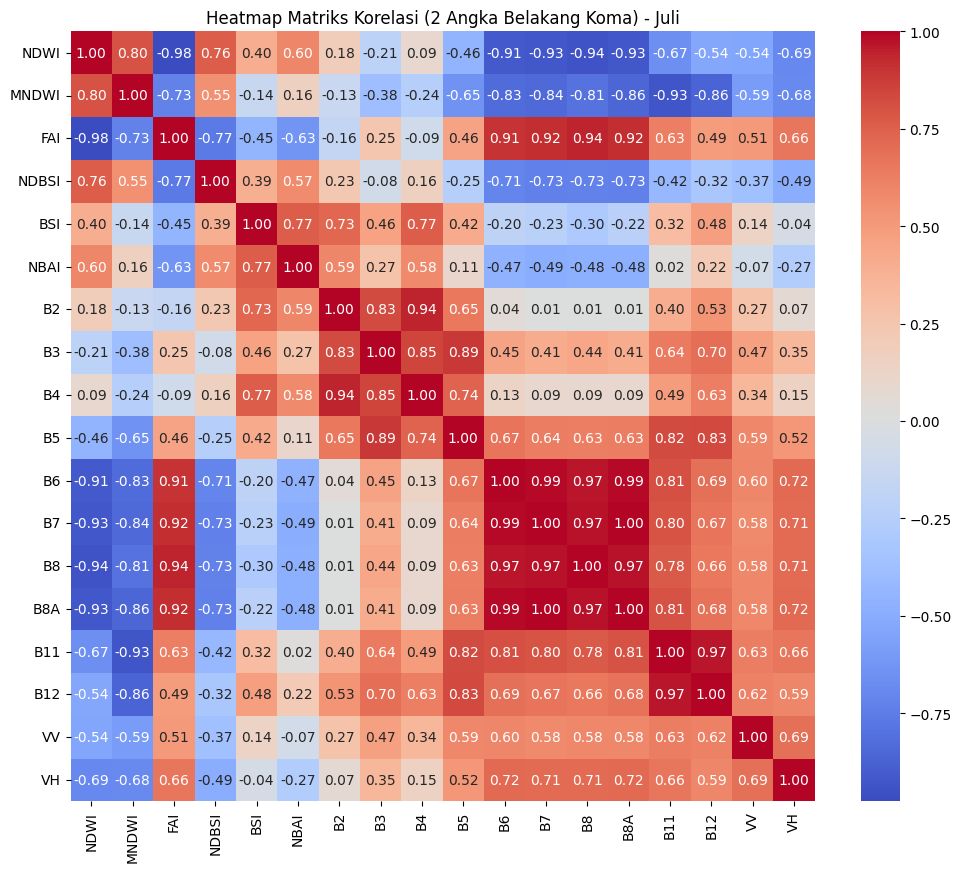

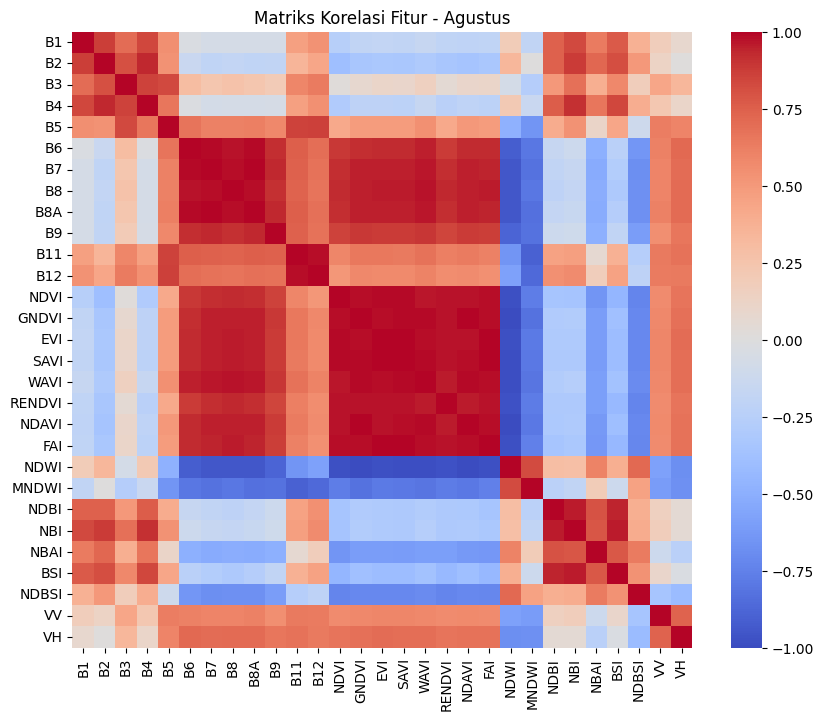

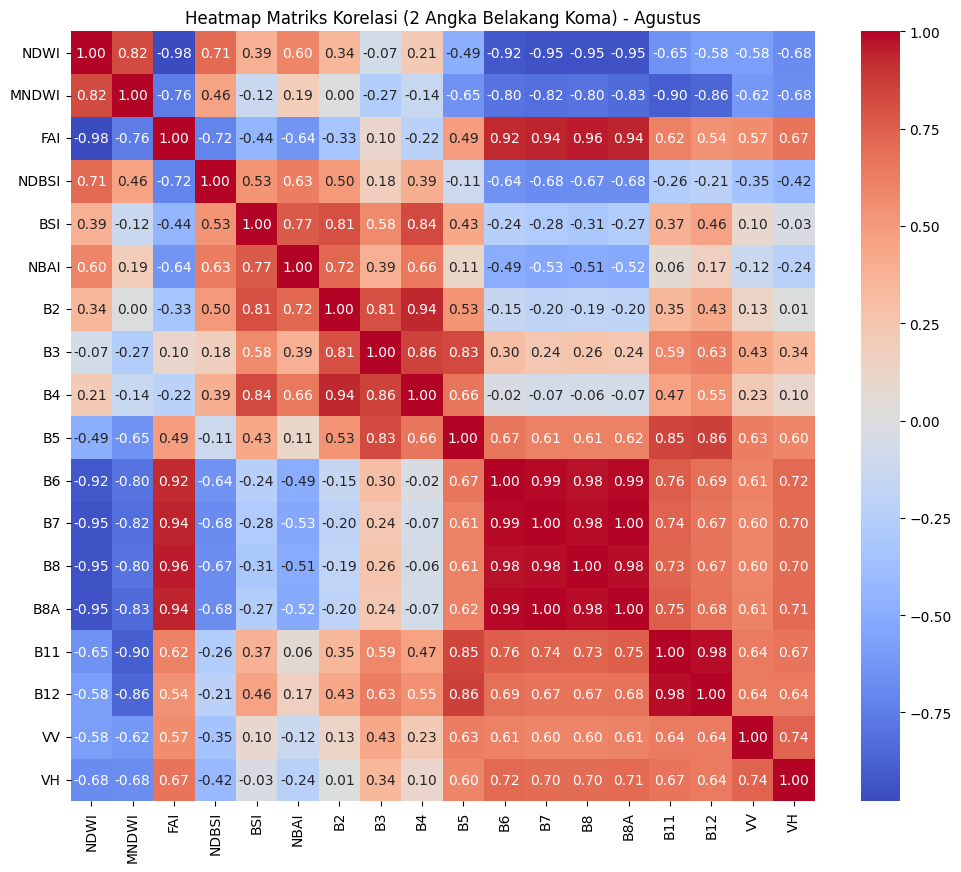

In [ ]:
selected_vars = ['NDWI', 'MNDWI', 'FAI', 'NDBSI', 'BSI', 'NBAI', 'B2', 'B3', 'B4', 'B5', 'B6','B7','B8','B8A', 'B11', 'B12', 'VV', 'VH']

# Menghitung matriks korelasi untuk Juni
df_jun = pd.DataFrame(x_jun, columns=BANDS)
correlation_matrix_jun = df_jun.corr(method='spearman')  # Pearson jika normal

# Plot heatmap korelasi untuk Juni
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_jun, annot=False, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Matriks Korelasi Fitur - Juni")
plt.savefig(f"{BASE_PATH}/Heatmap Matriks Korelasi - Juni.png", dpi=300)
plt.show()

selected_correlation_jun = correlation_matrix_jun.loc[selected_vars, selected_vars]

# Membuat plot heatmap untuk Juni
plt.figure(figsize=(12, 10))
sns.heatmap(selected_correlation_jun, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Heatmap Matriks Korelasi (2 Angka Belakang Koma) - Juni")
plt.show()

# Menghitung matriks korelasi untuk Juli
df_jul = pd.DataFrame(x_jul, columns=BANDS)
correlation_matrix_jul = df_jul.corr(method='spearman')

# Plot heatmap korelasi untuk Juli
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_jul, annot=False, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Matriks Korelasi Fitur - Juli")
plt.savefig(f"{BASE_PATH}/Heatmap Matriks Korelasi - Juli.png", dpi=300)
plt.show()

selected_correlation_jul = correlation_matrix_jul.loc[selected_vars, selected_vars]

# Membuat plot heatmap untuk Juli
plt.figure(figsize=(12, 10))
sns.heatmap(selected_correlation_jul, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Heatmap Matriks Korelasi (2 Angka Belakang Koma) - Juli")
plt.show()

# Menghitung matriks korelasi untuk Agustus
df_ags = pd.DataFrame(x_ags, columns=BANDS)
correlation_matrix_ags = df_ags.corr(method='spearman')

# Plot heatmap korelasi untuk Agustus
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_ags, annot=False, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Matriks Korelasi Fitur - Agustus")
plt.savefig(f"{BASE_PATH}/Heatmap Matriks Korelasi - Agustus.png", dpi=300)
plt.show()

selected_correlation_ags = correlation_matrix_ags.loc[selected_vars, selected_vars]

# Membuat plot heatmap untuk Agustus
plt.figure(figsize=(12, 10))
sns.heatmap(selected_correlation_ags, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Heatmap Matriks Korelasi (2 Angka Belakang Koma) - Agustus")
plt.show()


# Prep

In [ ]:
# --- 1.1. Konfigurasi Awal ---

import geopandas as gpd
import rasterio
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Pengaturan untuk validasi silang (cross-validation)
n_fold = 10
cv = 10

# Verifikasi versi TensorFlow dan ketersediaan GPU
print(f"TensorFlow Version: {tf.__version__}")
print(f"Available Devices: {tf.config.list_physical_devices()}")

# Muat data vektor (SHP) untuk batas area studi
try:
    rawa_pening_gdf = gpd.read_file(SHP)
    # Pastikan sistem koordinat (CRS) sesuai dengan data citra (misal: UTM Zona 49S)
    rawa_pening_gdf = rawa_pening_gdf.to_crs(epsg=32749)
    print("\nFile SHP berhasil dimuat dan di-transformasi.")
except Exception as e:
    print(f"\nGagal memuat file SHP: {e}")

TensorFlow Version: 2.18.0
Available Devices: [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]

File SHP berhasil dimuat dan di-transformasi.


Memulai pemuatan data untuk semua bulan...
Pemuatan data sampel selesai.

--- Proses Data Juni ---
Jumlah Band: 29, Tinggi: 612, Lebar: 607, CRS: EPSG:32749


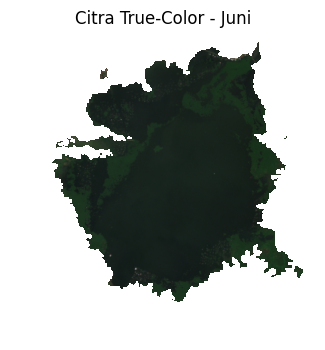


--- Proses Data Juli ---
Jumlah Band: 29, Tinggi: 612, Lebar: 607, CRS: EPSG:32749


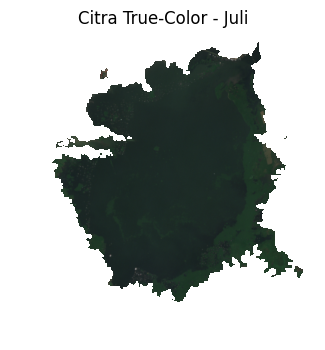


--- Proses Data Agustus ---
Jumlah Band: 29, Tinggi: 612, Lebar: 607, CRS: EPSG:32749


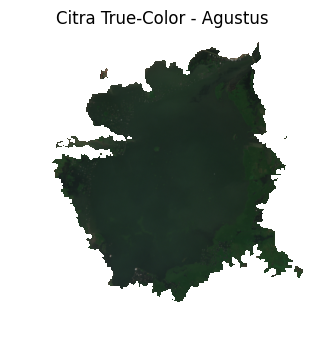


Proses unpacking variabel dan visualisasi selesai.


In [ ]:
# --- 1.2. Pemuatan dan Unpacking Data ---

# Definisikan path untuk setiap bulan
data_sources = {
    "Juni": {"samples": SAMPLE_PATH_JUN, "image": IMAGE_PATH_JUN},
    "Juli": {"samples": SAMPLE_PATH_JUL, "image": IMAGE_PATH_JUL},
    "Agustus": {"samples": SAMPLE_PATH_AGS, "image": IMAGE_PATH_AGS}
}

# Dictionary sementara untuk menyimpan hasil pemuatan
temp_data_frames = {}
print("Memulai pemuatan data untuk semua bulan...")
for month, paths in data_sources.items():
    df = pd.read_csv(paths["samples"])
    df = df.reindex(columns=FEATURE_NAMES)
    temp_data_frames[month] = df
print("Pemuatan data sampel selesai.")

# --- Unpacking Variabel dan Visualisasi per Bulan ---
# Hasil dari loop dipecah ke variabel individual agar sesuai format lama.

# === JUNI ===
print("\n--- Proses Data Juni ---")
data_jun = temp_data_frames['Juni']
image_jun = rasterio.open(IMAGE_PATH_JUN)
# Ekstrak metadata
bandNum_jun, height_jun, width_jun = image_jun.count, image_jun.height, image_jun.width
crs_jun, transform_jun, shape_jun = image_jun.crs, image_jun.transform, (height_jun, width_jun)
# Tampilkan metadata
print(f"Jumlah Band: {bandNum_jun}, Tinggi: {height_jun}, Lebar: {width_jun}, CRS: {crs_jun}")
# Visualisasi
rgb_bands_jun = image_jun.read([4, 3, 2])
rgb_normalized_jun = np.clip(rgb_bands_jun / 0.3, 0, 1)
plt.figure(figsize=(4, 4)); plt.imshow(rgb_normalized_jun.transpose(1, 2, 0)); plt.title("Citra True-Color - Juni"); plt.axis('off'); plt.show()

# === JULI ===
print("\n--- Proses Data Juli ---")
data_jul = temp_data_frames['Juli']
image_jul = rasterio.open(IMAGE_PATH_JUL)
# Ekstrak metadata
bandNum_jul, height_jul, width_jul = image_jul.count, image_jul.height, image_jul.width
crs_jul, transform_jul, shape_jul = image_jul.crs, image_jul.transform, (height_jul, width_jul)
# Tampilkan metadata
print(f"Jumlah Band: {bandNum_jul}, Tinggi: {height_jul}, Lebar: {width_jul}, CRS: {crs_jul}")
# Visualisasi
rgb_bands_jul = image_jul.read([4, 3, 2])
rgb_normalized_jul = np.clip(rgb_bands_jul / 0.3, 0, 1)
plt.figure(figsize=(4, 4)); plt.imshow(rgb_normalized_jul.transpose(1, 2, 0)); plt.title("Citra True-Color - Juli"); plt.axis('off'); plt.show()

# === AGUSTUS ===
print("\n--- Proses Data Agustus ---")
data_ags = temp_data_frames['Agustus']
image_ags = rasterio.open(IMAGE_PATH_AGS)
# Ekstrak metadata
bandNum_ags, height_ags, width_ags = image_ags.count, image_ags.height, image_ags.width
crs_ags, transform_ags, shape_ags = image_ags.crs, image_ags.transform, (height_ags, width_ags)
# Tampilkan metadata
print(f"Jumlah Band: {bandNum_ags}, Tinggi: {height_ags}, Lebar: {width_ags}, CRS: {crs_ags}")
# Visualisasi
rgb_bands_ags = image_ags.read([4, 3, 2])
rgb_normalized_ags = np.clip(rgb_bands_ags / 0.3, 0, 1)
plt.figure(figsize=(4, 4)); plt.imshow(rgb_normalized_ags.transpose(1, 2, 0)); plt.title("Citra True-Color - Agustus"); plt.axis('off'); plt.show()

print("\nProses unpacking variabel dan visualisasi selesai.")

## Fungsi Buatan

In [ ]:
# Fungsi2
def print_area_per_model(prediction, model_name, pixel_size = 10, landcover_classes = [0, 1, 2, 3, 4, 5]):
    """
    Mencetak luas area untuk satu prediksi model.

    Parameters:
    - prediction: Array 2D prediksi tutupan lahan.
    - model_name: Nama model (str) untuk identifikasi output.
    - pixel_size: Ukuran piksel dalam meter (misalnya 10 meter untuk Sentinel-2).
    - landcover_classes: Daftar nilai kelas tutupan lahan.
    """
    # Inisialisasi hasil
    area_results = {cls: {'pixels': 0, 'm2': 0, 'ha': 0} for cls in landcover_classes}

    # Hitung jumlah piksel dan luas untuk tiap kelas
    for cls in landcover_classes:
        class_pixels = np.sum(prediction == cls)  # Jumlah piksel untuk kelas tertentu
        class_area_m2 = class_pixels * (pixel_size ** 2)  # Luas dalam meter persegi
        class_area_ha = class_area_m2 / 10000  # Konversi ke hektar

        # Simpan hasil dalam dictionary
        area_results[cls]['pixels'] = class_pixels
        area_results[cls]['m2'] = class_area_m2
        area_results[cls]['ha'] = class_area_ha

    # Cetak hasil untuk model ini
    print(f"\nHasil untuk {model_name}:")
    for cls, values in area_results.items():
        print(f"Kelas {cls}:")
        print(f"  Luas dalam piksel: {values['pixels']} piksel")
        print(f"  Luas dalam m²: {values['m2']:.2f} m²")
        print(f"  Luas dalam hektar: {values['ha']:.4f} ha")

def reshape_input(array):
    """
    Reshape a 2D array into a 3D array by adding an extra dimension at the end.

    This function is typically used to prepare data for models, such as Convolutional Neural Networks (CNN),
    which expect a 3D input of shape (samples, features, channels).

    Args:
        array (numpy.ndarray): A 2D array with shape (samples, features).

    Returns:
        numpy.ndarray: A 3D array with shape (samples, features, 1), where 1 is the added channel dimension.
    """
    shape = array.shape
    return array.reshape(shape[0], shape[1], 1)

def preprocess_data(data, selected_bands, label_column, n_classes, test_size=0.3, random_state=222111840, model_type='cnn1d'):
    """
    Fungsi untuk melakukan preprocessing pada data.

    Args:
        data (DataFrame): Data input.
        selected_bands (list): Fitur yang dipilih untuk preprocessing.
        label_column (str): Nama kolom label.
        n_classes (int): Jumlah kelas kategori.
        test_size (float): Proporsi data yang digunakan sebagai test set.
        random_state (int): Seed untuk pengacakan.
        model_type (str): Tipe model ('cnn1d' atau 'rf').

    Returns:
        tuple:
            X_train (numpy array), X_test (numpy array),
            y_train (numpy array), y_test (numpy array),
            scaler, normalizer
    """
    # Memisahkan fitur dan label
    data_features = data[selected_bands]
    data_label = data[label_column]

    # Stratified splitting data menjadi training dan testing
    X_train_raw, X_test_raw, y_train_raw, y_test_raw = train_test_split(
        data_features, data_label, test_size=test_size,
        random_state=random_state, stratify=data_label
    )

    # Standardisasi fitur
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train_raw)
    X_test_scaled = scaler.transform(X_test_raw)

    # Normalisasi fitur
    normalizer = MinMaxScaler()
    X_train_normalized = normalizer.fit_transform(X_train_scaled)
    X_test_normalized = normalizer.transform(X_test_scaled)

    if model_type.lower() == 'cnn1d':
        # Reshape untuk model CNN1D
        X_train = reshape_input(X_train_normalized)  # Bentuk (samples, features, 1)
        X_test = reshape_input(X_test_normalized)
        # Konversi label menjadi kategori (one-hot encoding)
        y_train = to_categorical(y_train_raw.to_numpy(), n_classes)
        y_test = to_categorical(y_test_raw.to_numpy(), n_classes)
    elif model_type.lower() in ['rf', 'svm']:
        # Tidak perlu reshape untuk Random Forest, hanya perlu data rata
        X_train = X_train_normalized  # Bentuk tetap 2D (samples, features)
        X_test = X_test_normalized
        # Label tetap dalam bentuk integer untuk Random Forest
        y_train = y_train_raw.to_numpy()
        y_test = y_test_raw.to_numpy()
    else:
        raise ValueError("Model type must be 'cnn1d' or 'rf'.")

    # Cetak bentuk data
    print(f'Data training features ({model_type}): {X_train.shape}')
    print(f'Data test features ({model_type}): {X_test.shape}')
    print(f'Data training label: {y_train.shape}')
    print(f'Data test label: {y_test.shape}')

    return X_train, X_test, y_train, y_test, scaler, normalizer

# Predicting & masking
def predict_and_mask(model, image_input, mask, model_type="cnn", height=None, width=None, crs=None, transform=None, output_path=None):
    """
    Predict, apply a mask, and optionally save the result.

    Args:
        model: The model to use for predictions (e.g., CNN or Random Forest).
        image_input: The input image data.
        mask: Boolean mask to apply.
        model_type (str): Either 'cnn' or 'rf' for CNN or Random Forest.
        height (int): Image height.
        width (int): Image width.
        crs (str): Coordinate Reference System (CRS) for the output.
        transform (Affine): Affine transformation for the output file.
        output_path (str): File path to save the masked prediction.

    Returns:
        numpy.ndarray: The masked prediction.
    """
    if not all([height, width, crs, transform]):
        raise ValueError("Parameters 'height', 'width', 'crs', and 'transform' are required.")

    # Melakukan prediksi
    if model_type.lower() == "cnn":
        prediction = model.predict(image_input, batch_size=64)
        prediction = np.argmax(prediction, axis=1)  # Merubah probability ke indeks kelas
    elif model_type.lower() == "rf":
        prediction = model.predict(image_input)
    else:
        raise ValueError("Invalid model_type. Use 'cnn' or 'rf'.")

    # Reshape prediksi
    prediction = prediction.reshape(height, width)

    # Apply mask
    prediction_masked = prediction.astype(np.float32)
    prediction_masked[~mask] = np.nan

    # Simpan
    if output_path:
        if os.path.exists(output_path):
            os.remove(output_path)  # Hapus existing
        with rasterio.open(
            output_path, 'w', driver='GTiff',
            height=height, width=width, count=1,
            dtype=prediction_masked.dtype.name,
            crs=crs, transform=transform
        ) as dst:
            dst.write(prediction_masked, 1)

    return prediction_masked

# Fungsi untuk Memuat Data Raster
def load_and_process_bands(image_path, selected_bands):
    """
    Load and process bands from a raster file based on the selected bands.

    Args:
        image_path (str): Path to the raster file.
        selected_bands (list): List of band names to extract.

    Returns:
        numpy.ndarray: Processed and stacked band data.
        tuple: (height, width, crs, transform) for image properties.
        list: Missing bands from the selected bands.
    """
    with rasterio.open(image_path) as src:
        band_descriptions = [desc if desc else f"Band {i+1}" for i, desc in enumerate(src.descriptions)]
        band_indices_mapping = {desc: i for i, desc in enumerate(band_descriptions)}

        missing_bands = [band for band in selected_bands if band not in band_indices_mapping]

        sorted_indices = [band_indices_mapping[band] for band in selected_bands if band in band_indices_mapping]

        if missing_bands:
            print(f"Warning: The following bands were not found in the TIFF file: {missing_bands}") # buat kode untuk generate indeks (missing variabel indeks) jika pita dasar tersedia

        band_data = [src.read(idx + 1) for idx in sorted_indices]
        stacked_data = np.stack(band_data)

        return stacked_data, (src.height, src.width, src.crs, src.transform)

# Fungsi untuk Membuat Mask
def create_mask(image_path, geometry):
    """
    Create a mask for the input raster based on a provided geometry.

    Args:
        image_path (str): Path to the raster file.
        geometry: Geometry to create the mask.

    Returns:
        numpy.ndarray: Boolean mask for the raster.
    """
    with rasterio.open(image_path) as src:
        mask_data, _ = rasterio.mask.mask(src, [geometry], crop=False)
    return mask_data[0] > 0

# Fungsi untuk Preprocessing Citra
def preprocess_image_input(image_data, scaler, normalizer, model_type="cnn"):
    """
    Preprocess image data for input into a model.

    Args:
        image_data (numpy.ndarray): Image data to preprocess.
        scaler: Scaler for standardization.
        normalizer: Normalizer for normalization.
        model_type (str): Either 'cnn' or 'rf'.

    Returns:
        numpy.ndarray: Preprocessed image data.
    """
    # Transforming data with scaler
    # Catatan: Peringatan "X does not have valid feature names" bisa diabaikan
    # karena sudah dilakukan mapping fitur pada saat fitting scaler sebelumnya lihat load_and_process_bands.
    # Flatten data for scaling and normalization

    flat_data = image_data.reshape(-1, image_data.shape[-1])
    scaled_data = scaler.transform(flat_data)
    normalized_data = normalizer.transform(scaled_data)

    if model_type.lower() == "cnn":
        # Reshape for CNN input
        processed_data = normalized_data.reshape(-1, normalized_data.shape[-1], 1)
    else:
        # Return flattened data for RF
        processed_data = normalized_data

    return processed_data


# Klasifikasi GEE


In [ ]:
# SELECTED_BANDS = SELECTED_BANDS_FIX
SELECTED_BANDS = ['FAI', 'MNDWI', 'BSI', 'NBAI', 'B2', 'B3', 'B4', 'B5', 'B8', 'B11', 'B12', 'VV', 'VH']
SELECTED_BANDS

['FAI',
 'MNDWI',
 'BSI',
 'NBAI',
 'B2',
 'B3',
 'B4',
 'B5',
 'B8',
 'B11',
 'B12',
 'VV',
 'VH']

### JUNI

In [ ]:
data = data_jun
SCALER_PATH = SCALER_PATH_JUN
NORMALIZER_PATH = NORMALIZER_PATH_JUN
MODEL_CNN1D_PATH = MODEL_CNN1D_PATH_JUN
MODEL_RF_PATH = MODEL_RF_PATH_JUN
OUTPUT_PATH_CNN1D = OUTPUT_PATH_CNN1D_JUN
OUTPUT_PATH_RF = OUTPUT_PATH_RF_JUN
IMAGE_PATH = IMAGE_PATH_JUN

#### CNN1D

In [ ]:
# parameter model sesuaikan best param tuning
conv_filters=8
conv_kernel_size=5
dense_units=128
batch_size= 8
n_epochs = 50
kernel_initializer=he_normal # def glorot_uniform

In [ ]:
X_train, X_test, y_train, y_test, scaler, normalizer = preprocess_data(
    data=data,
    selected_bands=SELECTED_BANDS,
    label_column=LABEL,
    n_classes=N_CLASSES,
    model_type='cnn1d'
)

Data training features (cnn1d): (840, 13, 1)
Data test features (cnn1d): (360, 13, 1)
Data training label: (840, 6)
Data test label: (360, 6)


In [ ]:
# prompt: save scaler dan nrmalixer

dump(scaler, SCALER_PATH)
dump(normalizer, NORMALIZER_PATH)


['/content/drive/MyDrive/GEE_Exports/normalizer_jun.joblib']

##### Cross-Val

In [ ]:
%%time
# Initialize confusion matrix
combined_cm = np.zeros((N_CLASSES, N_CLASSES))  # Confusion matrix
stop = EarlyStopping(monitor='val_loss', patience=10)  # Early stopping callback

# Create Stratified K-Fold (no shuffling)
kfold = StratifiedKFold(n_splits=n_fold, shuffle=False)

# Arrays to store results
fold_train_accuracies, fold_val_accuracies = [], []
fold_train_losses, fold_val_losses = [], []
all_predictions, all_labels = [], []

# Variable to store the best model based on validation loss
cnn_best_model = None
best_val_loss = float('inf')

# Loop through each fold
for fold, (train_idx, val_idx) in enumerate(kfold.split(X_train, y_train.argmax(axis=1))):
    # Split data into training and validation sets for this fold
    train_input, val_input = X_train[train_idx], X_train[val_idx]
    train_output, val_output = y_train[train_idx], y_train[val_idx]

    # Extract input dimensions
    seq_length = X_train.shape[1]
    n_features = X_train.shape[2]

    # Define the CNN model
    model = Sequential([
        Input(shape=(seq_length, n_features)),
        Conv1D(filters=conv_filters, kernel_size=conv_kernel_size, activation='relu', kernel_initializer=kernel_initializer),
        Flatten(),
        Dense(units=dense_units, kernel_initializer=kernel_initializer),
        BatchNormalization(),
        ReLU(),
        Dense(units=N_CLASSES, activation='softmax', kernel_initializer=kernel_initializer)  # Output layer for classification
    ])

    # Compile the model
    model.compile(
        optimizer=Adam(),
        loss=CategoricalCrossentropy(),
        metrics=['accuracy']
    )

    # Train the model
    result = model.fit(
        x=train_input,
        y=train_output,
        validation_data=(val_input, val_output),
        batch_size=batch_size,
        epochs=n_epochs,
        callbacks=[stop],
        verbose=0
    )

    # Get predictions for this fold
    predictions = model.predict(val_input)
    predictions_classes = predictions.argmax(axis=1)  # Convert probabilities to class labels
    true_classes = val_output.argmax(axis=1)  # Convert one-hot encoding to class labels

    # Compute accuracy for this fold
    fold_accuracy = accuracy_score(true_classes, predictions_classes)
    fold_train_accuracies.append(result.history['accuracy'])  # Append all training accuracies
    fold_val_accuracies.append(result.history['val_accuracy'])  # Append all validation accuracies
    fold_train_losses.append(result.history['loss'])  # Append all training losses
    fold_val_losses.append(result.history['val_loss'])  # Append all validation losses

    # Compute confusion matrix for this fold and add it to the combined matrix
    cm = confusion_matrix(true_classes, predictions_classes)
    combined_cm += cm

    # Store all predictions and labels for evaluation later
    all_predictions.extend(predictions_classes)
    all_labels.extend(true_classes)

    # Check if this model is the best (based on validation loss)
    val_loss = min(result.history['val_loss'])
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        cnn_best_model = model

# Print accuracy for each fold
for fold, accuracy in enumerate(fold_val_accuracies, start=1):  # Use fold_val_accuracies here
    print(f"Fold {fold} - Prediction Accuracy: {accuracy[-1]:.4f}")  # Get the last accuracy value for each fold

# Calculate and print average accuracy
average_accuracy = np.mean([fold[-1] for fold in fold_val_accuracies])  # Get the last accuracy for each fold
print(f"Average Prediction Accuracy: {average_accuracy:.4f}")

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Fold 1 - Prediction Accuracy: 0.9405
Fold 2 - Prediction Accuracy: 0.9762
Fold 3 - Prediction Accuracy: 0.9643
Fold 4 - Prediction Accuracy: 0.9762
Fold 5 - Prediction Accuracy: 0.9643
Fold 6 - Prediction Accuracy: 0.9048
Fold 7 - Prediction Accuracy: 0.9643
Fold 8 - Prediction Accuracy: 0.9167
Fold 9 - Prediction Accuracy: 0.9048
Fold 10 - Prediction Accuracy: 0.9048
Average Prediction Accuracy: 0.9417
CPU times: user 2min 1s, sys: 5.41 s, total: 2min 6s
Wall time: 2min 33s


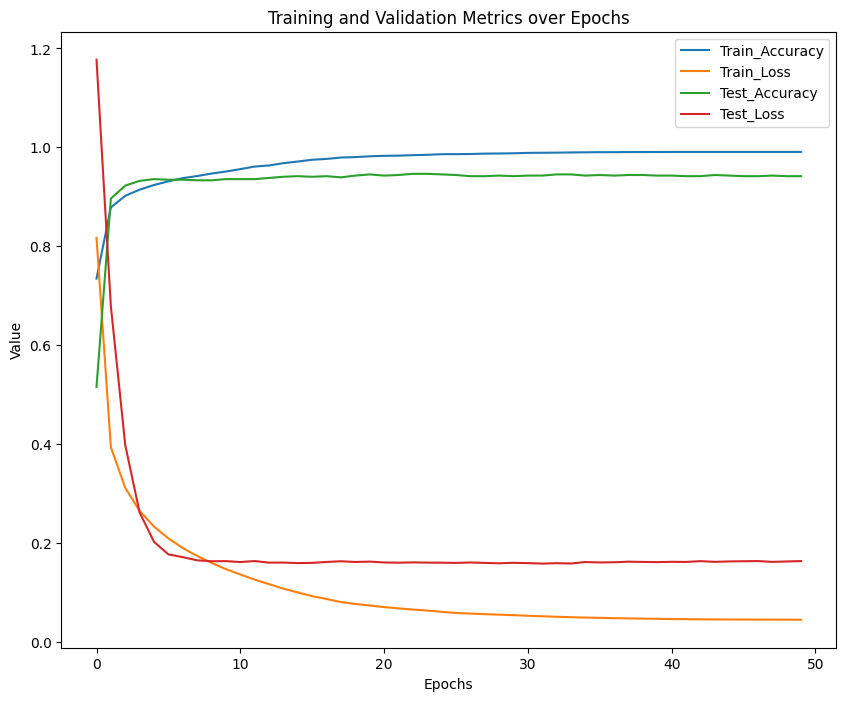

In [ ]:
# Aligning lengths of metrics across folds (if needed)
max_epochs = max([len(fold) for fold in fold_train_accuracies])
for i in range(len(fold_train_accuracies)):
    fold_train_accuracies[i] += [fold_train_accuracies[i][-1]] * (max_epochs - len(fold_train_accuracies[i]))
    fold_val_accuracies[i] += [fold_val_accuracies[i][-1]] * (max_epochs - len(fold_val_accuracies[i]))
    fold_train_losses[i] += [fold_train_losses[i][-1]] * (max_epochs - len(fold_train_losses[i]))
    fold_val_losses[i] += [fold_val_losses[i][-1]] * (max_epochs - len(fold_val_losses[i]))

# Calculate the mean of all metrics across folds
mean_train_accuracy = np.mean(fold_train_accuracies, axis=0)
mean_val_accuracy = np.mean(fold_val_accuracies, axis=0)
mean_train_loss = np.mean(fold_train_losses, axis=0)
mean_val_loss = np.mean(fold_val_losses, axis=0)

# Create a DataFrame for easy plotting
history = pd.DataFrame({
    'Train_Accuracy': mean_train_accuracy,
    'Train_Loss': mean_train_loss,
    'Test_Accuracy': mean_val_accuracy,
    'Test_Loss': mean_val_loss
})

# Plot the results
plt.figure(figsize=(10, 8))
plt.plot(range(len(history['Train_Accuracy'])), history['Train_Accuracy'], label='Train_Accuracy')
plt.plot(range(len(history['Train_Loss'])), history['Train_Loss'], label='Train_Loss')
plt.plot(range(len(history['Test_Accuracy'])), history['Test_Accuracy'], label='Test_Accuracy')
plt.plot(range(len(history['Test_Loss'])), history['Test_Loss'], label='Test_Loss')

plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.title('Training and Validation Metrics over Epochs')
plt.show()

##### Final Model

In [ ]:
%%time
stop = EarlyStopping(
    monitor='val_loss',
    patience=10
)
# Buat ulang model
# Extract input dimensions
seq_length = X_train.shape[1]
n_features = X_train.shape[2]

# Define the CNN model
cnn_final_model = Sequential([
    Input(shape=(seq_length, n_features)),
    Conv1D(filters=conv_filters, kernel_size=conv_kernel_size, activation='relu', kernel_initializer=kernel_initializer),
    Flatten(),
    Dense(units=dense_units, kernel_initializer=kernel_initializer),
    BatchNormalization(),
    ReLU(),
    Dense(units=N_CLASSES, activation='softmax', kernel_initializer=kernel_initializer)  # Output layer for classification
])

# Compile the model
cnn_final_model.compile(
    optimizer=Adam(),
    loss=CategoricalCrossentropy(),
    metrics=['accuracy']
)

# Train the model with early stopping
result = cnn_final_model.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=n_epochs,
    validation_data=(X_test, y_test),
    callbacks=[stop],
    verbose=1
)

cnn_final_model.save(MODEL_CNN1D_PATH)

Epoch 1/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.5650 - loss: 1.2106 - val_accuracy: 0.5639 - val_loss: 1.1382
Epoch 2/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8774 - loss: 0.4049 - val_accuracy: 0.8528 - val_loss: 0.6681
Epoch 3/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8932 - loss: 0.3044 - val_accuracy: 0.8778 - val_loss: 0.4136
Epoch 4/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9058 - loss: 0.2560 - val_accuracy: 0.9056 - val_loss: 0.2880
Epoch 5/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9113 - loss: 0.2318 - val_accuracy: 0.9333 - val_loss: 0.2253
Epoch 6/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9169 - loss: 0.2133 - val_accuracy: 0.9444 - val_loss: 0.1958
Epoch 7/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9293 - loss: 0.1957 - val_accuracy: 0.9444 - val_loss: 0.1881
Epoch 8/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9371 - loss: 0.1842 - val_accuracy: 0.

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9741 - loss: 0.0760
Loss pada data train: 0.0866
Accuracy pada data train: 0.9690
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


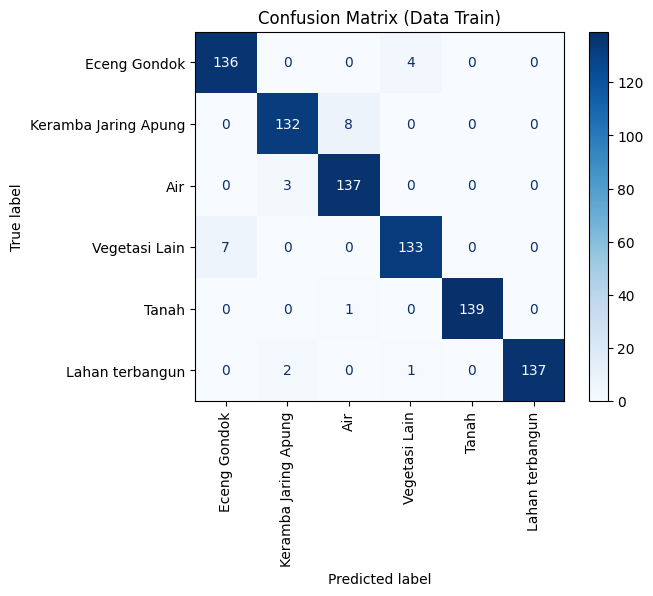


Classification Report (Data Train):
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       140
           1       0.96      0.94      0.95       140
           2       0.94      0.98      0.96       140
           3       0.96      0.95      0.96       140
           4       1.00      0.99      1.00       140
           5       1.00      0.98      0.99       140

    accuracy                           0.97       840
   macro avg       0.97      0.97      0.97       840
weighted avg       0.97      0.97      0.97       840

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9622 - loss: 0.1518 

Loss pada data test: 0.1692
Accuracy pada data test: 0.9611
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


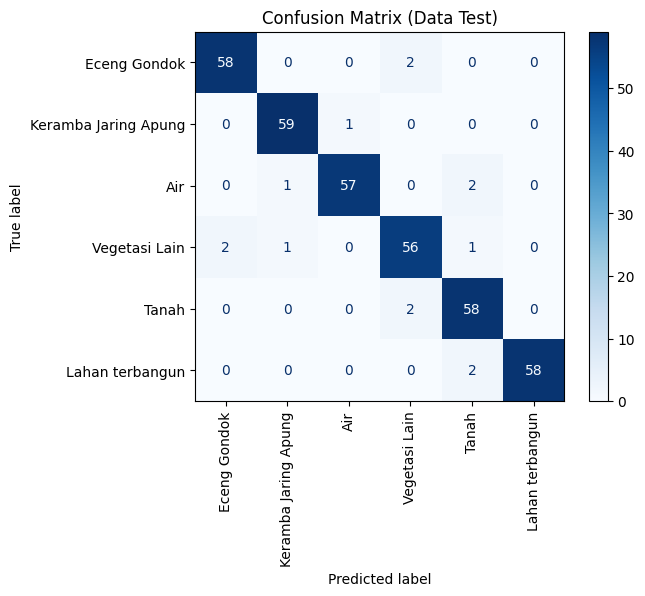


Classification Report (Data Test):
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        60
           1       0.97      0.98      0.98        60
           2       0.98      0.95      0.97        60
           3       0.93      0.93      0.93        60
           4       0.92      0.97      0.94        60
           5       1.00      0.97      0.98        60

    accuracy                           0.96       360
   macro avg       0.96      0.96      0.96       360
weighted avg       0.96      0.96      0.96       360



In [ ]:
# Evaluasi model pada data train
train_loss, train_accuracy = cnn_final_model.evaluate(X_train, y_train, verbose=1)
print(f"Loss pada data train: {train_loss:.4f}")
print(f"Accuracy pada data train: {train_accuracy:.4f}")

# Prediksi pada data train
train_predictions = cnn_final_model.predict(X_train)
train_predictions_classes = train_predictions.argmax(axis=1)  # Konversi probabilitas ke kelas
train_true_classes = y_train.argmax(axis=1)  # Konversi one-hot encoding ke kelas asli

# Hitung confusion matrix pada data train
train_cm = confusion_matrix(train_true_classes, train_predictions_classes)

# Tampilkan confusion matrix untuk data train
disp_train = ConfusionMatrixDisplay(train_cm, display_labels=CLASSES)
disp_train.plot(cmap='Blues')
plt.xticks(rotation=90)
plt.title("Confusion Matrix (Data Train)")
plt.show()

# Tampilkan classification report untuk data train
print("\nClassification Report (Data Train):")
print(classification_report(train_true_classes, train_predictions_classes))

# Evaluasi model pada data test
test_loss, test_accuracy = cnn_final_model.evaluate(X_test, y_test, verbose=1)
print(f"\nLoss pada data test: {test_loss:.4f}")
print(f"Accuracy pada data test: {test_accuracy:.4f}")

# Prediksi pada data test
test_predictions = cnn_final_model.predict(X_test)
test_predictions_classes = test_predictions.argmax(axis=1)  # Konversi probabilitas ke kelas
test_true_classes = y_test.argmax(axis=1)  # Konversi one-hot encoding ke kelas asli

# Hitung confusion matrix pada data test
test_cm = confusion_matrix(test_true_classes, test_predictions_classes)

# Tampilkan confusion matrix untuk data test
disp_test = ConfusionMatrixDisplay(test_cm, display_labels=CLASSES)
disp_test.plot(cmap='Blues')
plt.xticks(rotation=90)
plt.title("Confusion Matrix (Data Test)")
plt.savefig(f"{BASE_PATH}/Confusion_Matrix_Test_CNN_JUNI.svg", format="svg", bbox_inches='tight')
plt.show()

# Tampilkan classification report untuk data test
print("\nClassification Report (Data Test):")
print(classification_report(test_true_classes, test_predictions_classes))

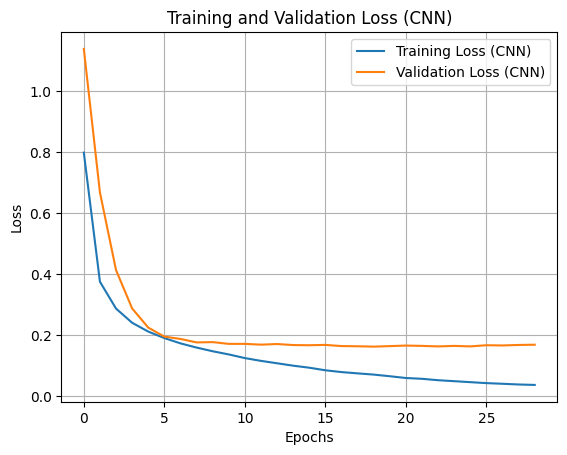

In [ ]:
# Plot training dan validation loss untuk CNN
plt.plot(result.history['loss'], label='Training Loss (CNN)')
plt.plot(result.history['val_loss'], label='Validation Loss (CNN)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (CNN)')
plt.legend()
plt.grid()
plt.savefig(f"{BASE_PATH}/Loss_Curve_CNN_JUNI.svg", format="svg", bbox_inches='tight')
plt.show()

In [ ]:
print(cnn_final_model.summary())

Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_43 (Conv1D)              │ (None, 9, 8)           │            48 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_43 (Flatten)            │ (None, 72)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 128)            │         9,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_43          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_43 (ReLU)                 │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,524 (123.14 KB)

 Trainable params: 10,422 (40.71 KB)

 Non-trainable params: 256 (1.00 KB)

 Optimizer params: 20,846 (81.43 KB)

None


#### Random Forest

In [ ]:
# Hyperparameters for Random Forest
n_estimators = 50    # def 100
max_depth = 15       # def None
min_samples_split = 4  # def 2
min_samples_leaf = 1   # def 1
max_features = None   # def 'sqrt'
max_leaf_nodes = 35   # def None
max_samples = None    # def None

In [ ]:
# Preprocess data
X_train, X_test, y_train, y_test, scaler, normalizer = preprocess_data(
    data=data,
    selected_bands=SELECTED_BANDS,
    label_column=LABEL,
    n_classes=N_CLASSES,
    model_type='rf'
)

Data training features (rf): (840, 13)
Data test features (rf): (360, 13)
Data training label: (840,)
Data test label: (360,)


##### Cross-Val

In [ ]:
%%time
# Perform Random Forest Cross-Validation
combined_cm = np.zeros((N_CLASSES, N_CLASSES))  # Initialize confusion matrix
kfold = StratifiedKFold(n_splits=n_fold, shuffle=True, random_state=222111840)  # 5-fold cross-validation

fold_train_accuracies = []
fold_val_accuracies = []
all_predictions = []
all_labels = []

rf_best_model = None
best_val_accuracy = 0

# Loop for each fold
for train_idx, val_idx in kfold.split(X_train, y_train):
    train_input, val_input = X_train[train_idx], X_train[val_idx]
    train_output, val_output = y_train[train_idx], y_train[val_idx]

    # Create Random Forest model for each fold
    model = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        max_features=max_features,
        max_leaf_nodes=max_leaf_nodes,
        max_samples=max_samples,
        random_state=222111840
    )

    # Train the model
    model.fit(train_input, train_output)

    # Predictions on validation data
    predictions = model.predict(val_input)
    true_classes = val_output

    # Calculate accuracy for this fold
    fold_val_accuracy = np.mean(predictions == true_classes)
    fold_train_accuracy = model.score(train_input, train_output)

    # Calculate confusion matrix for this fold
    cm = confusion_matrix(true_classes, predictions)
    combined_cm += cm  # Add to the combined confusion matrix

    # Store results
    all_predictions.extend(predictions)
    all_labels.extend(true_classes)
    fold_train_accuracies.append(fold_train_accuracy)
    fold_val_accuracies.append(fold_val_accuracy)

    # Update the best model based on validation accuracy
    if fold_val_accuracy > best_val_accuracy:
        best_val_accuracy = fold_val_accuracy
        rf_best_model = model

# Calculate mean accuracies
mean_train_accuracy = np.mean(fold_train_accuracies)
mean_val_accuracy = np.mean(fold_val_accuracies)


CPU times: user 3.13 s, sys: 9 ms, total: 3.14 s
Wall time: 3.14 s


Accuracy per Fold:
   Train_Accuracy  Test_Accuracy
0        0.998677       0.976190
1        1.000000       0.916667
2        0.998677       0.928571
3        1.000000       0.952381
4        0.997354       0.964286
5        1.000000       0.940476
6        0.998677       1.000000
7        0.997354       0.928571
8        0.997354       0.916667
9        1.000000       0.964286


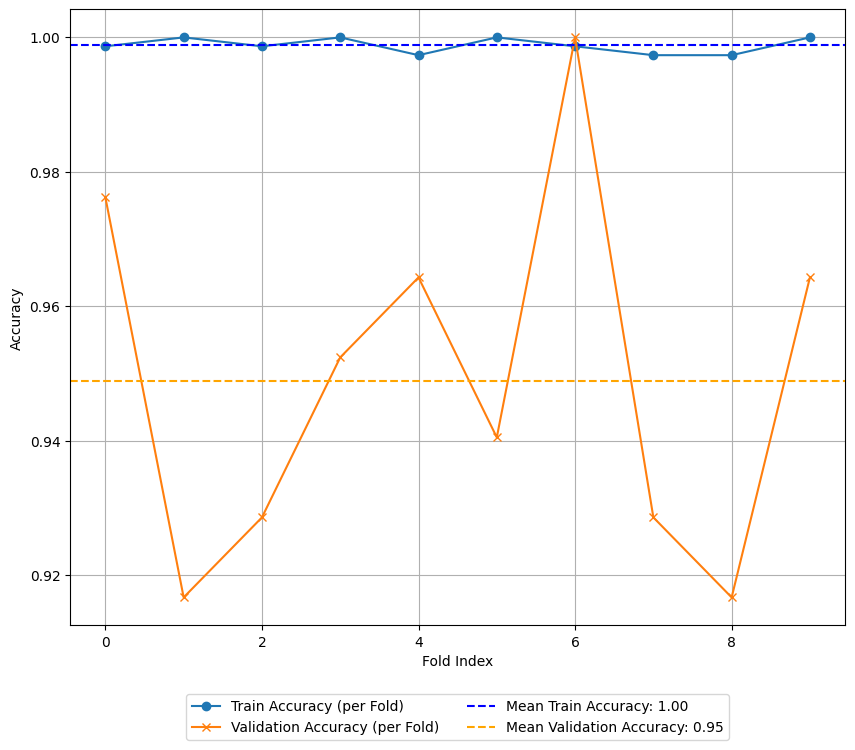

Mean Accuracy per Fold:
   Train_Accuracy_Mean  Test_Accuracy_Mean
0              0.99881             0.94881
Training Accuracy: 0.9988


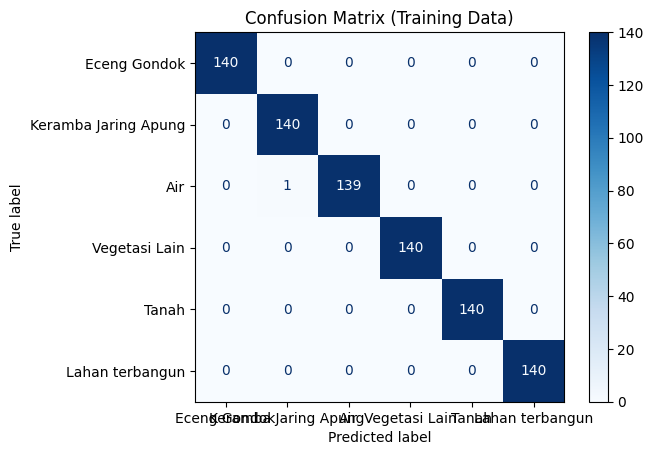


Classification Report (Training Data):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       140
           1       0.99      1.00      1.00       140
           2       1.00      0.99      1.00       140
           3       1.00      1.00      1.00       140
           4       1.00      1.00      1.00       140
           5       1.00      1.00      1.00       140

    accuracy                           1.00       840
   macro avg       1.00      1.00      1.00       840
weighted avg       1.00      1.00      1.00       840

Test Accuracy: 0.9444


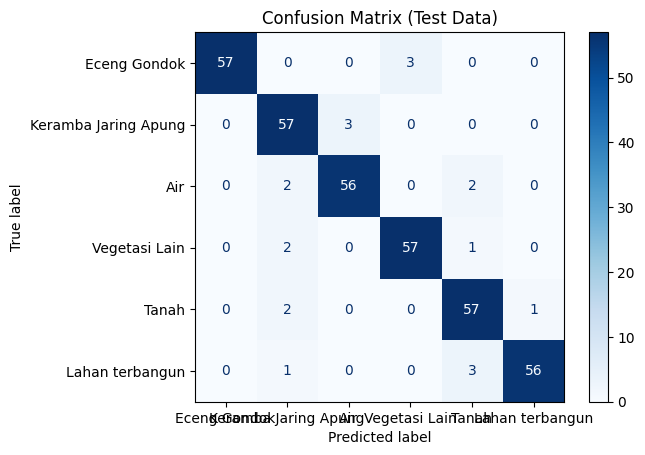


Classification Report (Test Data):
              precision    recall  f1-score   support

           0       1.00      0.95      0.97        60
           1       0.89      0.95      0.92        60
           2       0.95      0.93      0.94        60
           3       0.95      0.95      0.95        60
           4       0.90      0.95      0.93        60
           5       0.98      0.93      0.96        60

    accuracy                           0.94       360
   macro avg       0.95      0.94      0.94       360
weighted avg       0.95      0.94      0.94       360

   Feature  Importance
10     B12    0.183694
6       B4    0.178942
3     NBAI    0.177163
2      BSI    0.128504
8       B8    0.125688
0      FAI    0.084846
7       B5    0.043223
4       B2    0.030832
12      VH    0.012599
1    MNDWI    0.012062
9      B11    0.010285
11      VV    0.007201
5       B3    0.004961


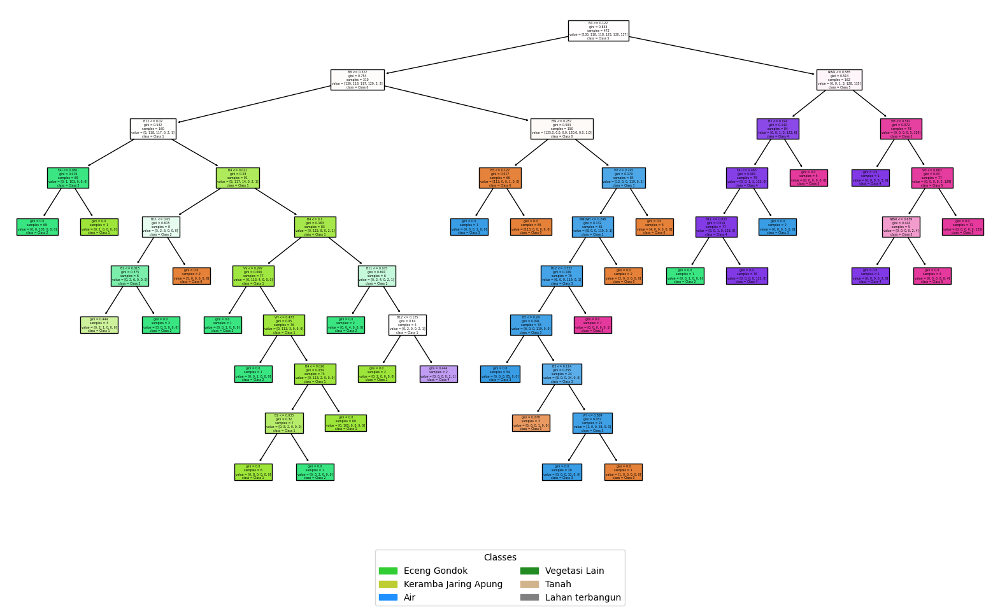

In [ ]:
# Plotting Random Forest Cross-Validation Accuracy
history = pd.DataFrame({
    'Train_Accuracy': fold_train_accuracies,  # Training accuracy per fold
    'Test_Accuracy': fold_val_accuracies  # Validation accuracy per fold
})

history_mean = pd.DataFrame({
    'Train_Accuracy_Mean': [mean_train_accuracy],
    'Test_Accuracy_Mean': [mean_val_accuracy]
})

# Display accuracy per fold
print("Accuracy per Fold:")
print(history)

# Plot the accuracy results per fold
plt.figure(figsize=(10, 8))
plt.plot(range(len(fold_train_accuracies)), fold_train_accuracies, label='Train Accuracy (per Fold)', marker='o')
plt.plot(range(len(fold_val_accuracies)), fold_val_accuracies, label='Validation Accuracy (per Fold)', marker='x')
plt.axhline(mean_train_accuracy, color='blue', linestyle='--', label=f'Mean Train Accuracy: {mean_train_accuracy:.2f}')
plt.axhline(mean_val_accuracy, color='orange', linestyle='--', label=f'Mean Validation Accuracy: {mean_val_accuracy:.2f}')
plt.xlabel('Fold Index')
plt.ylabel('Accuracy')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=2)
plt.grid(True)
plt.show()

# Display the mean accuracy results
print("Mean Accuracy per Fold:")
print(history_mean)

# Evaluate the final Random Forest model on training and testing data
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import ConfusionMatrixDisplay

# Training evaluation
train_predictions = rf_best_model.predict(X_train)
train_accuracy = accuracy_score(y_train, train_predictions)
print(f"Training Accuracy: {train_accuracy:.4f}")

train_cm = confusion_matrix(y_train, train_predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=train_cm, display_labels=CLASSES)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix (Training Data)")
plt.show()

print("\nClassification Report (Training Data):")
print(classification_report(y_train, train_predictions))

# Testing evaluation
test_predictions = rf_best_model.predict(X_test)
test_accuracy = accuracy_score(y_test, test_predictions)
print(f"Test Accuracy: {test_accuracy:.4f}")

test_cm = confusion_matrix(y_test, test_predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=test_cm, display_labels=CLASSES)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix (Test Data)")
plt.show()

print("\nClassification Report (Test Data):")
print(classification_report(y_test, test_predictions))

# Evaluate feature importance and plot one of the trees
import matplotlib.patches as mpatches
from sklearn.tree import plot_tree

feature_importance = rf_best_model.feature_importances_
importance_df = pd.DataFrame({
    'Feature': SELECTED_BANDS,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

print(importance_df)

plt.figure(figsize=(20, 10))
plot_tree(
    rf_best_model.estimators_[0],  # Plot the first tree in the forest
    feature_names=SELECTED_BANDS,
    class_names=[f"Class {i}" for i in range(N_CLASSES)],
    filled=True
)

# Create a legend for the class colors
class_colors = PALETTE
patches = [mpatches.Patch(color=color, label=label) for color, label in zip(class_colors, CLASSES)]

# Add legend
plt.legend(handles=patches, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=2, title="Classes")

plt.show()


##### Final Model

In [ ]:
%%time
# Buat ulang model Random Forest
rf_final_model = RandomForestClassifier(
    n_estimators=n_estimators,
    max_depth=max_depth,
    min_samples_split=min_samples_split,
    min_samples_leaf=min_samples_leaf,
    max_leaf_nodes=max_leaf_nodes,
    random_state=seed
)

# Latih model Random Forest pada data training
rf_final_model.fit(X_train, y_train)

# Simpan model
dump(rf_final_model, MODEL_RF_PATH)

CPU times: user 169 ms, sys: 2.05 ms, total: 171 ms
Wall time: 187 ms


['/content/drive/MyDrive/GEE_Exports/model_rf_jun.joblib']

Training Accuracy: 0.9917


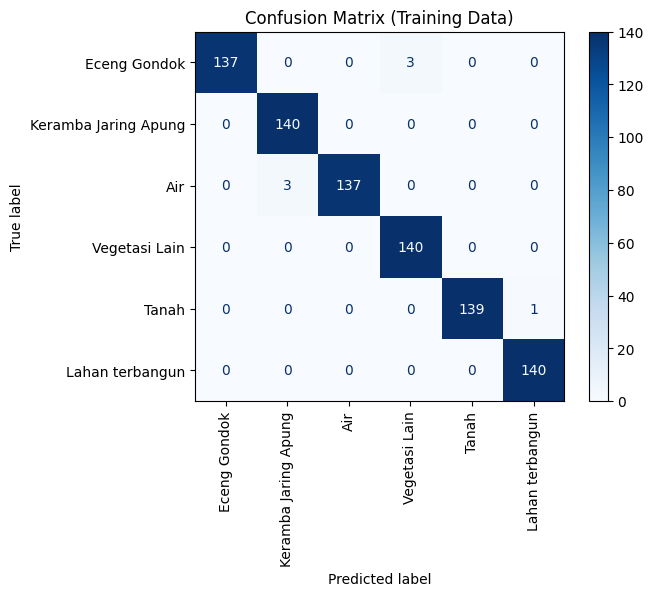


Classification Report (Training Data):
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       140
           1       0.98      1.00      0.99       140
           2       1.00      0.98      0.99       140
           3       0.98      1.00      0.99       140
           4       1.00      0.99      1.00       140
           5       0.99      1.00      1.00       140

    accuracy                           0.99       840
   macro avg       0.99      0.99      0.99       840
weighted avg       0.99      0.99      0.99       840

Test Accuracy: 0.9556


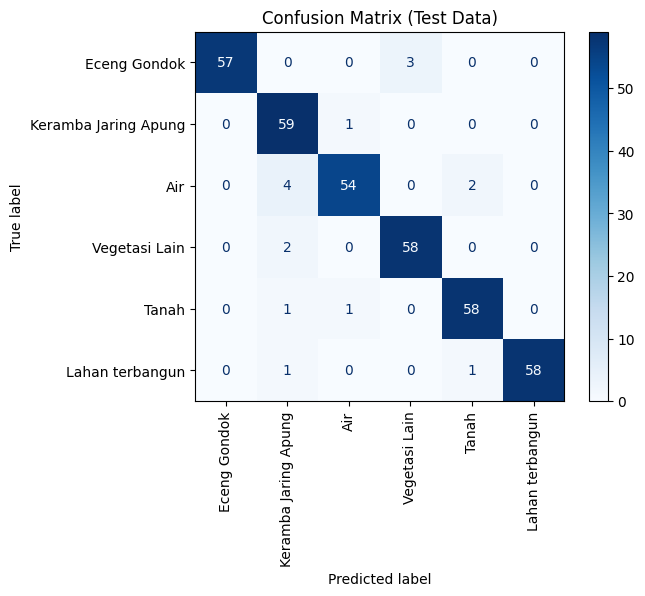


Classification Report (Test Data):
              precision    recall  f1-score   support

           0       1.00      0.95      0.97        60
           1       0.88      0.98      0.93        60
           2       0.96      0.90      0.93        60
           3       0.95      0.97      0.96        60
           4       0.95      0.97      0.96        60
           5       1.00      0.97      0.98        60

    accuracy                           0.96       360
   macro avg       0.96      0.96      0.96       360
weighted avg       0.96      0.96      0.96       360

   Feature  Importance
10     B12    0.130602
3     NBAI    0.118979
0      FAI    0.106489
9      B11    0.100366
4       B2    0.085048
6       B4    0.083123
2      BSI    0.081446
7       B5    0.079775
8       B8    0.066714
1    MNDWI    0.065828
5       B3    0.054868
12      VH    0.015775
11      VV    0.010989


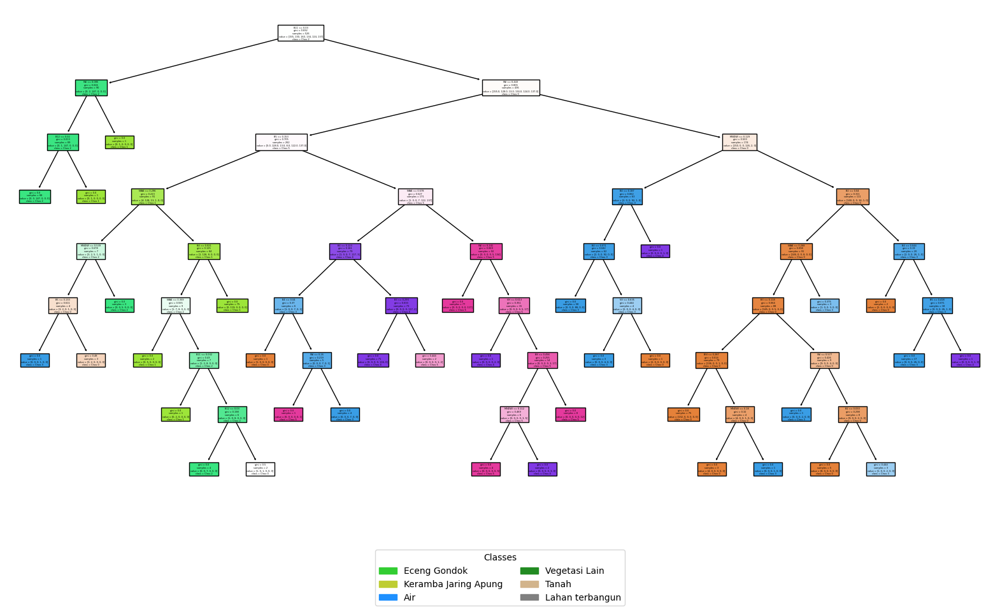

Rata-rata Kedalaman Pohon (Depth): 9.20
Max Kedalaman Pohon (Depth): 12
Min Kedalaman Pohon (Depth): 7
Rata-rata Jumlah Leaf Node: 34.92
Max Jumlah Leaf Node: 35
Min Jumlah Leaf Node: 32


In [ ]:
# Evaluate model on training data
train_predictions = rf_final_model.predict(X_train)
train_accuracy = accuracy_score(y_train, train_predictions)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Confusion matrix for training data
train_cm = confusion_matrix(y_train, train_predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=train_cm, display_labels=CLASSES)
disp.plot(cmap='Blues')
plt.xticks(rotation=90)
plt.title("Confusion Matrix (Training Data)")
plt.show()

print("\nClassification Report (Training Data):")
print(classification_report(y_train, train_predictions))

# Evaluate model on test data
test_predictions = rf_final_model.predict(X_test)
test_accuracy = accuracy_score(y_test, test_predictions)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Confusion matrix for test data
test_cm = confusion_matrix(y_test, test_predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=test_cm, display_labels=CLASSES)
disp.plot(cmap='Blues')
plt.xticks(rotation=90)
plt.title("Confusion Matrix (Test Data)")
plt.savefig(f"{BASE_PATH}/Confusion_Matrix_Test_RF_JUNI.svg", format="svg", bbox_inches='tight')
plt.show()

print("\nClassification Report (Test Data):")
print(classification_report(y_test, test_predictions))

feature_importance = rf_final_model.feature_importances_
importance_df = pd.DataFrame({
    'Feature': SELECTED_BANDS,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

print(importance_df)

plt.figure(figsize=(20, 10))
plot_tree(
    rf_final_model.estimators_[0],  # Plot the first tree in the forest
    feature_names=SELECTED_BANDS,
    class_names=[f"Class {i}" for i in range(N_CLASSES)],
    filled=True
)

# Create a legend for the class colors
class_colors = PALETTE
patches = [mpatches.Patch(color=color, label=label) for color, label in zip(class_colors, CLASSES)]

# Add legend
plt.legend(handles=patches, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=2, title="Classes")
plt.show()

# Inisialisasi variabel untuk kedalaman dan leaf node
depths = []
leaf_nodes = []

# Loop melalui setiap pohon dalam hutan
for tree in rf_final_model.estimators_:
    depths.append(tree.tree_.max_depth)  # Tambahkan kedalaman ke daftar
    leaf_nodes.append(tree.tree_.n_leaves)  # Tambahkan jumlah leaf node ke daftar

# Hitung rata-rata, maksimum, dan minimum untuk kedalaman
average_depth = sum(depths) / len(depths)
max_depth = max(depths)
min_depth = min(depths)

# Hitung rata-rata, maksimum, dan minimum untuk leaf node
average_leaf_nodes = sum(leaf_nodes) / len(leaf_nodes)
max_leaf_nodes = max(leaf_nodes)
min_leaf_nodes = min(leaf_nodes)

# Cetak hasil
print(f"Rata-rata Kedalaman Pohon (Depth): {average_depth:.2f}")
print(f"Max Kedalaman Pohon (Depth): {max_depth}")
print(f"Min Kedalaman Pohon (Depth): {min_depth}")
print(f"Rata-rata Jumlah Leaf Node: {average_leaf_nodes:.2f}")
print(f"Max Jumlah Leaf Node: {max_leaf_nodes}")
print(f"Min Jumlah Leaf Node: {min_leaf_nodes}")


#### Permutation Feature Importance

Cara Membaca Plot per Kelas 📊
Mari kita ambil contoh plot untuk kelas 'Air'.

1. Bar Panjang & Positif (Contoh: MNDWI mungkin memiliki nilai 0.40)

Artinya: "Ketika data fitur MNDWI diacak, kemampuan model untuk mengenali 'Air' (Recall) turun sebesar 40%."

Interpretasi: Fitur MNDWI sangat krusial bagi model untuk bisa mengidentifikasi 'Air'. Model sangat bergantung pada fitur ini. Ini sesuai dengan teori, karena MNDWI (Modified Normalized Difference Water Index) memang dirancang untuk mendeteksi air.

2. Bar Pendek & Positif (Contoh: B11 mungkin memiliki nilai 0.02)

Artinya: "Ketika data fitur B11 diacak, Recall untuk kelas 'Air' hanya turun sebesar 2%."

Interpretasi: Fitur B11 memiliki sedikit kontribusi, tapi tidak signifikan. Model menggunakannya, tapi tidak terlalu bergantung padanya untuk mengenali 'Air'.

3. Bar Sangat Pendek atau Nol (Contoh: BSI mungkin memiliki nilai 0.001)

Artinya: "Mengacak fitur BSI hampir tidak mengubah kemampuan model untuk mengenali 'Air'."

Interpretasi: Fitur BSI (Bare Soil Index) tidak penting untuk kelas 'Air'. Ini masuk akal karena tanah kosong dan air adalah dua hal yang sangat berbeda.

4. Bar Negatif (Contoh: Tanah mungkin memiliki nilai -0.01)

Artinya: "Anehnya, setelah fitur 'Tanah' diacak, kemampuan model mengenali 'Air' justru sedikit meningkat sebesar 1%."

Interpretasi: Ini adalah kasus yang menarik. Artinya, fitur tersebut mungkin mengandung noise atau pola yang sedikit menyesatkan model. Dengan mengacaknya, model tidak lagi terkecoh. Secara praktis, ini sama dengan menganggap fitur tersebut tidak penting atau bahkan mengganggu.

#### Viz Hasil

In [ ]:
# Load and process bands
image_bands, (height, width, crs, transform) = load_and_process_bands(IMAGE_PATH, SELECTED_BANDS)

# Create mask
mask = create_mask(IMAGE_PATH, mapping(rawa_pening_gdf.geometry[0]))

# Create a 2x2 grid for visualization
norm = plt.Normalize(vmin=0, vmax=len(PALETTE)-1)  # Normalize for consistent color range

# Preprocess image data for CNN
image_input_cnn = preprocess_image_input(image_bands.transpose(1, 2, 0), scaler, normalizer, model_type="cnn")

# Predict and visualize CNN Final Model
cnn_final_prediction = predict_and_mask(
    model=cnn_final_model,
    image_input=image_input_cnn,
    mask=mask,
    model_type="cnn",
    height=height,
    width=width,
    crs=crs,
    transform=transform,
    output_path=OUTPUT_PATH_CNN1D
)

# Preprocess image data for RF
image_input_rf = preprocess_image_input(image_bands.transpose(1, 2, 0), scaler, normalizer, model_type="rf")

# Predict and visualize RF Final Model
rf_final_prediction = predict_and_mask(
    model=rf_final_model,
    image_input=image_input_rf,
    mask=mask,
    model_type="rf",
    height=height,
    width=width,
    crs=crs,
    transform=transform,
    output_path=OUTPUT_PATH_RF
)

# Calculate and print area for each prediction
print_area_per_model(cnn_final_prediction, "CNN Final Model")
print_area_per_model(rf_final_prediction, "RF Final Model")

  42/5805 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step   

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


5805/5805 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(



Hasil untuk CNN Final Model:
Kelas 0:
  Luas dalam piksel: 34775 piksel
  Luas dalam m²: 3477500.00 m²
  Luas dalam hektar: 347.7500 ha
Kelas 1:
  Luas dalam piksel: 15095 piksel
  Luas dalam m²: 1509500.00 m²
  Luas dalam hektar: 150.9500 ha
Kelas 2:
  Luas dalam piksel: 103667 piksel
  Luas dalam m²: 10366700.00 m²
  Luas dalam hektar: 1036.6700 ha
Kelas 3:
  Luas dalam piksel: 2921 piksel
  Luas dalam m²: 292100.00 m²
  Luas dalam hektar: 29.2100 ha
Kelas 4:
  Luas dalam piksel: 1319 piksel
  Luas dalam m²: 131900.00 m²
  Luas dalam hektar: 13.1900 ha
Kelas 5:
  Luas dalam piksel: 500 piksel
  Luas dalam m²: 50000.00 m²
  Luas dalam hektar: 5.0000 ha

Hasil untuk RF Final Model:
Kelas 0:
  Luas dalam piksel: 30382 piksel
  Luas dalam m²: 3038200.00 m²
  Luas dalam hektar: 303.8200 ha
Kelas 1:
  Luas dalam piksel: 21072 piksel
  Luas dalam m²: 2107200.00 m²
  Luas dalam hektar: 210.7200 ha
Kelas 2:
  Luas dalam piksel: 99623 piksel
  Luas dalam m²: 9962300.00 m²
  Luas dalam hektar:

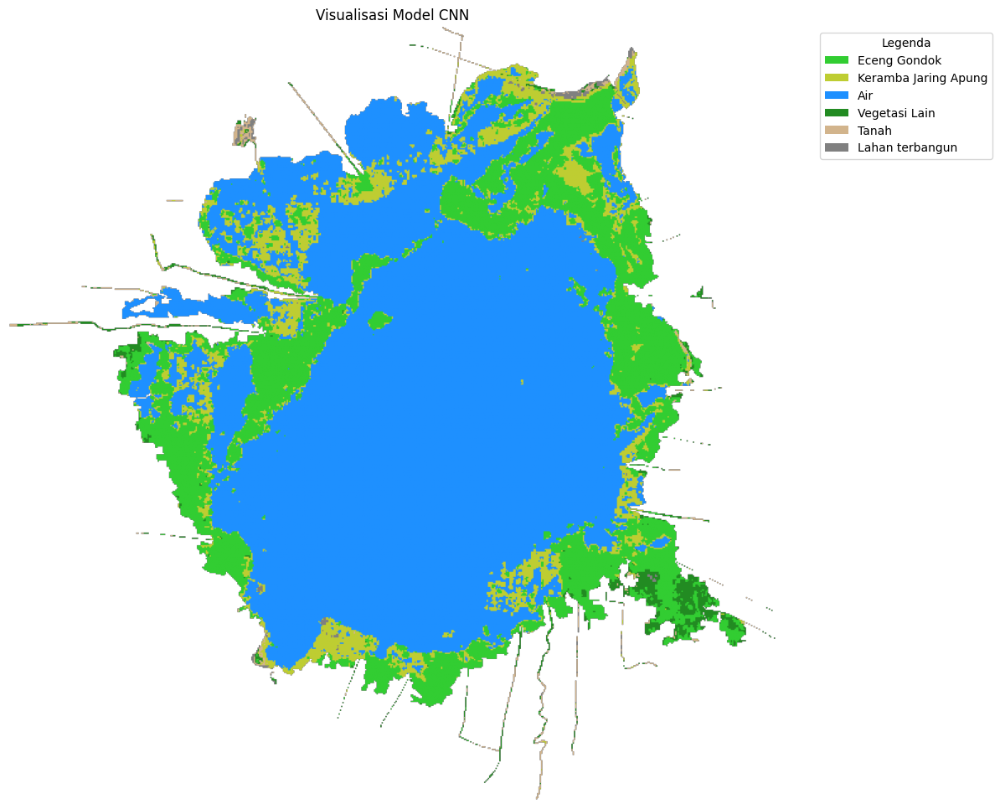

In [ ]:
# Plot CNN Final Model
fig, ax = plt.subplots(figsize=(12, 12))
im = ax.imshow(cnn_final_prediction, cmap=ListedColormap(PALETTE), norm=norm)
ax.set_title("Visualisasi Model CNN")
ax.axis('off')
# Membuat legenda manual
legend_elements = [Patch(facecolor=color, label=label) for color, label in zip(PALETTE, CLASSES)]
ax.legend(
    handles=legend_elements,
    loc='upper left',
    bbox_to_anchor=(1.05, 1),  # Menempatkan legenda di luar gambar
    title="Legenda"
)
plt.savefig(f"{BASE_PATH}/VIZ_CNN_JUNI.svg", format="svg", bbox_inches='tight')
plt.show()

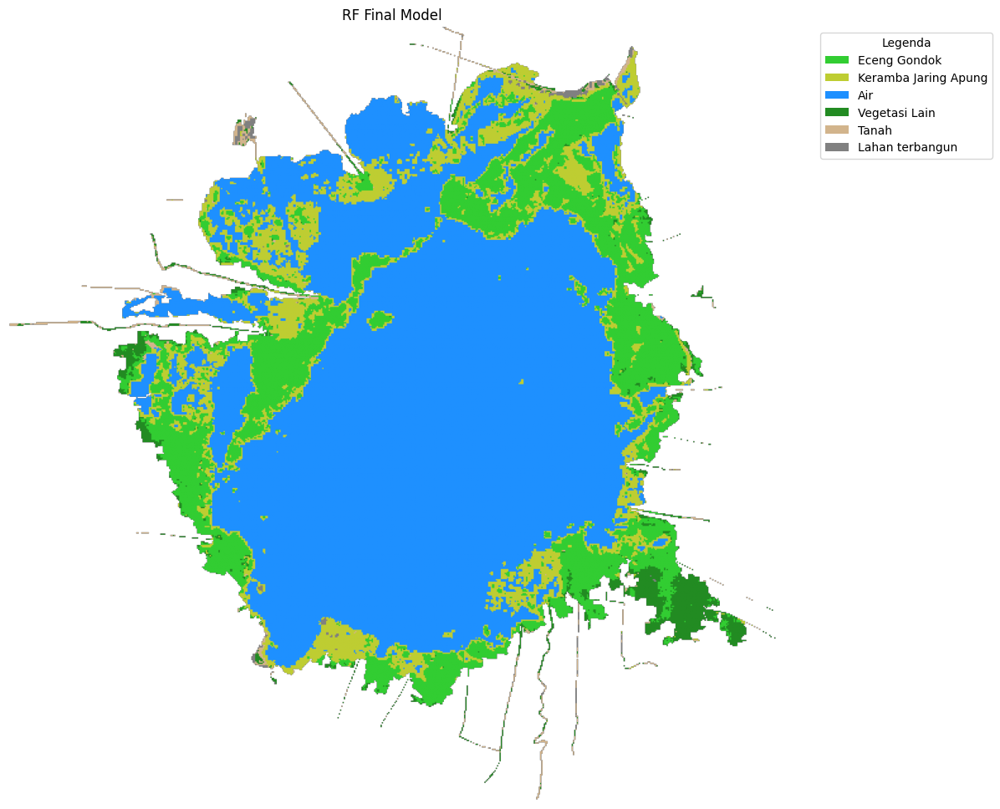

In [ ]:
fig, ax = plt.subplots(figsize=(12, 12))
im = ax.imshow(rf_final_prediction, cmap=ListedColormap(PALETTE), norm=norm)
ax.set_title("RF Final Model")
ax.axis('off')

# Membuat legenda manual
legend_elements = [Patch(facecolor=color, label=label) for color, label in zip(PALETTE, CLASSES)]
ax.legend(
    handles=legend_elements,
    loc='upper left',
    bbox_to_anchor=(1.05, 1),  # Menempatkan legenda di luar gambar
    title="Legenda"
)

plt.tight_layout()
plt.savefig(f"{BASE_PATH}/VIZ_RF_JUNI.svg", format="svg", bbox_inches='tight')
plt.show()

### JULI

In [ ]:
data = data_jul
SCALER_PATH = SCALER_PATH_JUL
NORMALIZER_PATH = NORMALIZER_PATH_JUL
MODEL_CNN1D_PATH = MODEL_CNN1D_PATH_JUL
MODEL_RF_PATH = MODEL_RF_PATH_JUL
OUTPUT_PATH_CNN1D = OUTPUT_PATH_CNN1D_JUL
OUTPUT_PATH_RF = OUTPUT_PATH_RF_JUL
IMAGE_PATH = IMAGE_PATH_JUL

#### CNN1D

In [ ]:
# parameter model sesuaikan best param tuning
conv_filters=128
conv_kernel_size=5
dense_units=64
batch_size= 8
n_epochs = 50
kernel_initializer=lecun_normal # def glorot_uniform

In [ ]:
X_train, X_test, y_train, y_test, scaler, normalizer = preprocess_data(
    data=data,
    selected_bands=SELECTED_BANDS,
    label_column=LABEL,
    n_classes=N_CLASSES,
    model_type='cnn1d'
)

Data training features (cnn1d): (840, 13, 1)
Data test features (cnn1d): (360, 13, 1)
Data training label: (840, 6)
Data test label: (360, 6)


In [ ]:
# prompt: save scaler dan nrmalixer

dump(scaler, SCALER_PATH)
dump(normalizer, NORMALIZER_PATH)


['/content/drive/MyDrive/GEE_Exports/normalizer_jul.joblib']

##### Cross-Val

In [ ]:
%%time
# Initialize confusion matrix
combined_cm = np.zeros((N_CLASSES, N_CLASSES))  # Confusion matrix
stop = EarlyStopping(monitor='val_loss', patience=10)  # Early stopping callback

# Create Stratified K-Fold (no shuffling)
kfold = StratifiedKFold(n_splits=n_fold, shuffle=False)

# Arrays to store results
fold_train_accuracies, fold_val_accuracies = [], []
fold_train_losses, fold_val_losses = [], []
all_predictions, all_labels = [], []

# Variable to store the best model based on validation loss
cnn_best_model = None
best_val_loss = float('inf')

# Loop through each fold
for fold, (train_idx, val_idx) in enumerate(kfold.split(X_train, y_train.argmax(axis=1))):
    # Split data into training and validation sets for this fold
    train_input, val_input = X_train[train_idx], X_train[val_idx]
    train_output, val_output = y_train[train_idx], y_train[val_idx]

    # Extract input dimensions
    seq_length = X_train.shape[1]
    n_features = X_train.shape[2]

    # Define the CNN model
    model = Sequential([
        Input(shape=(seq_length, n_features)),
        Conv1D(filters=conv_filters, kernel_size=conv_kernel_size, activation='relu', kernel_initializer=kernel_initializer),
        Flatten(),
        Dense(units=dense_units, kernel_initializer=kernel_initializer),
        BatchNormalization(),
        ReLU(),
        Dense(units=N_CLASSES, activation='softmax', kernel_initializer=kernel_initializer)  # Output layer for classification
    ])

    # Compile the model
    model.compile(
        optimizer=Adam(),
        loss=CategoricalCrossentropy(),
        metrics=['accuracy']
    )

    # Train the model
    result = model.fit(
        x=train_input,
        y=train_output,
        validation_data=(val_input, val_output),
        batch_size=batch_size,
        epochs=n_epochs,
        callbacks=[stop],
        verbose=0
    )

    # Get predictions for this fold
    predictions = model.predict(val_input)
    predictions_classes = predictions.argmax(axis=1)  # Convert probabilities to class labels
    true_classes = val_output.argmax(axis=1)  # Convert one-hot encoding to class labels

    # Compute accuracy for this fold
    fold_accuracy = accuracy_score(true_classes, predictions_classes)
    fold_train_accuracies.append(result.history['accuracy'])  # Append all training accuracies
    fold_val_accuracies.append(result.history['val_accuracy'])  # Append all validation accuracies
    fold_train_losses.append(result.history['loss'])  # Append all training losses
    fold_val_losses.append(result.history['val_loss'])  # Append all validation losses

    # Compute confusion matrix for this fold and add it to the combined matrix
    cm = confusion_matrix(true_classes, predictions_classes)
    combined_cm += cm

    # Store all predictions and labels for evaluation later
    all_predictions.extend(predictions_classes)
    all_labels.extend(true_classes)

    # Check if this model is the best (based on validation loss)
    val_loss = min(result.history['val_loss'])
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        cnn_best_model = model

# Print accuracy for each fold
for fold, accuracy in enumerate(fold_val_accuracies, start=1):  # Use fold_val_accuracies here
    print(f"Fold {fold} - Prediction Accuracy: {accuracy[-1]:.4f}")  # Get the last accuracy value for each fold

# Calculate and print average accuracy
average_accuracy = np.mean([fold[-1] for fold in fold_val_accuracies])  # Get the last accuracy for each fold
print(f"Average Prediction Accuracy: {average_accuracy:.4f}")

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Fold 1 - Prediction Accuracy: 0.9048
Fold 2 - Prediction Accuracy: 0.9643
Fold 3 - Prediction Accuracy: 0.9286
Fold 4 - Prediction Accuracy: 0.8690
Fold 5 - Prediction Accuracy: 0.8929
Fold 6 - Prediction Accuracy: 0.8452
Fold 7 - Prediction Accuracy: 0.8929
Fold 8 - Prediction Accuracy: 0.9762
Fold 9 - Prediction Accuracy: 0.9405
Fold 10 - Prediction Accuracy: 0.9286
Average Prediction Accuracy: 0.9143
CPU times: user 2min 21s, sys: 5.53 s, total: 2min 27s
Wall time: 3min 2s


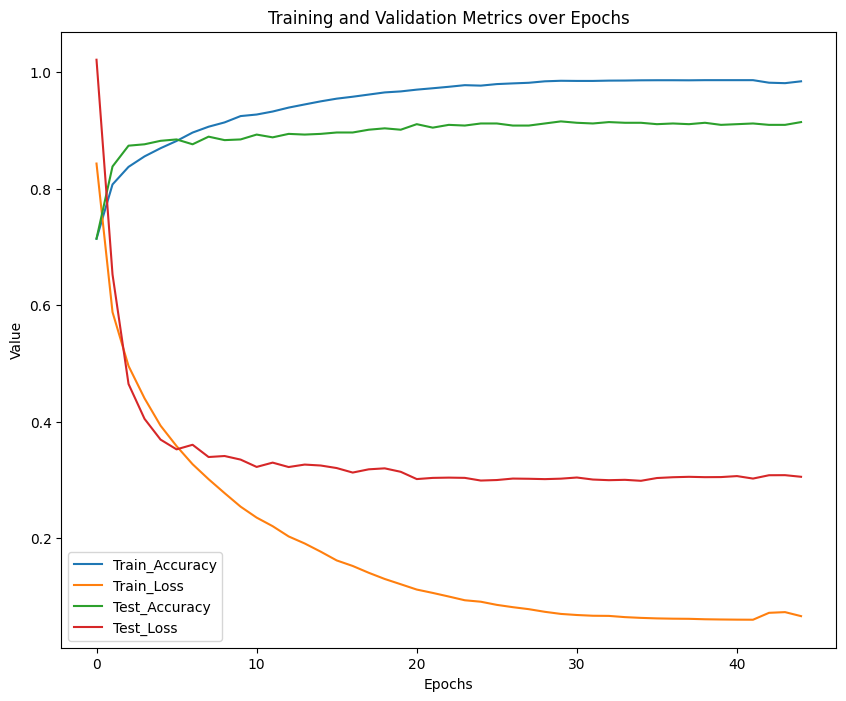

In [ ]:
# Aligning lengths of metrics across folds (if needed)
max_epochs = max([len(fold) for fold in fold_train_accuracies])
for i in range(len(fold_train_accuracies)):
    fold_train_accuracies[i] += [fold_train_accuracies[i][-1]] * (max_epochs - len(fold_train_accuracies[i]))
    fold_val_accuracies[i] += [fold_val_accuracies[i][-1]] * (max_epochs - len(fold_val_accuracies[i]))
    fold_train_losses[i] += [fold_train_losses[i][-1]] * (max_epochs - len(fold_train_losses[i]))
    fold_val_losses[i] += [fold_val_losses[i][-1]] * (max_epochs - len(fold_val_losses[i]))

# Calculate the mean of all metrics across folds
mean_train_accuracy = np.mean(fold_train_accuracies, axis=0)
mean_val_accuracy = np.mean(fold_val_accuracies, axis=0)
mean_train_loss = np.mean(fold_train_losses, axis=0)
mean_val_loss = np.mean(fold_val_losses, axis=0)

# Create a DataFrame for easy plotting
history = pd.DataFrame({
    'Train_Accuracy': mean_train_accuracy,
    'Train_Loss': mean_train_loss,
    'Test_Accuracy': mean_val_accuracy,
    'Test_Loss': mean_val_loss
})

# Plot the results
plt.figure(figsize=(10, 8))
plt.plot(range(len(history['Train_Accuracy'])), history['Train_Accuracy'], label='Train_Accuracy')
plt.plot(range(len(history['Train_Loss'])), history['Train_Loss'], label='Train_Loss')
plt.plot(range(len(history['Test_Accuracy'])), history['Test_Accuracy'], label='Test_Accuracy')
plt.plot(range(len(history['Test_Loss'])), history['Test_Loss'], label='Test_Loss')

plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.title('Training and Validation Metrics over Epochs')
plt.show()

##### Final Model

In [ ]:
%%time
stop = EarlyStopping(
    monitor='val_loss',
    patience=10
)
# Buat ulang model
# Extract input dimensions
seq_length = X_train.shape[1]
n_features = X_train.shape[2]

# Define the CNN model
cnn_final_model = Sequential([
    Input(shape=(seq_length, n_features)),
    Conv1D(filters=conv_filters, kernel_size=conv_kernel_size, activation='relu', kernel_initializer=kernel_initializer),
    Flatten(),
    Dense(units=dense_units, kernel_initializer=kernel_initializer),
    BatchNormalization(),
    ReLU(),
    Dense(units=N_CLASSES, activation='softmax', kernel_initializer=kernel_initializer)  # Output layer for classification
])

# Compile the model
cnn_final_model.compile(
    optimizer=Adam(),
    loss=CategoricalCrossentropy(),
    metrics=['accuracy']
)

# Train the model with early stopping
result = cnn_final_model.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=n_epochs,
    validation_data=(X_test, y_test),
    callbacks=[stop],
    verbose=1
)

cnn_final_model.save(MODEL_CNN1D_PATH)

Epoch 1/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.6773 - loss: 1.0193 - val_accuracy: 0.5778 - val_loss: 1.1267
Epoch 2/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8250 - loss: 0.6208 - val_accuracy: 0.7222 - val_loss: 0.7440
Epoch 3/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8399 - loss: 0.5198 - val_accuracy: 0.7972 - val_loss: 0.5532
Epoch 4/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8480 - loss: 0.4600 - val_accuracy: 0.8222 - val_loss: 0.4621
Epoch 5/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8645 - loss: 0.4170 - val_accuracy: 0.8333 - val_loss: 0.4216
Epoch 6/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8851 - loss: 0.3761 - val_accuracy: 0.8444 - val_loss: 0.3871
Epoch 7/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8938 - loss: 0.3447 - val_accuracy: 0.8389 - val_loss: 0.3957
Epoch 8/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9028 - loss: 0.3141 - val_accuracy: 0.

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9510 - loss: 0.1307  
Loss pada data train: 0.1494
Accuracy pada data train: 0.9440
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


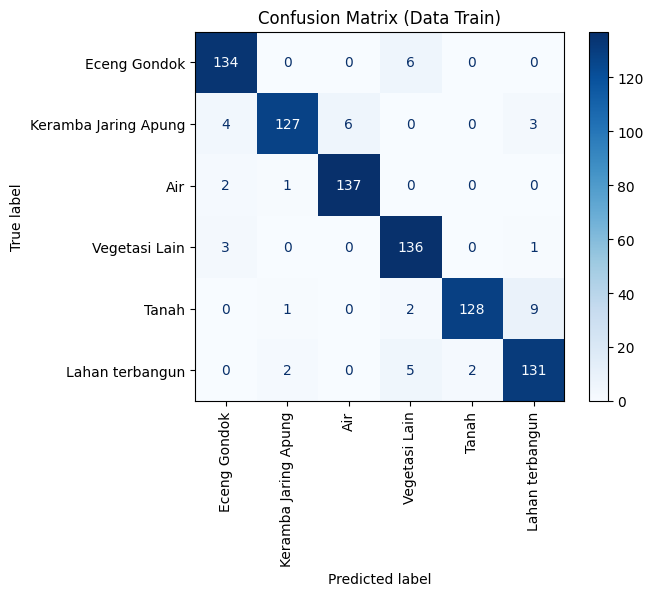


Classification Report (Data Train):
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       140
           1       0.97      0.91      0.94       140
           2       0.96      0.98      0.97       140
           3       0.91      0.97      0.94       140
           4       0.98      0.91      0.95       140
           5       0.91      0.94      0.92       140

    accuracy                           0.94       840
   macro avg       0.95      0.94      0.94       840
weighted avg       0.95      0.94      0.94       840

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9122 - loss: 0.2822 

Loss pada data test: 0.2855
Accuracy pada data test: 0.9167
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


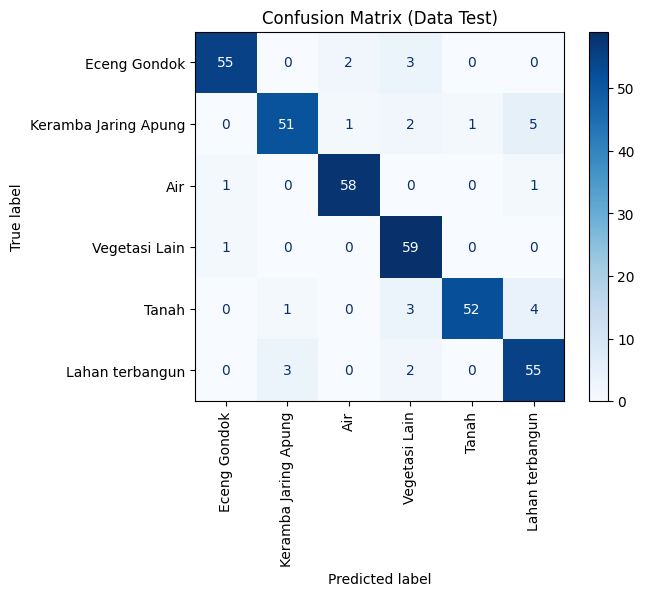


Classification Report (Data Test):
              precision    recall  f1-score   support

           0       0.96      0.92      0.94        60
           1       0.93      0.85      0.89        60
           2       0.95      0.97      0.96        60
           3       0.86      0.98      0.91        60
           4       0.98      0.87      0.92        60
           5       0.85      0.92      0.88        60

    accuracy                           0.92       360
   macro avg       0.92      0.92      0.92       360
weighted avg       0.92      0.92      0.92       360



In [ ]:
# Evaluasi model pada data train
train_loss, train_accuracy = cnn_final_model.evaluate(X_train, y_train, verbose=1)
print(f"Loss pada data train: {train_loss:.4f}")
print(f"Accuracy pada data train: {train_accuracy:.4f}")

# Prediksi pada data train
train_predictions = cnn_final_model.predict(X_train)
train_predictions_classes = train_predictions.argmax(axis=1)  # Konversi probabilitas ke kelas
train_true_classes = y_train.argmax(axis=1)  # Konversi one-hot encoding ke kelas asli

# Hitung confusion matrix pada data train
train_cm = confusion_matrix(train_true_classes, train_predictions_classes)

# Tampilkan confusion matrix untuk data train
disp_train = ConfusionMatrixDisplay(train_cm, display_labels=CLASSES)
disp_train.plot(cmap='Blues')
plt.xticks(rotation=90)
plt.title("Confusion Matrix (Data Train)")
plt.show()

# Tampilkan classification report untuk data train
print("\nClassification Report (Data Train):")
print(classification_report(train_true_classes, train_predictions_classes))

# Evaluasi model pada data test
test_loss, test_accuracy = cnn_final_model.evaluate(X_test, y_test, verbose=1)
print(f"\nLoss pada data test: {test_loss:.4f}")
print(f"Accuracy pada data test: {test_accuracy:.4f}")

# Prediksi pada data test
test_predictions = cnn_final_model.predict(X_test)
test_predictions_classes = test_predictions.argmax(axis=1)  # Konversi probabilitas ke kelas
test_true_classes = y_test.argmax(axis=1)  # Konversi one-hot encoding ke kelas asli

# Hitung confusion matrix pada data test
test_cm = confusion_matrix(test_true_classes, test_predictions_classes)

# Tampilkan confusion matrix untuk data test
disp_test = ConfusionMatrixDisplay(test_cm, display_labels=CLASSES)
disp_test.plot(cmap='Blues')
plt.xticks(rotation=90)
plt.title("Confusion Matrix (Data Test)")
plt.savefig(f"{BASE_PATH}/Confusion_Matrix_Test_CNN_JULI.svg", format="svg", bbox_inches='tight')
plt.show()

# Tampilkan classification report untuk data test
print("\nClassification Report (Data Test):")
print(classification_report(test_true_classes, test_predictions_classes))

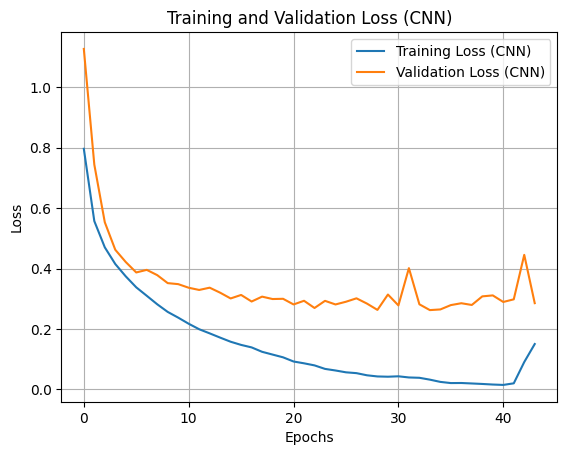

In [ ]:
# Plot training dan validation loss untuk CNN
plt.plot(result.history['loss'], label='Training Loss (CNN)')
plt.plot(result.history['val_loss'], label='Validation Loss (CNN)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (CNN)')
plt.legend()
plt.grid()
plt.savefig(f"{BASE_PATH}/Loss_Curve_CNN_JULI.svg", format="svg", bbox_inches='tight')
plt.show()

In [ ]:
print(cnn_final_model.summary())

Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_54 (Conv1D)              │ (None, 9, 128)         │           768 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_54 (Flatten)            │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 64)             │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_54          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_54 (ReLU)                 │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 6)              │           390 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 225,364 (880.33 KB)

 Trainable params: 75,078 (293.27 KB)

 Non-trainable params: 128 (512.00 B)

 Optimizer params: 150,158 (586.56 KB)

None


#### Random Forest

In [ ]:
# Hyperparameters for Random Forest
n_estimators = 50    # def 100
max_depth = 13       # def None
min_samples_split = 4  # def 2
min_samples_leaf = 2   # def 1
max_features = None   # def 'sqrt'
max_leaf_nodes = 40   # def None
max_samples = None    # def None

In [ ]:
# Preprocess data
X_train, X_test, y_train, y_test, scaler, normalizer = preprocess_data(
    data=data,
    selected_bands=SELECTED_BANDS,
    label_column=LABEL,
    n_classes=N_CLASSES,
    model_type='rf'
)

Data training features (rf): (840, 13)
Data test features (rf): (360, 13)
Data training label: (840,)
Data test label: (360,)


##### Cross-Val

In [ ]:
%%time
# Perform Random Forest Cross-Validation
combined_cm = np.zeros((N_CLASSES, N_CLASSES))  # Initialize confusion matrix
kfold = StratifiedKFold(n_splits=n_fold, shuffle=True, random_state=222111840)  # 5-fold cross-validation

fold_train_accuracies = []
fold_val_accuracies = []
all_predictions = []
all_labels = []

rf_best_model = None
best_val_accuracy = 0

# Loop for each fold
for train_idx, val_idx in kfold.split(X_train, y_train):
    train_input, val_input = X_train[train_idx], X_train[val_idx]
    train_output, val_output = y_train[train_idx], y_train[val_idx]

    # Create Random Forest model for each fold
    model = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        max_features=max_features,
        max_leaf_nodes=max_leaf_nodes,
        max_samples=max_samples,
        random_state=222111840
    )

    # Train the model
    model.fit(train_input, train_output)

    # Predictions on validation data
    predictions = model.predict(val_input)
    true_classes = val_output

    # Calculate accuracy for this fold
    fold_val_accuracy = np.mean(predictions == true_classes)
    fold_train_accuracy = model.score(train_input, train_output)

    # Calculate confusion matrix for this fold
    cm = confusion_matrix(true_classes, predictions)
    combined_cm += cm  # Add to the combined confusion matrix

    # Store results
    all_predictions.extend(predictions)
    all_labels.extend(true_classes)
    fold_train_accuracies.append(fold_train_accuracy)
    fold_val_accuracies.append(fold_val_accuracy)

    # Update the best model based on validation accuracy
    if fold_val_accuracy > best_val_accuracy:
        best_val_accuracy = fold_val_accuracy
        rf_best_model = model

# Calculate mean accuracies
mean_train_accuracy = np.mean(fold_train_accuracies)
mean_val_accuracy = np.mean(fold_val_accuracies)


CPU times: user 4.39 s, sys: 15 ms, total: 4.4 s
Wall time: 5.93 s


Accuracy per Fold:
   Train_Accuracy  Test_Accuracy
0        0.969577       0.857143
1        0.968254       0.940476
2        0.973545       0.904762
3        0.968254       0.904762
4        0.965608       0.869048
5        0.970899       0.809524
6        0.969577       0.892857
7        0.970899       0.845238
8        0.972222       0.833333
9        0.969577       0.928571


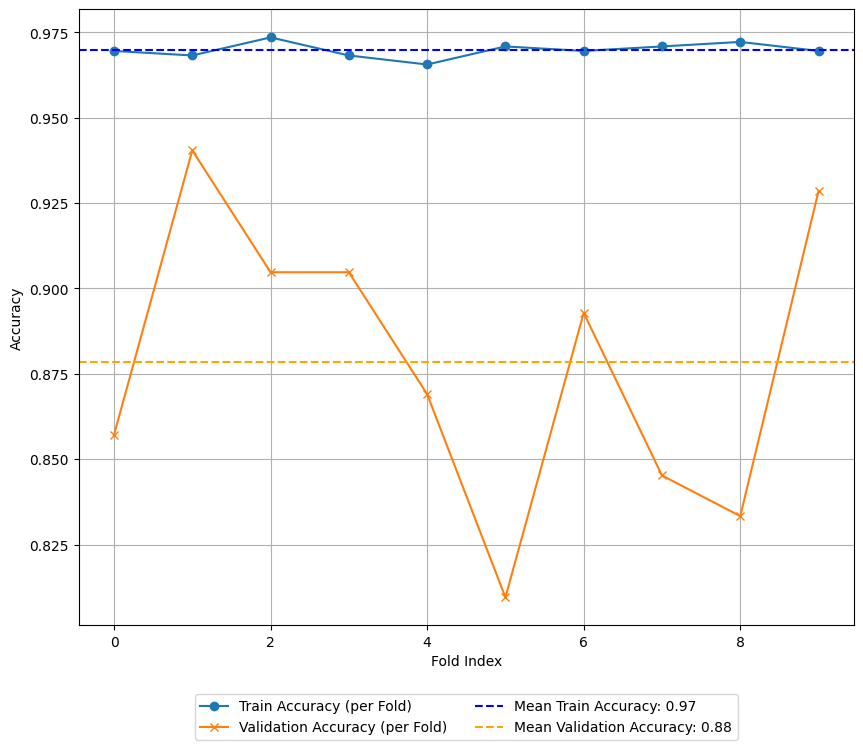

Mean Accuracy per Fold:
   Train_Accuracy_Mean  Test_Accuracy_Mean
0             0.969841            0.878571
Training Accuracy: 0.9655


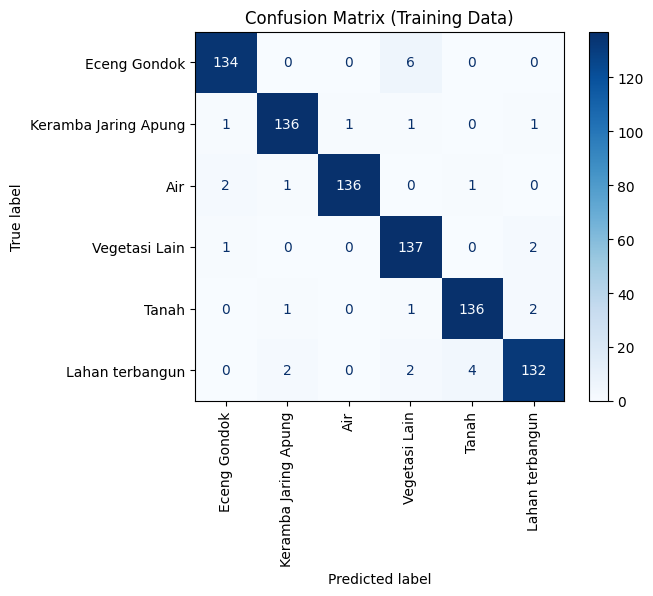


Classification Report (Training Data):
              precision    recall  f1-score   support

           0       0.97      0.96      0.96       140
           1       0.97      0.97      0.97       140
           2       0.99      0.97      0.98       140
           3       0.93      0.98      0.95       140
           4       0.96      0.97      0.97       140
           5       0.96      0.94      0.95       140

    accuracy                           0.97       840
   macro avg       0.97      0.97      0.97       840
weighted avg       0.97      0.97      0.97       840

Test Accuracy: 0.8722


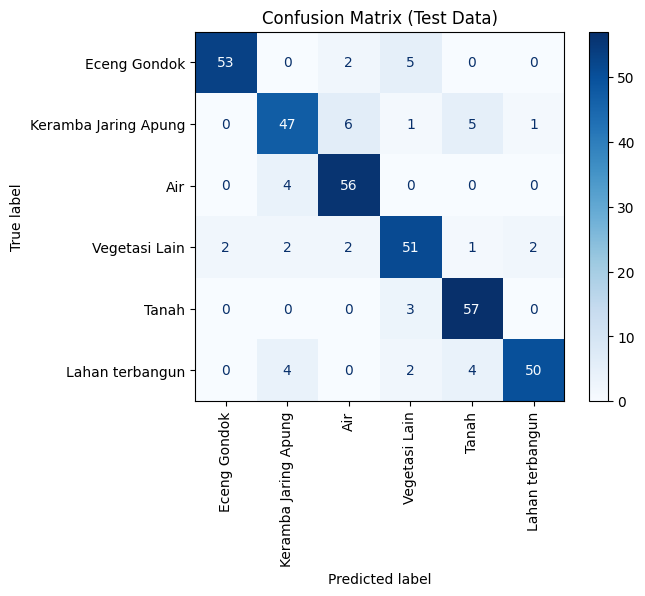


Classification Report (Test Data):
              precision    recall  f1-score   support

           0       0.96      0.88      0.92        60
           1       0.82      0.78      0.80        60
           2       0.85      0.93      0.89        60
           3       0.82      0.85      0.84        60
           4       0.85      0.95      0.90        60
           5       0.94      0.83      0.88        60

    accuracy                           0.87       360
   macro avg       0.88      0.87      0.87       360
weighted avg       0.88      0.87      0.87       360

   Feature  Importance
0      FAI    0.198224
7       B5    0.153962
2      BSI    0.147690
10     B12    0.132823
3     NBAI    0.127386
6       B4    0.092658
12      VH    0.028738
11      VV    0.028465
8       B8    0.024717
4       B2    0.024655
5       B3    0.019486
1    MNDWI    0.011833
9      B11    0.009364


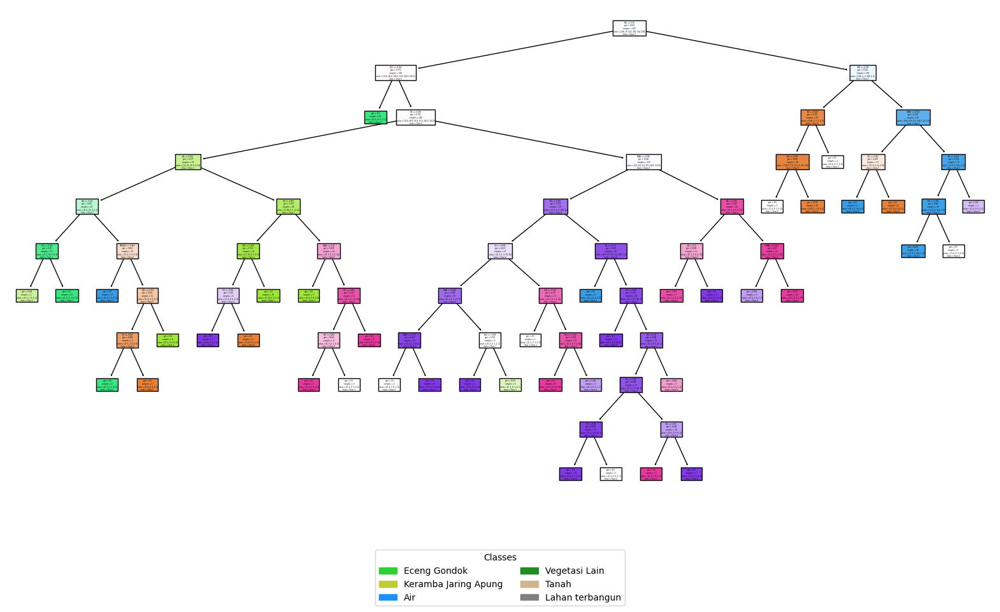

In [ ]:
# Plotting Random Forest Cross-Validation Accuracy
history = pd.DataFrame({
    'Train_Accuracy': fold_train_accuracies,  # Training accuracy per fold
    'Test_Accuracy': fold_val_accuracies  # Validation accuracy per fold
})

history_mean = pd.DataFrame({
    'Train_Accuracy_Mean': [mean_train_accuracy],
    'Test_Accuracy_Mean': [mean_val_accuracy]
})

# Display accuracy per fold
print("Accuracy per Fold:")
print(history)

# Plot the accuracy results per fold
plt.figure(figsize=(10, 8))
plt.plot(range(len(fold_train_accuracies)), fold_train_accuracies, label='Train Accuracy (per Fold)', marker='o')
plt.plot(range(len(fold_val_accuracies)), fold_val_accuracies, label='Validation Accuracy (per Fold)', marker='x')
plt.axhline(mean_train_accuracy, color='blue', linestyle='--', label=f'Mean Train Accuracy: {mean_train_accuracy:.2f}')
plt.axhline(mean_val_accuracy, color='orange', linestyle='--', label=f'Mean Validation Accuracy: {mean_val_accuracy:.2f}')
plt.xlabel('Fold Index')
plt.ylabel('Accuracy')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=2)
plt.grid(True)
plt.show()

# Display the mean accuracy results
print("Mean Accuracy per Fold:")
print(history_mean)

# Evaluate the final Random Forest model on training and testing data
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import ConfusionMatrixDisplay

# Training evaluation
train_predictions = rf_best_model.predict(X_train)
train_accuracy = accuracy_score(y_train, train_predictions)
print(f"Training Accuracy: {train_accuracy:.4f}")

train_cm = confusion_matrix(y_train, train_predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=train_cm, display_labels=CLASSES)
disp.plot(cmap='Blues')
plt.xticks(rotation=90)
plt.title("Confusion Matrix (Training Data)")
plt.show()

print("\nClassification Report (Training Data):")
print(classification_report(y_train, train_predictions))

# Testing evaluation
test_predictions = rf_best_model.predict(X_test)
test_accuracy = accuracy_score(y_test, test_predictions)
print(f"Test Accuracy: {test_accuracy:.4f}")

test_cm = confusion_matrix(y_test, test_predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=test_cm, display_labels=CLASSES)
disp.plot(cmap='Blues')
plt.xticks(rotation=90)
plt.title("Confusion Matrix (Test Data)")
plt.show()

print("\nClassification Report (Test Data):")
print(classification_report(y_test, test_predictions))

# Evaluate feature importance and plot one of the trees
import matplotlib.patches as mpatches
from sklearn.tree import plot_tree

feature_importance = rf_best_model.feature_importances_
importance_df = pd.DataFrame({
    'Feature': SELECTED_BANDS,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

print(importance_df)

plt.figure(figsize=(20, 10))
plot_tree(
    rf_best_model.estimators_[0],  # Plot the first tree in the forest
    feature_names=SELECTED_BANDS,
    class_names=[f"Class {i}" for i in range(N_CLASSES)],
    filled=True
)

# Create a legend for the class colors
class_colors = PALETTE
patches = [mpatches.Patch(color=color, label=label) for color, label in zip(class_colors, CLASSES)]

# Add legend
plt.legend(handles=patches, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=2, title="Classes")

plt.show()


##### Final Model

In [ ]:
%%time
# Buat ulang model Random Forest
rf_final_model = RandomForestClassifier(
    n_estimators=n_estimators,
    max_depth=max_depth,
    min_samples_split=min_samples_split,
    min_samples_leaf=min_samples_leaf,
    max_leaf_nodes=max_leaf_nodes,
    random_state=seed
)

# Latih model Random Forest pada data training
rf_final_model.fit(X_train, y_train)

# Simpan model
dump(rf_final_model, MODEL_RF_PATH)

CPU times: user 177 ms, sys: 1.92 ms, total: 179 ms
Wall time: 188 ms


['/content/drive/MyDrive/GEE_Exports/model_rf_jul.joblib']

Training Accuracy: 0.9571


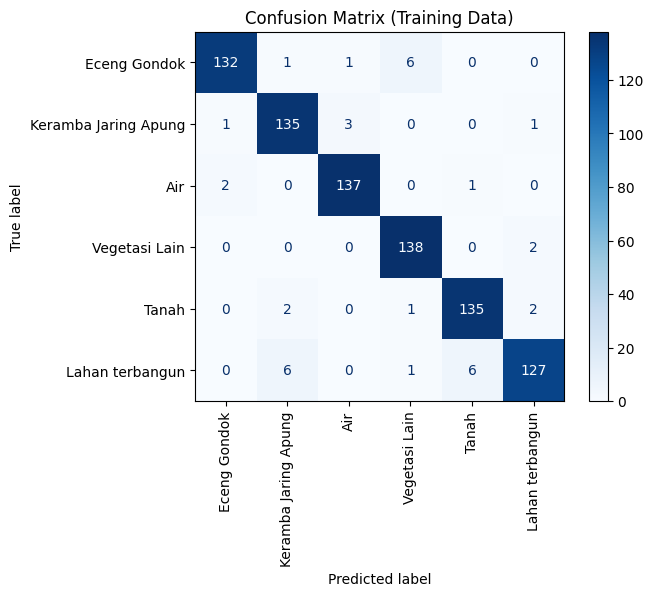


Classification Report (Training Data):
              precision    recall  f1-score   support

           0       0.98      0.94      0.96       140
           1       0.94      0.96      0.95       140
           2       0.97      0.98      0.98       140
           3       0.95      0.99      0.97       140
           4       0.95      0.96      0.96       140
           5       0.96      0.91      0.93       140

    accuracy                           0.96       840
   macro avg       0.96      0.96      0.96       840
weighted avg       0.96      0.96      0.96       840

Test Accuracy: 0.8889


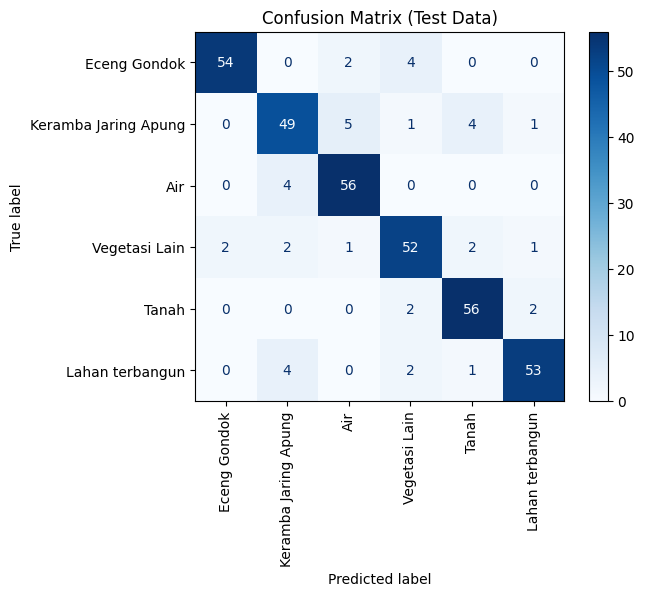


Classification Report (Test Data):
              precision    recall  f1-score   support

           0       0.96      0.90      0.93        60
           1       0.83      0.82      0.82        60
           2       0.88      0.93      0.90        60
           3       0.85      0.87      0.86        60
           4       0.89      0.93      0.91        60
           5       0.93      0.88      0.91        60

    accuracy                           0.89       360
   macro avg       0.89      0.89      0.89       360
weighted avg       0.89      0.89      0.89       360

   Feature  Importance
10     B12    0.130586
0      FAI    0.118106
3     NBAI    0.111166
2      BSI    0.102489
6       B4    0.098117
7       B5    0.090198
8       B8    0.075508
9      B11    0.066777
4       B2    0.064237
1    MNDWI    0.045400
11      VV    0.043121
5       B3    0.036192
12      VH    0.018102


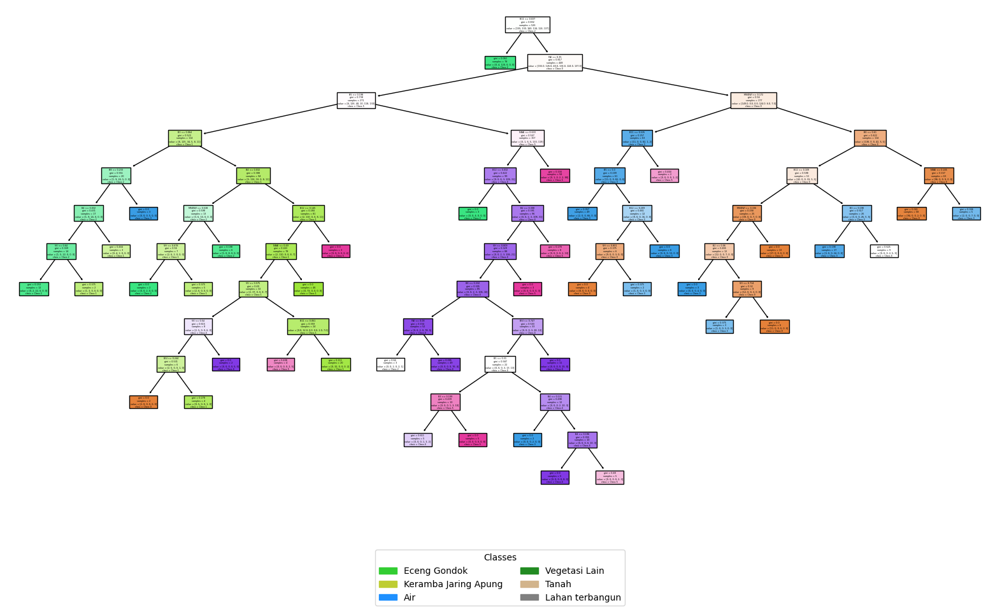

Rata-rata Kedalaman Pohon (Depth): 10.38
Max Kedalaman Pohon (Depth): 13
Min Kedalaman Pohon (Depth): 8
Rata-rata Jumlah Leaf Node: 40.00
Max Jumlah Leaf Node: 40
Min Jumlah Leaf Node: 40


In [ ]:
# Evaluate model on training data
train_predictions = rf_final_model.predict(X_train)
train_accuracy = accuracy_score(y_train, train_predictions)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Confusion matrix for training data
train_cm = confusion_matrix(y_train, train_predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=train_cm, display_labels=CLASSES)
disp.plot(cmap='Blues')
plt.xticks(rotation=90)
plt.title("Confusion Matrix (Training Data)")
plt.show()

print("\nClassification Report (Training Data):")
print(classification_report(y_train, train_predictions))

# Evaluate model on test data
test_predictions = rf_final_model.predict(X_test)
test_accuracy = accuracy_score(y_test, test_predictions)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Confusion matrix for test data
test_cm = confusion_matrix(y_test, test_predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=test_cm, display_labels=CLASSES)
disp.plot(cmap='Blues')
plt.xticks(rotation=90)
plt.title("Confusion Matrix (Test Data)")
plt.savefig(f"{BASE_PATH}/Confusion_Matrix_Test_RF_JULI.svg", format="svg", bbox_inches='tight')
plt.show()

print("\nClassification Report (Test Data):")
print(classification_report(y_test, test_predictions))

feature_importance = rf_final_model.feature_importances_
importance_df = pd.DataFrame({
    'Feature': SELECTED_BANDS,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

print(importance_df)

plt.figure(figsize=(20, 10))
plot_tree(
    rf_final_model.estimators_[0],  # Plot the first tree in the forest
    feature_names=SELECTED_BANDS,
    class_names=[f"Class {i}" for i in range(N_CLASSES)],
    filled=True
)

# Create a legend for the class colors
class_colors = PALETTE
patches = [mpatches.Patch(color=color, label=label) for color, label in zip(class_colors, CLASSES)]

# Add legend
plt.legend(handles=patches, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=2, title="Classes")
plt.show()

# Inisialisasi variabel untuk kedalaman dan leaf node
depths = []
leaf_nodes = []

# Loop melalui setiap pohon dalam hutan
for tree in rf_final_model.estimators_:
    depths.append(tree.tree_.max_depth)  # Tambahkan kedalaman ke daftar
    leaf_nodes.append(tree.tree_.n_leaves)  # Tambahkan jumlah leaf node ke daftar

# Hitung rata-rata, maksimum, dan minimum untuk kedalaman
average_depth = sum(depths) / len(depths)
max_depth = max(depths)
min_depth = min(depths)

# Hitung rata-rata, maksimum, dan minimum untuk leaf node
average_leaf_nodes = sum(leaf_nodes) / len(leaf_nodes)
max_leaf_nodes = max(leaf_nodes)
min_leaf_nodes = min(leaf_nodes)

# Cetak hasil
print(f"Rata-rata Kedalaman Pohon (Depth): {average_depth:.2f}")
print(f"Max Kedalaman Pohon (Depth): {max_depth}")
print(f"Min Kedalaman Pohon (Depth): {min_depth}")
print(f"Rata-rata Jumlah Leaf Node: {average_leaf_nodes:.2f}")
print(f"Max Jumlah Leaf Node: {max_leaf_nodes}")
print(f"Min Jumlah Leaf Node: {min_leaf_nodes}")


#### Permutation Feature Importance

Cara Membaca Plot per Kelas 📊
Mari kita ambil contoh plot untuk kelas 'Air'.

1. Bar Panjang & Positif (Contoh: MNDWI mungkin memiliki nilai 0.40)

Artinya: "Ketika data fitur MNDWI diacak, kemampuan model untuk mengenali 'Air' (Recall) turun sebesar 40%."

Interpretasi: Fitur MNDWI sangat krusial bagi model untuk bisa mengidentifikasi 'Air'. Model sangat bergantung pada fitur ini. Ini sesuai dengan teori, karena MNDWI (Modified Normalized Difference Water Index) memang dirancang untuk mendeteksi air.

2. Bar Pendek & Positif (Contoh: B11 mungkin memiliki nilai 0.02)

Artinya: "Ketika data fitur B11 diacak, Recall untuk kelas 'Air' hanya turun sebesar 2%."

Interpretasi: Fitur B11 memiliki sedikit kontribusi, tapi tidak signifikan. Model menggunakannya, tapi tidak terlalu bergantung padanya untuk mengenali 'Air'.

3. Bar Sangat Pendek atau Nol (Contoh: BSI mungkin memiliki nilai 0.001)

Artinya: "Mengacak fitur BSI hampir tidak mengubah kemampuan model untuk mengenali 'Air'."

Interpretasi: Fitur BSI (Bare Soil Index) tidak penting untuk kelas 'Air'. Ini masuk akal karena tanah kosong dan air adalah dua hal yang sangat berbeda.

4. Bar Negatif (Contoh: Tanah mungkin memiliki nilai -0.01)

Artinya: "Anehnya, setelah fitur 'Tanah' diacak, kemampuan model mengenali 'Air' justru sedikit meningkat sebesar 1%."

Interpretasi: Ini adalah kasus yang menarik. Artinya, fitur tersebut mungkin mengandung noise atau pola yang sedikit menyesatkan model. Dengan mengacaknya, model tidak lagi terkecoh. Secara praktis, ini sama dengan menganggap fitur tersebut tidak penting atau bahkan mengganggu.

#### Viz Hasil

In [ ]:
# Load and process bands
image_bands, (height, width, crs, transform) = load_and_process_bands(IMAGE_PATH, SELECTED_BANDS)

# Create mask
mask = create_mask(IMAGE_PATH, mapping(rawa_pening_gdf.geometry[0]))

# Create a 2x2 grid for visualization
norm = plt.Normalize(vmin=0, vmax=len(PALETTE)-1)  # Normalize for consistent color range

# Preprocess image data for CNN
image_input_cnn = preprocess_image_input(image_bands.transpose(1, 2, 0), scaler, normalizer, model_type="cnn")

# Predict and visualize CNN Final Model
cnn_final_prediction = predict_and_mask(
    model=cnn_final_model,
    image_input=image_input_cnn,
    mask=mask,
    model_type="cnn",
    height=height,
    width=width,
    crs=crs,
    transform=transform,
    output_path=OUTPUT_PATH_CNN1D
)

# Preprocess image data for RF
image_input_rf = preprocess_image_input(image_bands.transpose(1, 2, 0), scaler, normalizer, model_type="rf")

# Predict and visualize RF Final Model
rf_final_prediction = predict_and_mask(
    model=rf_final_model,
    image_input=image_input_rf,
    mask=mask,
    model_type="rf",
    height=height,
    width=width,
    crs=crs,
    transform=transform,
    output_path=OUTPUT_PATH_RF
)

# Calculate and print area for each prediction
print_area_per_model(cnn_final_prediction, "CNN Final Model")
print_area_per_model(rf_final_prediction, "RF Final Model")

  37/5805 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step   

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


5805/5805 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(



Hasil untuk CNN Final Model:
Kelas 0:
  Luas dalam piksel: 32627 piksel
  Luas dalam m²: 3262700.00 m²
  Luas dalam hektar: 326.2700 ha
Kelas 1:
  Luas dalam piksel: 7505 piksel
  Luas dalam m²: 750500.00 m²
  Luas dalam hektar: 75.0500 ha
Kelas 2:
  Luas dalam piksel: 111016 piksel
  Luas dalam m²: 11101600.00 m²
  Luas dalam hektar: 1110.1600 ha
Kelas 3:
  Luas dalam piksel: 4772 piksel
  Luas dalam m²: 477200.00 m²
  Luas dalam hektar: 47.7200 ha
Kelas 4:
  Luas dalam piksel: 1071 piksel
  Luas dalam m²: 107100.00 m²
  Luas dalam hektar: 10.7100 ha
Kelas 5:
  Luas dalam piksel: 1286 piksel
  Luas dalam m²: 128600.00 m²
  Luas dalam hektar: 12.8600 ha

Hasil untuk RF Final Model:
Kelas 0:
  Luas dalam piksel: 28614 piksel
  Luas dalam m²: 2861400.00 m²
  Luas dalam hektar: 286.1400 ha
Kelas 1:
  Luas dalam piksel: 9782 piksel
  Luas dalam m²: 978200.00 m²
  Luas dalam hektar: 97.8200 ha
Kelas 2:
  Luas dalam piksel: 110372 piksel
  Luas dalam m²: 11037200.00 m²
  Luas dalam hektar: 

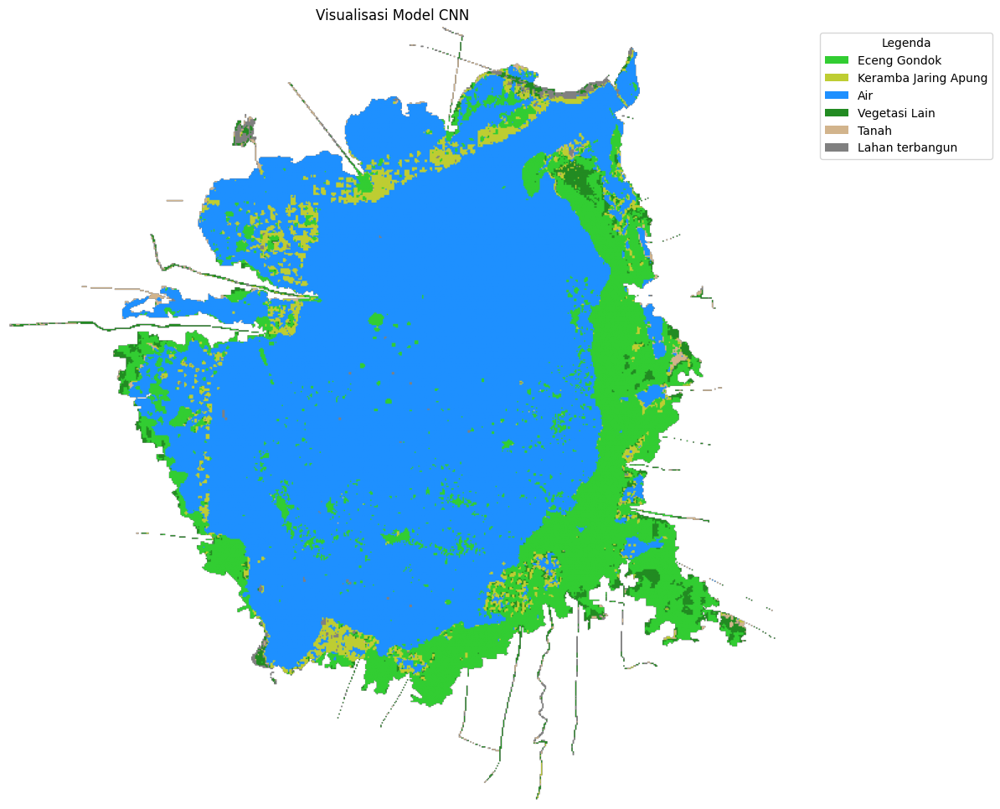

In [ ]:
# Plot CNN Final Model
fig, ax = plt.subplots(figsize=(12, 12))
im = ax.imshow(cnn_final_prediction, cmap=ListedColormap(PALETTE), norm=norm)
ax.set_title("Visualisasi Model CNN")
ax.axis('off')
# Membuat legenda manual
legend_elements = [Patch(facecolor=color, label=label) for color, label in zip(PALETTE, CLASSES)]
ax.legend(
    handles=legend_elements,
    loc='upper left',
    bbox_to_anchor=(1.05, 1),  # Menempatkan legenda di luar gambar
    title="Legenda"
)
plt.savefig(f"{BASE_PATH}/VIZ_CNN_JULI.svg", format="svg", bbox_inches='tight')
plt.show()

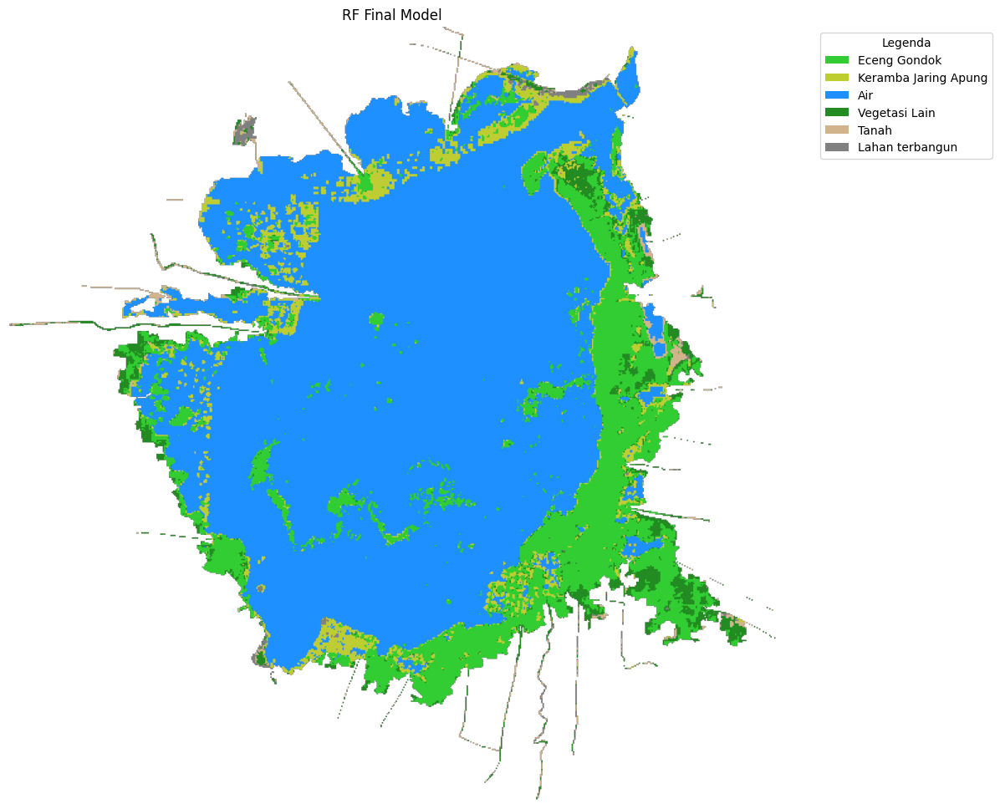

In [ ]:
fig, ax = plt.subplots(figsize=(12, 12))
im = ax.imshow(rf_final_prediction, cmap=ListedColormap(PALETTE), norm=norm)
ax.set_title("RF Final Model")
ax.axis('off')

# Membuat legenda manual
legend_elements = [Patch(facecolor=color, label=label) for color, label in zip(PALETTE, CLASSES)]
ax.legend(
    handles=legend_elements,
    loc='upper left',
    bbox_to_anchor=(1.05, 1),  # Menempatkan legenda di luar gambar
    title="Legenda"
)
plt.savefig(f"{BASE_PATH}/VIZ_RF_JULI.svg", format="svg", bbox_inches='tight')
plt.tight_layout()
plt.show()

### AGUSTUS

In [ ]:
data = data_ags
SCALER_PATH = SCALER_PATH_AGS
NORMALIZER_PATH = NORMALIZER_PATH_AGS
MODEL_CNN1D_PATH = MODEL_CNN1D_PATH_AGS
MODEL_RF_PATH = MODEL_RF_PATH_AGS
OUTPUT_PATH_CNN1D = OUTPUT_PATH_CNN1D_AGS
OUTPUT_PATH_RF = OUTPUT_PATH_RF_AGS
IMAGE_PATH = IMAGE_PATH_AGS

#### CNN1D

In [ ]:
# parameter model sesuaikan best param tuning
conv_filters=128
conv_kernel_size=3
dense_units=64
batch_size= 32
n_epochs = 50
kernel_initializer=glorot_uniform # def glorot_uniform

In [ ]:
X_train, X_test, y_train, y_test, scaler, normalizer = preprocess_data(
    data=data,
    selected_bands=SELECTED_BANDS,
    label_column=LABEL,
    n_classes=N_CLASSES,
    model_type='cnn1d'
)

Data training features (cnn1d): (840, 13, 1)
Data test features (cnn1d): (360, 13, 1)
Data training label: (840, 6)
Data test label: (360, 6)


In [ ]:
# prompt: save scaler dan nrmalixer

dump(scaler, SCALER_PATH)
dump(normalizer, NORMALIZER_PATH)


['/content/drive/MyDrive/GEE_Exports/normalizer_ags.joblib']

##### Cross-Val

In [ ]:
%%time
# Initialize confusion matrix
combined_cm = np.zeros((N_CLASSES, N_CLASSES))  # Confusion matrix
stop = EarlyStopping(monitor='val_loss', patience=10)  # Early stopping callback

# Create Stratified K-Fold (no shuffling)
kfold = StratifiedKFold(n_splits=n_fold, shuffle=False)

# Arrays to store results
fold_train_accuracies, fold_val_accuracies = [], []
fold_train_losses, fold_val_losses = [], []
all_predictions, all_labels = [], []

# Variable to store the best model based on validation loss
cnn_best_model = None
best_val_loss = float('inf')

# Loop through each fold
for fold, (train_idx, val_idx) in enumerate(kfold.split(X_train, y_train.argmax(axis=1))):
    # Split data into training and validation sets for this fold
    train_input, val_input = X_train[train_idx], X_train[val_idx]
    train_output, val_output = y_train[train_idx], y_train[val_idx]

    # Extract input dimensions
    seq_length = X_train.shape[1]
    n_features = X_train.shape[2]

    # Define the CNN model
    model = Sequential([
        Input(shape=(seq_length, n_features)),
        Conv1D(filters=conv_filters, kernel_size=conv_kernel_size, activation='relu', kernel_initializer=kernel_initializer),
        Flatten(),
        Dense(units=dense_units, kernel_initializer=kernel_initializer),
        BatchNormalization(),
        ReLU(),
        Dense(units=N_CLASSES, activation='softmax', kernel_initializer=kernel_initializer)  # Output layer for classification
    ])

    # Compile the model
    model.compile(
        optimizer=Adam(),
        loss=CategoricalCrossentropy(),
        metrics=['accuracy']
    )

    # Train the model
    result = model.fit(
        x=train_input,
        y=train_output,
        validation_data=(val_input, val_output),
        batch_size=batch_size,
        epochs=n_epochs,
        callbacks=[stop],
        verbose=0
    )

    # Get predictions for this fold
    predictions = model.predict(val_input)
    predictions_classes = predictions.argmax(axis=1)  # Convert probabilities to class labels
    true_classes = val_output.argmax(axis=1)  # Convert one-hot encoding to class labels

    # Compute accuracy for this fold
    fold_accuracy = accuracy_score(true_classes, predictions_classes)
    fold_train_accuracies.append(result.history['accuracy'])  # Append all training accuracies
    fold_val_accuracies.append(result.history['val_accuracy'])  # Append all validation accuracies
    fold_train_losses.append(result.history['loss'])  # Append all training losses
    fold_val_losses.append(result.history['val_loss'])  # Append all validation losses

    # Compute confusion matrix for this fold and add it to the combined matrix
    cm = confusion_matrix(true_classes, predictions_classes)
    combined_cm += cm

    # Store all predictions and labels for evaluation later
    all_predictions.extend(predictions_classes)
    all_labels.extend(true_classes)

    # Check if this model is the best (based on validation loss)
    val_loss = min(result.history['val_loss'])
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        cnn_best_model = model

# Print accuracy for each fold
for fold, accuracy in enumerate(fold_val_accuracies, start=1):  # Use fold_val_accuracies here
    print(f"Fold {fold} - Prediction Accuracy: {accuracy[-1]:.4f}")  # Get the last accuracy value for each fold

# Calculate and print average accuracy
average_accuracy = np.mean([fold[-1] for fold in fold_val_accuracies])  # Get the last accuracy for each fold
print(f"Average Prediction Accuracy: {average_accuracy:.4f}")

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Fold 1 - Prediction Accuracy: 0.9524
Fold 2 - Prediction Accuracy: 0.9643
Fold 3 - Prediction Accuracy: 0.9643
Fold 4 - Prediction Accuracy: 0.9405
Fold 5 - Prediction Accuracy: 0.9762
Fold 6 - Prediction Accuracy: 0.9286
Fold 7 - Prediction Accuracy: 0.9405
Fold 8 - Prediction Accuracy: 0.9881
Fold 9 - Prediction Accuracy: 0.9524
Fold 10 - Prediction Accuracy: 0.9881
Average Prediction Accuracy: 0.9595
CPU times: user 1min 48s, sys: 4.24 s, total: 1min 52s
Wall time: 2min 30s


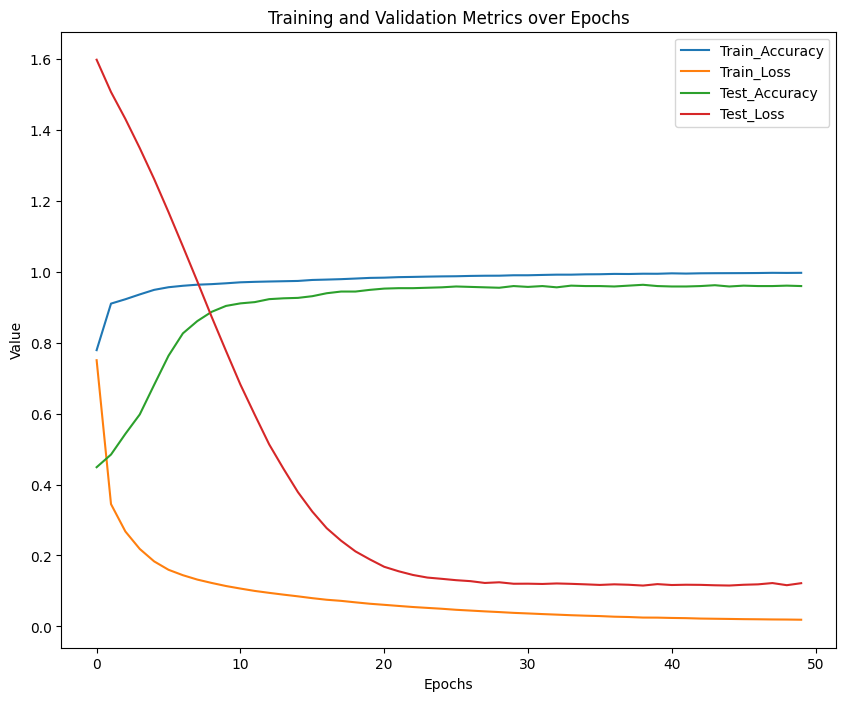

In [ ]:
# Aligning lengths of metrics across folds (if needed)
max_epochs = max([len(fold) for fold in fold_train_accuracies])
for i in range(len(fold_train_accuracies)):
    fold_train_accuracies[i] += [fold_train_accuracies[i][-1]] * (max_epochs - len(fold_train_accuracies[i]))
    fold_val_accuracies[i] += [fold_val_accuracies[i][-1]] * (max_epochs - len(fold_val_accuracies[i]))
    fold_train_losses[i] += [fold_train_losses[i][-1]] * (max_epochs - len(fold_train_losses[i]))
    fold_val_losses[i] += [fold_val_losses[i][-1]] * (max_epochs - len(fold_val_losses[i]))

# Calculate the mean of all metrics across folds
mean_train_accuracy = np.mean(fold_train_accuracies, axis=0)
mean_val_accuracy = np.mean(fold_val_accuracies, axis=0)
mean_train_loss = np.mean(fold_train_losses, axis=0)
mean_val_loss = np.mean(fold_val_losses, axis=0)

# Create a DataFrame for easy plotting
history = pd.DataFrame({
    'Train_Accuracy': mean_train_accuracy,
    'Train_Loss': mean_train_loss,
    'Test_Accuracy': mean_val_accuracy,
    'Test_Loss': mean_val_loss
})

# Plot the results
plt.figure(figsize=(10, 8))
plt.plot(range(len(history['Train_Accuracy'])), history['Train_Accuracy'], label='Train_Accuracy')
plt.plot(range(len(history['Train_Loss'])), history['Train_Loss'], label='Train_Loss')
plt.plot(range(len(history['Test_Accuracy'])), history['Test_Accuracy'], label='Test_Accuracy')
plt.plot(range(len(history['Test_Loss'])), history['Test_Loss'], label='Test_Loss')

plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.title('Training and Validation Metrics over Epochs')
plt.show()

##### Final Model

In [ ]:
%%time
stop = EarlyStopping(
    monitor='val_loss',
    patience=10
)
# Buat ulang model
# Extract input dimensions
seq_length = X_train.shape[1]
n_features = X_train.shape[2]

# Define the CNN model
cnn_final_model = Sequential([
    Input(shape=(seq_length, n_features)),
    Conv1D(filters=conv_filters, kernel_size=conv_kernel_size, activation='relu', kernel_initializer=kernel_initializer),
    Flatten(),
    Dense(units=dense_units, kernel_initializer=kernel_initializer),
    BatchNormalization(),
    ReLU(),
    Dense(units=N_CLASSES, activation='softmax', kernel_initializer=kernel_initializer)  # Output layer for classification
])

# Compile the model
cnn_final_model.compile(
    optimizer=Adam(),
    loss=CategoricalCrossentropy(),
    metrics=['accuracy']
)

# Train the model with early stopping
result = cnn_final_model.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=n_epochs,
    validation_data=(X_test, y_test),
    callbacks=[stop],
    verbose=1
)

cnn_final_model.save(MODEL_CNN1D_PATH)

Epoch 1/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - accuracy: 0.6476 - loss: 1.0315 - val_accuracy: 0.4528 - val_loss: 1.5812
Epoch 2/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9087 - loss: 0.3559 - val_accuracy: 0.5417 - val_loss: 1.4688
Epoch 3/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9128 - loss: 0.2734 - val_accuracy: 0.5861 - val_loss: 1.3599
Epoch 4/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9124 - loss: 0.2461 - val_accuracy: 0.6389 - val_loss: 1.2470
Epoch 5/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9129 - loss: 0.2282 - val_accuracy: 0.7333 - val_loss: 1.1405
Epoch 6/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9369 - loss: 0.1884 - val_accuracy: 0.7889 - val_loss: 1.0351
Epoch 7/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.9542 - loss: 0.1609 - val_accuracy: 0.8472 - val_loss: 0.9212
Epoch 8/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.9556 - loss: 0.1523 - val_accuracy: 0.8722 - val_los

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9956 - loss: 0.0174 
Loss pada data train: 0.0212
Accuracy pada data train: 0.9952
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


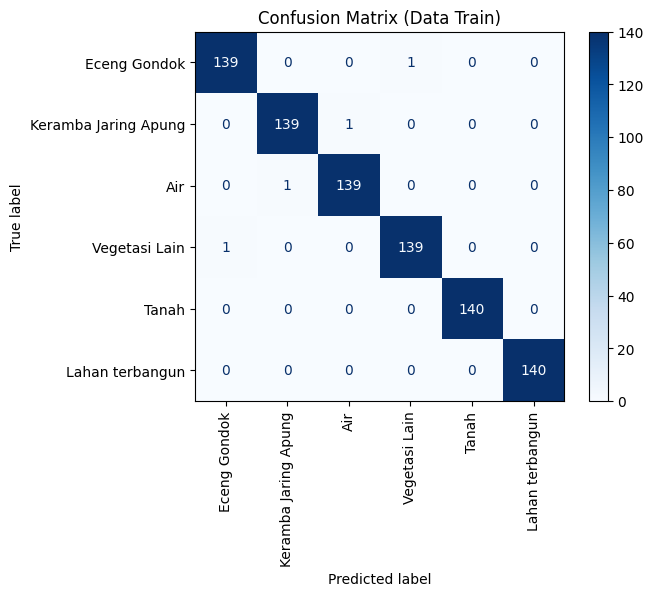


Classification Report (Data Train):
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       140
           1       0.99      0.99      0.99       140
           2       0.99      0.99      0.99       140
           3       0.99      0.99      0.99       140
           4       1.00      1.00      1.00       140
           5       1.00      1.00      1.00       140

    accuracy                           1.00       840
   macro avg       1.00      1.00      1.00       840
weighted avg       1.00      1.00      1.00       840

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9580 - loss: 0.0788 

Loss pada data test: 0.0742
Accuracy pada data test: 0.9694
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


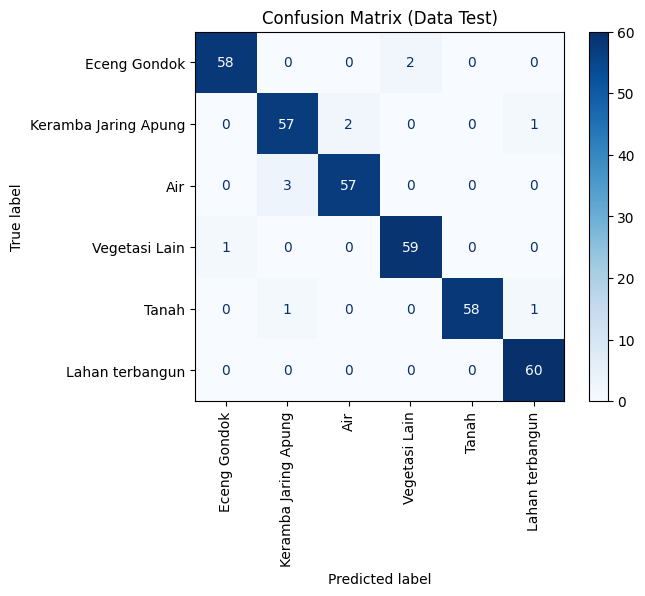


Classification Report (Data Test):
              precision    recall  f1-score   support

           0       0.98      0.97      0.97        60
           1       0.93      0.95      0.94        60
           2       0.97      0.95      0.96        60
           3       0.97      0.98      0.98        60
           4       1.00      0.97      0.98        60
           5       0.97      1.00      0.98        60

    accuracy                           0.97       360
   macro avg       0.97      0.97      0.97       360
weighted avg       0.97      0.97      0.97       360



In [ ]:
# Evaluasi model pada data train
train_loss, train_accuracy = cnn_final_model.evaluate(X_train, y_train, verbose=1)
print(f"Loss pada data train: {train_loss:.4f}")
print(f"Accuracy pada data train: {train_accuracy:.4f}")

# Prediksi pada data train
train_predictions = cnn_final_model.predict(X_train)
train_predictions_classes = train_predictions.argmax(axis=1)  # Konversi probabilitas ke kelas
train_true_classes = y_train.argmax(axis=1)  # Konversi one-hot encoding ke kelas asli

# Hitung confusion matrix pada data train
train_cm = confusion_matrix(train_true_classes, train_predictions_classes)

# Tampilkan confusion matrix untuk data train
disp_train = ConfusionMatrixDisplay(train_cm, display_labels=CLASSES)
disp_train.plot(cmap='Blues')
plt.xticks(rotation=90)
plt.title("Confusion Matrix (Data Train)")
plt.show()

# Tampilkan classification report untuk data train
print("\nClassification Report (Data Train):")
print(classification_report(train_true_classes, train_predictions_classes))

# Evaluasi model pada data test
test_loss, test_accuracy = cnn_final_model.evaluate(X_test, y_test, verbose=1)
print(f"\nLoss pada data test: {test_loss:.4f}")
print(f"Accuracy pada data test: {test_accuracy:.4f}")

# Prediksi pada data test
test_predictions = cnn_final_model.predict(X_test)
test_predictions_classes = test_predictions.argmax(axis=1)  # Konversi probabilitas ke kelas
test_true_classes = y_test.argmax(axis=1)  # Konversi one-hot encoding ke kelas asli

# Hitung confusion matrix pada data test
test_cm = confusion_matrix(test_true_classes, test_predictions_classes)

# Tampilkan confusion matrix untuk data test
disp_test = ConfusionMatrixDisplay(test_cm, display_labels=CLASSES)
disp_test.plot(cmap='Blues')
plt.xticks(rotation=90)
plt.title("Confusion Matrix (Data Test)")
plt.savefig(f"{BASE_PATH}/Confusion_Matrix_Test_CNN_AGS.svg", format="svg", bbox_inches='tight')
plt.show()

# Tampilkan classification report untuk data test
print("\nClassification Report (Data Test):")
print(classification_report(test_true_classes, test_predictions_classes))

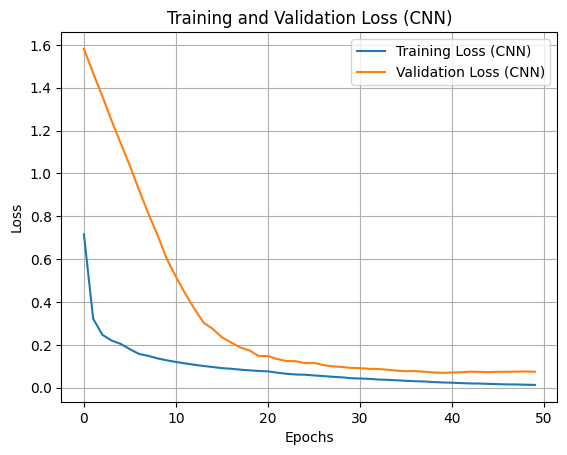

In [ ]:
# Plot training dan validation loss untuk CNN
plt.plot(result.history['loss'], label='Training Loss (CNN)')
plt.plot(result.history['val_loss'], label='Validation Loss (CNN)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (CNN)')
plt.legend()
plt.grid()
plt.savefig(f"{BASE_PATH}/Loss_Curve_CNN_AGS.svg", format="svg", bbox_inches='tight')
plt.show()

In [ ]:
print(cnn_final_model.summary())

Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_65 (Conv1D)              │ (None, 11, 128)        │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_65 (Flatten)            │ (None, 1408)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 64)             │        90,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_65          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_65 (ReLU)                 │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 6)              │           390 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 273,748 (1.04 MB)

 Trainable params: 91,206 (356.27 KB)

 Non-trainable params: 128 (512.00 B)

 Optimizer params: 182,414 (712.56 KB)

None


#### Random Forest

In [ ]:
# Hyperparameters for Random Forest
n_estimators = 50    # def 100
max_depth = 17       # def None
min_samples_split = 4  # def 2
min_samples_leaf = 2   # def 1
max_features = None   # def 'sqrt'
max_leaf_nodes = 40   # def None
max_samples = None    # def None

In [ ]:
# Preprocess data
X_train, X_test, y_train, y_test, scaler, normalizer = preprocess_data(
    data=data,
    selected_bands=SELECTED_BANDS,
    label_column=LABEL,
    n_classes=N_CLASSES,
    model_type='rf'
)

Data training features (rf): (840, 13)
Data test features (rf): (360, 13)
Data training label: (840,)
Data test label: (360,)


##### Cross-Val

In [ ]:
%%time
# Perform Random Forest Cross-Validation
combined_cm = np.zeros((N_CLASSES, N_CLASSES))  # Initialize confusion matrix
kfold = StratifiedKFold(n_splits=n_fold, shuffle=True, random_state=222111840)  # 5-fold cross-validation

fold_train_accuracies = []
fold_val_accuracies = []
all_predictions = []
all_labels = []

rf_best_model = None
best_val_accuracy = 0

# Loop for each fold
for train_idx, val_idx in kfold.split(X_train, y_train):
    train_input, val_input = X_train[train_idx], X_train[val_idx]
    train_output, val_output = y_train[train_idx], y_train[val_idx]

    # Create Random Forest model for each fold
    model = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        max_features=max_features,
        max_leaf_nodes=max_leaf_nodes,
        max_samples=max_samples,
        random_state=222111840
    )

    # Train the model
    model.fit(train_input, train_output)

    # Predictions on validation data
    predictions = model.predict(val_input)
    true_classes = val_output

    # Calculate accuracy for this fold
    fold_val_accuracy = np.mean(predictions == true_classes)
    fold_train_accuracy = model.score(train_input, train_output)

    # Calculate confusion matrix for this fold
    cm = confusion_matrix(true_classes, predictions)
    combined_cm += cm  # Add to the combined confusion matrix

    # Store results
    all_predictions.extend(predictions)
    all_labels.extend(true_classes)
    fold_train_accuracies.append(fold_train_accuracy)
    fold_val_accuracies.append(fold_val_accuracy)

    # Update the best model based on validation accuracy
    if fold_val_accuracy > best_val_accuracy:
        best_val_accuracy = fold_val_accuracy
        rf_best_model = model

# Calculate mean accuracies
mean_train_accuracy = np.mean(fold_train_accuracies)
mean_val_accuracy = np.mean(fold_val_accuracies)


CPU times: user 3.09 s, sys: 5.27 ms, total: 3.1 s
Wall time: 3.1 s


Accuracy per Fold:
   Train_Accuracy  Test_Accuracy
0        0.994709       0.892857
1        0.986772       0.952381
2        0.990741       0.928571
3        0.989418       0.952381
4        0.992063       0.964286
5        0.986772       0.928571
6        0.990741       0.916667
7        0.989418       0.904762
8        0.985450       0.916667
9        0.986772       0.940476


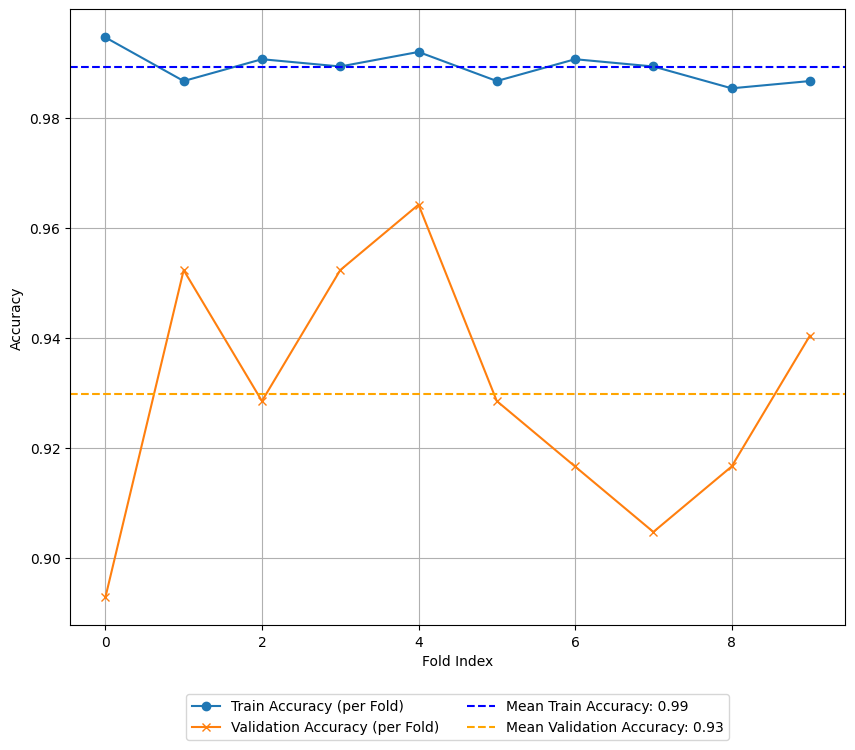

Mean Accuracy per Fold:
   Train_Accuracy_Mean  Test_Accuracy_Mean
0             0.989286            0.929762
Training Accuracy: 0.9893


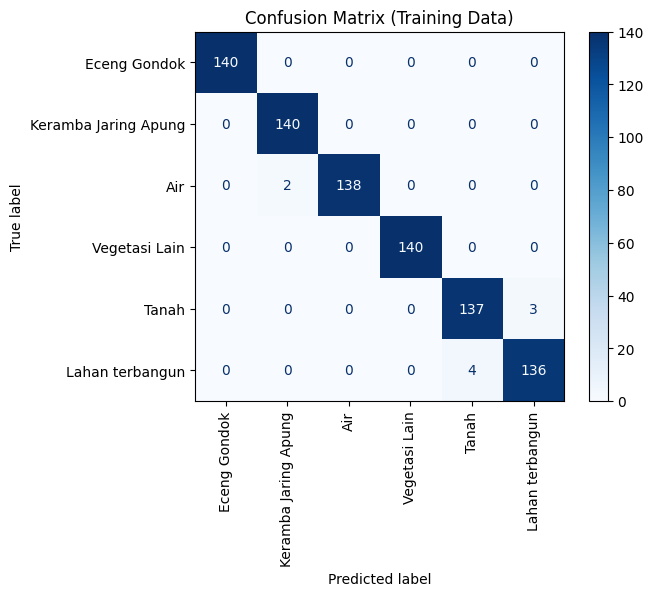


Classification Report (Training Data):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       140
           1       0.99      1.00      0.99       140
           2       1.00      0.99      0.99       140
           3       1.00      1.00      1.00       140
           4       0.97      0.98      0.98       140
           5       0.98      0.97      0.97       140

    accuracy                           0.99       840
   macro avg       0.99      0.99      0.99       840
weighted avg       0.99      0.99      0.99       840

Test Accuracy: 0.9278


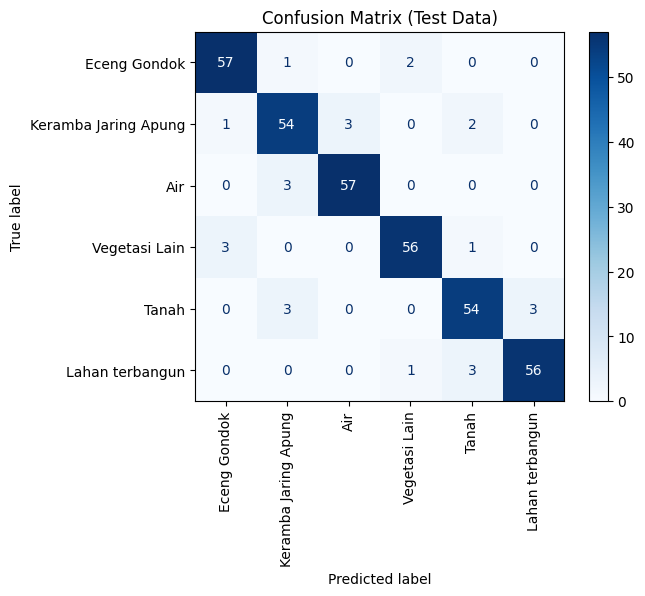


Classification Report (Test Data):
              precision    recall  f1-score   support

           0       0.93      0.95      0.94        60
           1       0.89      0.90      0.89        60
           2       0.95      0.95      0.95        60
           3       0.95      0.93      0.94        60
           4       0.90      0.90      0.90        60
           5       0.95      0.93      0.94        60

    accuracy                           0.93       360
   macro avg       0.93      0.93      0.93       360
weighted avg       0.93      0.93      0.93       360

   Feature  Importance
10     B12    0.296326
6       B4    0.206883
3     NBAI    0.171117
8       B8    0.106591
0      FAI    0.098294
7       B5    0.035473
11      VV    0.024922
5       B3    0.018337
12      VH    0.012295
2      BSI    0.009853
1    MNDWI    0.007245
4       B2    0.006652
9      B11    0.006011


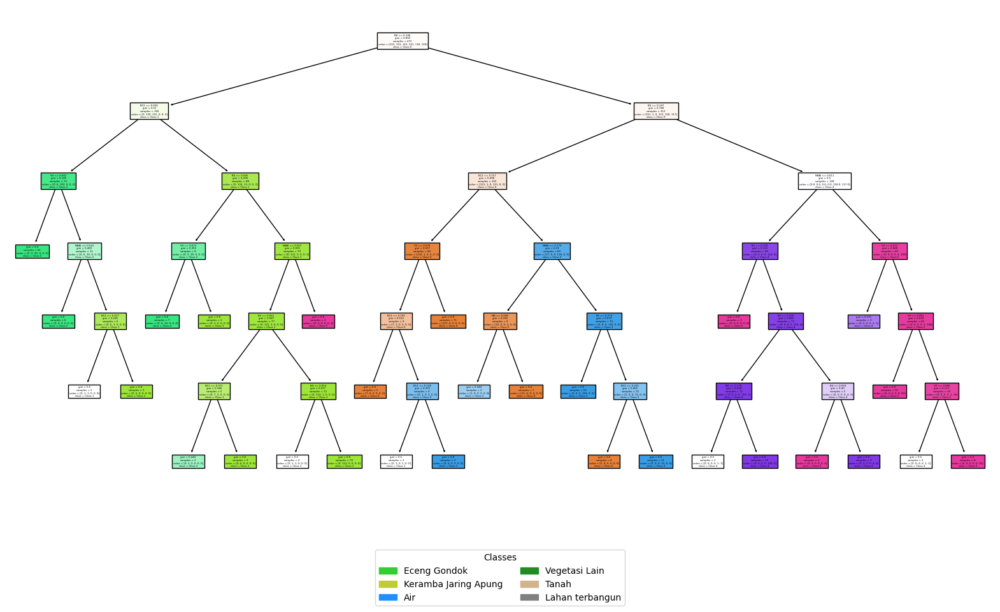

In [ ]:
# Plotting Random Forest Cross-Validation Accuracy
history = pd.DataFrame({
    'Train_Accuracy': fold_train_accuracies,  # Training accuracy per fold
    'Test_Accuracy': fold_val_accuracies  # Validation accuracy per fold
})

history_mean = pd.DataFrame({
    'Train_Accuracy_Mean': [mean_train_accuracy],
    'Test_Accuracy_Mean': [mean_val_accuracy]
})

# Display accuracy per fold
print("Accuracy per Fold:")
print(history)

# Plot the accuracy results per fold
plt.figure(figsize=(10, 8))
plt.plot(range(len(fold_train_accuracies)), fold_train_accuracies, label='Train Accuracy (per Fold)', marker='o')
plt.plot(range(len(fold_val_accuracies)), fold_val_accuracies, label='Validation Accuracy (per Fold)', marker='x')
plt.axhline(mean_train_accuracy, color='blue', linestyle='--', label=f'Mean Train Accuracy: {mean_train_accuracy:.2f}')
plt.axhline(mean_val_accuracy, color='orange', linestyle='--', label=f'Mean Validation Accuracy: {mean_val_accuracy:.2f}')
plt.xlabel('Fold Index')
plt.ylabel('Accuracy')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=2)
plt.grid(True)
plt.show()

# Display the mean accuracy results
print("Mean Accuracy per Fold:")
print(history_mean)

# Evaluate the final Random Forest model on training and testing data
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import ConfusionMatrixDisplay

# Training evaluation
train_predictions = rf_best_model.predict(X_train)
train_accuracy = accuracy_score(y_train, train_predictions)
print(f"Training Accuracy: {train_accuracy:.4f}")

train_cm = confusion_matrix(y_train, train_predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=train_cm, display_labels=CLASSES)
disp.plot(cmap='Blues')
plt.xticks(rotation=90)
plt.title("Confusion Matrix (Training Data)")
plt.show()

print("\nClassification Report (Training Data):")
print(classification_report(y_train, train_predictions))

# Testing evaluation
test_predictions = rf_best_model.predict(X_test)
test_accuracy = accuracy_score(y_test, test_predictions)
print(f"Test Accuracy: {test_accuracy:.4f}")

test_cm = confusion_matrix(y_test, test_predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=test_cm, display_labels=CLASSES)
disp.plot(cmap='Blues')
plt.xticks(rotation=90)
plt.title("Confusion Matrix (Test Data)")
plt.show()

print("\nClassification Report (Test Data):")
print(classification_report(y_test, test_predictions))

# Evaluate feature importance and plot one of the trees
import matplotlib.patches as mpatches
from sklearn.tree import plot_tree

feature_importance = rf_best_model.feature_importances_
importance_df = pd.DataFrame({
    'Feature': SELECTED_BANDS,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

print(importance_df)

plt.figure(figsize=(20, 10))
plot_tree(
    rf_best_model.estimators_[0],  # Plot the first tree in the forest
    feature_names=SELECTED_BANDS,
    class_names=[f"Class {i}" for i in range(N_CLASSES)],
    filled=True
)

# Create a legend for the class colors
class_colors = PALETTE
patches = [mpatches.Patch(color=color, label=label) for color, label in zip(class_colors, CLASSES)]

# Add legend
plt.legend(handles=patches, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=2, title="Classes")

plt.show()


##### Final Model

In [ ]:
%%time
# Buat ulang model Random Forest
rf_final_model = RandomForestClassifier(
    n_estimators=n_estimators,
    max_depth=max_depth,
    min_samples_split=min_samples_split,
    min_samples_leaf=min_samples_leaf,
    max_leaf_nodes=max_leaf_nodes,
    random_state=seed
)

# Latih model Random Forest pada data training
rf_final_model.fit(X_train, y_train)

# Simpan model
dump(rf_final_model, MODEL_RF_PATH)

CPU times: user 166 ms, sys: 3.92 ms, total: 169 ms
Wall time: 182 ms


['/content/drive/MyDrive/GEE_Exports/model_rf_ags.joblib']

Training Accuracy: 0.9893


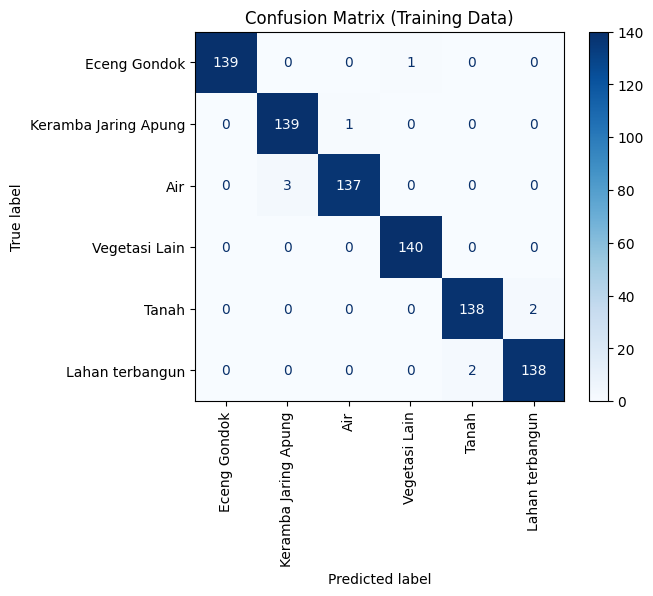


Classification Report (Training Data):
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       140
           1       0.98      0.99      0.99       140
           2       0.99      0.98      0.99       140
           3       0.99      1.00      1.00       140
           4       0.99      0.99      0.99       140
           5       0.99      0.99      0.99       140

    accuracy                           0.99       840
   macro avg       0.99      0.99      0.99       840
weighted avg       0.99      0.99      0.99       840

Test Accuracy: 0.9444


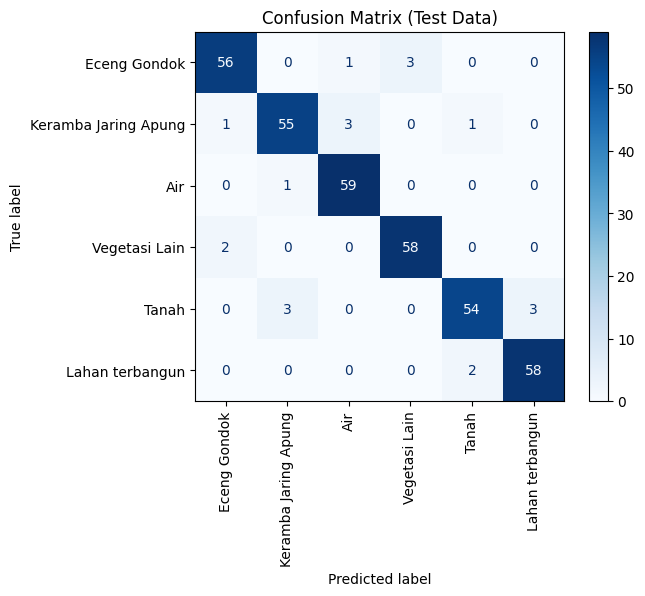


Classification Report (Test Data):
              precision    recall  f1-score   support

           0       0.95      0.93      0.94        60
           1       0.93      0.92      0.92        60
           2       0.94      0.98      0.96        60
           3       0.95      0.97      0.96        60
           4       0.95      0.90      0.92        60
           5       0.95      0.97      0.96        60

    accuracy                           0.94       360
   macro avg       0.94      0.94      0.94       360
weighted avg       0.94      0.94      0.94       360

   Feature  Importance
3     NBAI    0.142594
10     B12    0.134858
7       B5    0.099841
9      B11    0.097449
0      FAI    0.091910
6       B4    0.083142
8       B8    0.082554
1    MNDWI    0.062786
2      BSI    0.051291
5       B3    0.048189
4       B2    0.047756
11      VV    0.034293
12      VH    0.023337


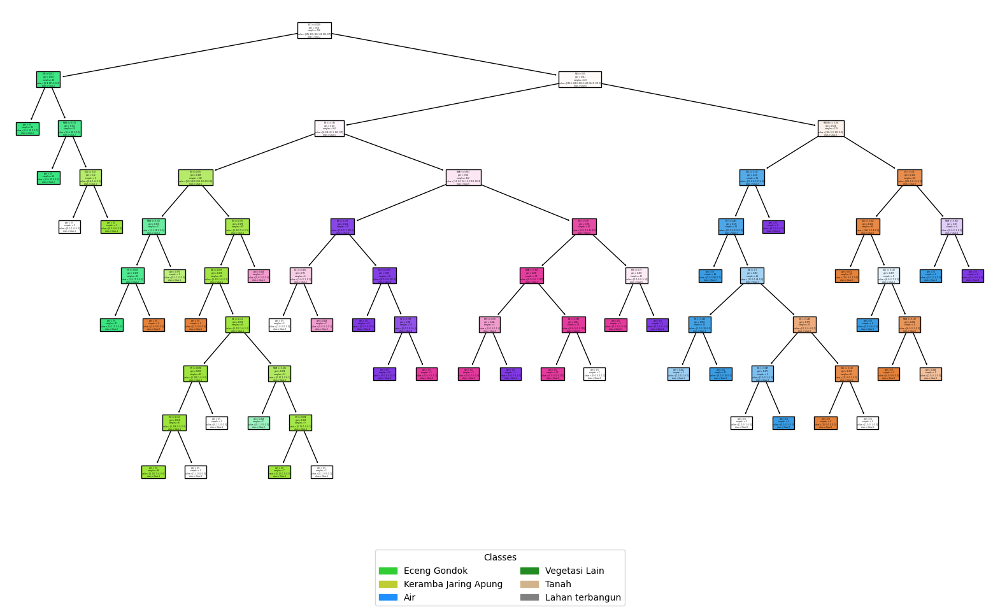

Rata-rata Kedalaman Pohon (Depth): 8.62
Max Kedalaman Pohon (Depth): 12
Min Kedalaman Pohon (Depth): 7
Rata-rata Jumlah Leaf Node: 39.88
Max Jumlah Leaf Node: 40
Min Jumlah Leaf Node: 36


In [ ]:
# Evaluate model on training data
train_predictions = rf_final_model.predict(X_train)
train_accuracy = accuracy_score(y_train, train_predictions)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Confusion matrix for training data
train_cm = confusion_matrix(y_train, train_predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=train_cm, display_labels=CLASSES)
disp.plot(cmap='Blues')
plt.xticks(rotation=90)
plt.title("Confusion Matrix (Training Data)")
plt.show()

print("\nClassification Report (Training Data):")
print(classification_report(y_train, train_predictions))

# Evaluate model on test data
test_predictions = rf_final_model.predict(X_test)
test_accuracy = accuracy_score(y_test, test_predictions)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Confusion matrix for test data
test_cm = confusion_matrix(y_test, test_predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=test_cm, display_labels=CLASSES)
disp.plot(cmap='Blues')
plt.xticks(rotation=90)
plt.title("Confusion Matrix (Test Data)")
plt.savefig(f"{BASE_PATH}/Confusion_Matrix_Test_RF_AGS.svg", format="svg", bbox_inches='tight')
plt.show()

print("\nClassification Report (Test Data):")
print(classification_report(y_test, test_predictions))

feature_importance = rf_final_model.feature_importances_
importance_df = pd.DataFrame({
    'Feature': SELECTED_BANDS,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

print(importance_df)

plt.figure(figsize=(20, 10))
plot_tree(
    rf_final_model.estimators_[0],  # Plot the first tree in the forest
    feature_names=SELECTED_BANDS,
    class_names=[f"Class {i}" for i in range(N_CLASSES)],
    filled=True
)

# Create a legend for the class colors
class_colors = PALETTE
patches = [mpatches.Patch(color=color, label=label) for color, label in zip(class_colors, CLASSES)]

# Add legend
plt.legend(handles=patches, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=2, title="Classes")
plt.show()

# Inisialisasi variabel untuk kedalaman dan leaf node
depths = []
leaf_nodes = []

# Loop melalui setiap pohon dalam hutan
for tree in rf_final_model.estimators_:
    depths.append(tree.tree_.max_depth)  # Tambahkan kedalaman ke daftar
    leaf_nodes.append(tree.tree_.n_leaves)  # Tambahkan jumlah leaf node ke daftar

# Hitung rata-rata, maksimum, dan minimum untuk kedalaman
average_depth = sum(depths) / len(depths)
max_depth = max(depths)
min_depth = min(depths)

# Hitung rata-rata, maksimum, dan minimum untuk leaf node
average_leaf_nodes = sum(leaf_nodes) / len(leaf_nodes)
max_leaf_nodes = max(leaf_nodes)
min_leaf_nodes = min(leaf_nodes)

# Cetak hasil
print(f"Rata-rata Kedalaman Pohon (Depth): {average_depth:.2f}")
print(f"Max Kedalaman Pohon (Depth): {max_depth}")
print(f"Min Kedalaman Pohon (Depth): {min_depth}")
print(f"Rata-rata Jumlah Leaf Node: {average_leaf_nodes:.2f}")
print(f"Max Jumlah Leaf Node: {max_leaf_nodes}")
print(f"Min Jumlah Leaf Node: {min_leaf_nodes}")


#### Permutation Feature Importance

Cara Membaca Plot per Kelas 📊
Mari kita ambil contoh plot untuk kelas 'Air'.

1. Bar Panjang & Positif (Contoh: MNDWI mungkin memiliki nilai 0.40)

Artinya: "Ketika data fitur MNDWI diacak, kemampuan model untuk mengenali 'Air' (Recall) turun sebesar 40%."

Interpretasi: Fitur MNDWI sangat krusial bagi model untuk bisa mengidentifikasi 'Air'. Model sangat bergantung pada fitur ini. Ini sesuai dengan teori, karena MNDWI (Modified Normalized Difference Water Index) memang dirancang untuk mendeteksi air.

2. Bar Pendek & Positif (Contoh: B11 mungkin memiliki nilai 0.02)

Artinya: "Ketika data fitur B11 diacak, Recall untuk kelas 'Air' hanya turun sebesar 2%."

Interpretasi: Fitur B11 memiliki sedikit kontribusi, tapi tidak signifikan. Model menggunakannya, tapi tidak terlalu bergantung padanya untuk mengenali 'Air'.

3. Bar Sangat Pendek atau Nol (Contoh: BSI mungkin memiliki nilai 0.001)

Artinya: "Mengacak fitur BSI hampir tidak mengubah kemampuan model untuk mengenali 'Air'."

Interpretasi: Fitur BSI (Bare Soil Index) tidak penting untuk kelas 'Air'. Ini masuk akal karena tanah kosong dan air adalah dua hal yang sangat berbeda.

4. Bar Negatif (Contoh: Tanah mungkin memiliki nilai -0.01)

Artinya: "Anehnya, setelah fitur 'Tanah' diacak, kemampuan model mengenali 'Air' justru sedikit meningkat sebesar 1%."

Interpretasi: Ini adalah kasus yang menarik. Artinya, fitur tersebut mungkin mengandung noise atau pola yang sedikit menyesatkan model. Dengan mengacaknya, model tidak lagi terkecoh. Secara praktis, ini sama dengan menganggap fitur tersebut tidak penting atau bahkan mengganggu.

#### Viz Hasil

In [ ]:
# Load and process bands
image_bands, (height, width, crs, transform) = load_and_process_bands(IMAGE_PATH, SELECTED_BANDS)

# Create mask
mask = create_mask(IMAGE_PATH, mapping(rawa_pening_gdf.geometry[0]))

# Create a 2x2 grid for visualization
norm = plt.Normalize(vmin=0, vmax=len(PALETTE)-1)  # Normalize for consistent color range

# Preprocess image data for CNN
image_input_cnn = preprocess_image_input(image_bands.transpose(1, 2, 0), scaler, normalizer, model_type="cnn")

# Predict and visualize CNN Final Model
cnn_final_prediction = predict_and_mask(
    model=cnn_final_model,
    image_input=image_input_cnn,
    mask=mask,
    model_type="cnn",
    height=height,
    width=width,
    crs=crs,
    transform=transform,
    output_path=OUTPUT_PATH_CNN1D
)

# Preprocess image data for RF
image_input_rf = preprocess_image_input(image_bands.transpose(1, 2, 0), scaler, normalizer, model_type="rf")

# Predict and visualize RF Final Model
rf_final_prediction = predict_and_mask(
    model=rf_final_model,
    image_input=image_input_rf,
    mask=mask,
    model_type="rf",
    height=height,
    width=width,
    crs=crs,
    transform=transform,
    output_path=OUTPUT_PATH_RF
)

# Calculate and print area for each prediction
print_area_per_model(cnn_final_prediction, "CNN Final Model")
print_area_per_model(rf_final_prediction, "RF Final Model")

  35/5805 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step   

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


5805/5805 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(



Hasil untuk CNN Final Model:
Kelas 0:
  Luas dalam piksel: 34175 piksel
  Luas dalam m²: 3417500.00 m²
  Luas dalam hektar: 341.7500 ha
Kelas 1:
  Luas dalam piksel: 12563 piksel
  Luas dalam m²: 1256300.00 m²
  Luas dalam hektar: 125.6300 ha
Kelas 2:
  Luas dalam piksel: 103863 piksel
  Luas dalam m²: 10386300.00 m²
  Luas dalam hektar: 1038.6300 ha
Kelas 3:
  Luas dalam piksel: 4852 piksel
  Luas dalam m²: 485200.00 m²
  Luas dalam hektar: 48.5200 ha
Kelas 4:
  Luas dalam piksel: 1935 piksel
  Luas dalam m²: 193500.00 m²
  Luas dalam hektar: 19.3500 ha
Kelas 5:
  Luas dalam piksel: 889 piksel
  Luas dalam m²: 88900.00 m²
  Luas dalam hektar: 8.8900 ha

Hasil untuk RF Final Model:
Kelas 0:
  Luas dalam piksel: 33721 piksel
  Luas dalam m²: 3372100.00 m²
  Luas dalam hektar: 337.2100 ha
Kelas 1:
  Luas dalam piksel: 11351 piksel
  Luas dalam m²: 1135100.00 m²
  Luas dalam hektar: 113.5100 ha
Kelas 2:
  Luas dalam piksel: 104225 piksel
  Luas dalam m²: 10422500.00 m²
  Luas dalam hekta

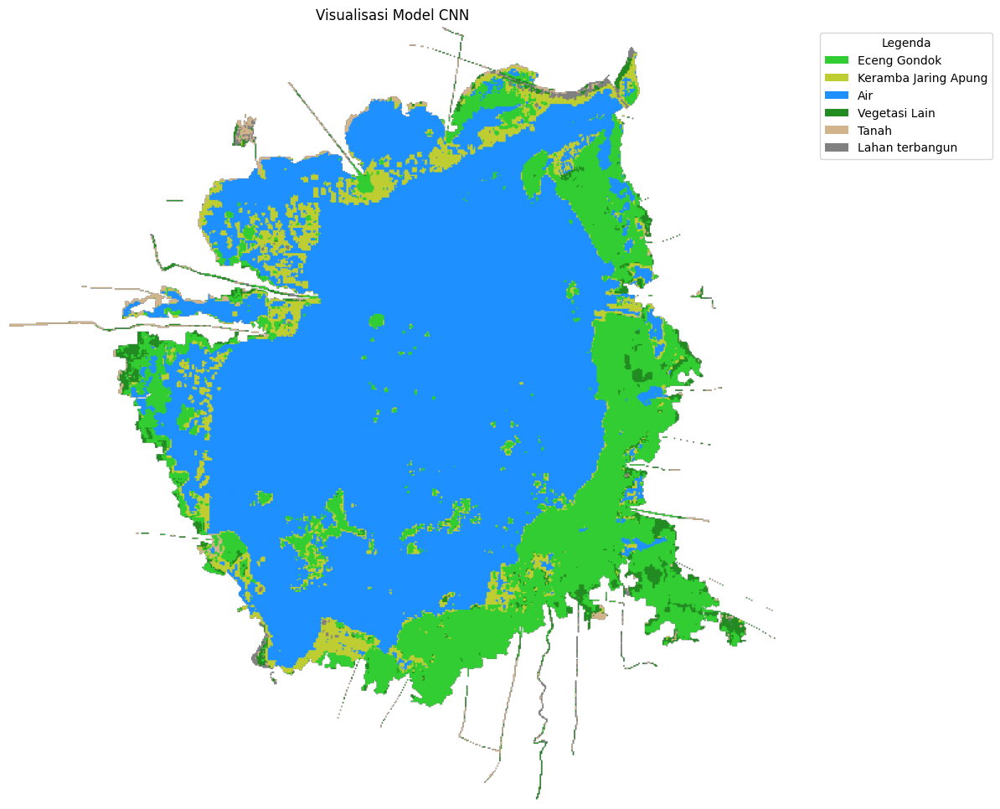

In [ ]:
# Plot CNN Final Model
fig, ax = plt.subplots(figsize=(12, 12))
im = ax.imshow(cnn_final_prediction, cmap=ListedColormap(PALETTE), norm=norm)
ax.set_title("Visualisasi Model CNN")
ax.axis('off')
# Membuat legenda manual
legend_elements = [Patch(facecolor=color, label=label) for color, label in zip(PALETTE, CLASSES)]
ax.legend(
    handles=legend_elements,
    loc='upper left',
    bbox_to_anchor=(1.05, 1),  # Menempatkan legenda di luar gambar
    title="Legenda"
)
plt.savefig(f"{BASE_PATH}/VIZ_CNN_AGS.svg", format="svg", bbox_inches='tight')
plt.show()

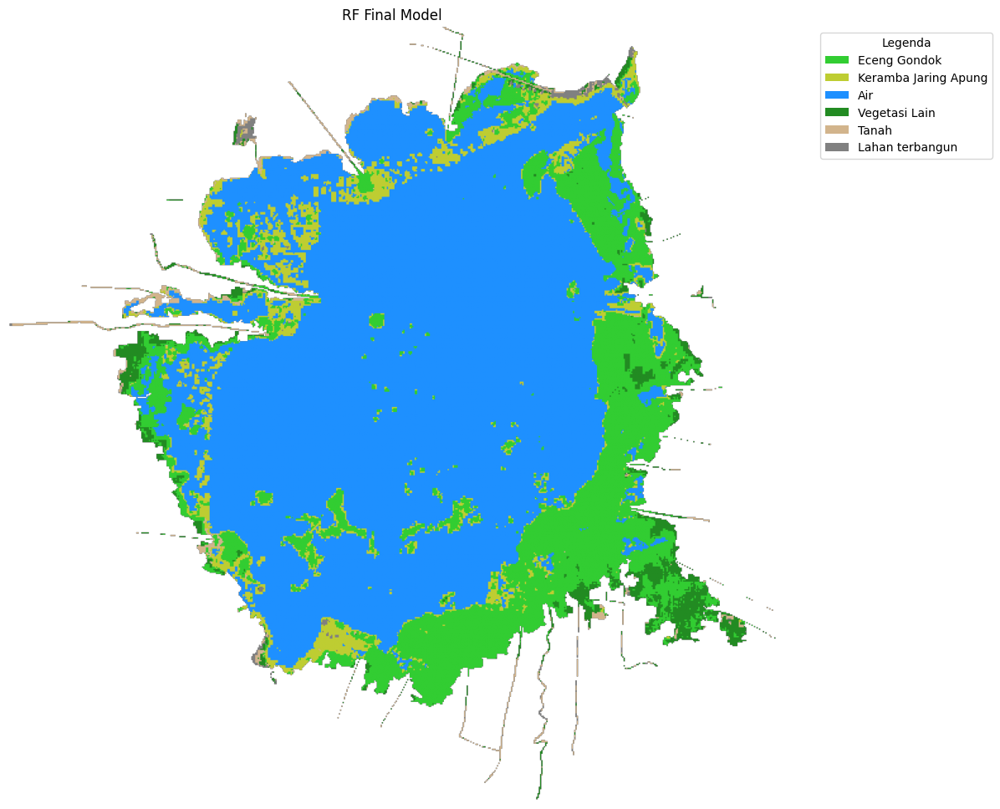

In [ ]:
fig, ax = plt.subplots(figsize=(12, 12))
im = ax.imshow(rf_final_prediction, cmap=ListedColormap(PALETTE), norm=norm)
ax.set_title("RF Final Model")
ax.axis('off')

# Membuat legenda manual
legend_elements = [Patch(facecolor=color, label=label) for color, label in zip(PALETTE, CLASSES)]
ax.legend(
    handles=legend_elements,
    loc='upper left',
    bbox_to_anchor=(1.05, 1),  # Menempatkan legenda di luar gambar
    title="Legenda"
)
plt.savefig(f"{BASE_PATH}/VIZ_RF_AGS.svg", format="svg", bbox_inches='tight')
plt.tight_layout()
plt.show()

# HYPERPARAMETER TUNING

jalankan blok kode Prep terlebih dahulu

In [ ]:
def tune_model_search(model, param_grid, X_train, y_train, X_test, y_test, cv=5, search_type='grid', n_iter=50, random_state=222111840):
    """
    Fungsi untuk melakukan pencarian hyperparameter menggunakan Grid Search atau Randomized Search.

    Args:
        model: Estimator model (misalnya, KerasClassifier, RandomForestClassifier, dll.).
        param_grid (dict): Parameter grid untuk pencarian.
        X_train (array-like): Data pelatihan.
        y_train (array-like): Label pelatihan.
        X_test (array-like): Data uji.
        y_test (array-like): Label uji.
        cv (int, default=5): Jumlah fold dalam cross-validation.
        search_type (str, default='grid'): Jenis pencarian ('grid' atau 'random').
        n_iter (int, default=50): Jumlah iterasi untuk Randomized Search.
        random_state (int, default=42): Nilai random state untuk memastikan reprodusibilitas.

    Returns:
        None
    """
    # Pilih pencarian sesuai dengan parameter 'search_type'
    if search_type == 'grid':
        search = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=cv, verbose=1, error_score='raise')
    elif search_type == 'random':
        search = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=n_iter, n_jobs=-1, cv=cv,
                                    verbose=1, random_state=random_state, error_score='raise')
    else:
        raise ValueError("search_type harus 'grid' atau 'random'")

    # Fit model
    search_result = search.fit(X_train, y_train)

    # Menampilkan hasil terbaik
    print(f"Best Score: {search_result.best_score_}")
    print(f"Best Parameters: {search_result.best_params_}")

    # Extract and display mean and standard deviation for each parameter combination
    cv_results = search_result.cv_results_
    for mean_score, std_score, params in zip(cv_results['mean_test_score'], cv_results['std_test_score'], cv_results['params']):
        print(f"Mean Score: {mean_score:.4f}, Std Dev: {std_score:.4f} for Parameters: {params}")

    # Ambil model terbaik dari pencarian
    best_model = search_result.best_estimator_

    # Evaluasi model pada data test
    if hasattr(best_model, "model_"):
        # For KerasClassifier
        test_loss, test_accuracy = best_model.model_.evaluate(X_test, y_test, verbose=1)
        print(f"\nTest Loss: {test_loss}")
        print(f"Test Accuracy: {test_accuracy}")
    else:
        # For other models like RandomForestClassifier
        y_pred = best_model.predict(X_test)
        if len(y_test.shape) > 1:  # If y_test is one-hot encoded
            y_true = y_test.argmax(axis=1)
        else:
            y_true = y_test
        print("\nClassification Report:")
        print(classification_report(y_true, y_pred))

        conf_matrix = confusion_matrix(y_true, y_pred)
        ConfusionMatrixDisplay(conf_matrix).plot()
        plt.title("Confusion Matrix")
        plt.show()

## COMBINED MODEL V2

In [ ]:
# SELECTED_BANDS = SELECTED_BANDS_FIX
SELECTED_BANDS = ['FAI', 'MNDWI', 'BSI', 'NBAI', 'B2', 'B3', 'B4', 'B5', 'B8', 'B11', 'B12', 'VV', 'VH']
SELECTED_BANDS

['FAI',
 'MNDWI',
 'BSI',
 'NBAI',
 'B2',
 'B3',
 'B4',
 'B5',
 'B8',
 'B11',
 'B12',
 'VV',
 'VH']

### CNN1D

In [ ]:
# Preprocessing data for Juni
X_train_jun, X_test_jun, y_train_jun, y_test_jun, scaler_jun, normalizer_jun = preprocess_data(
    data=data_jun,
    selected_bands=SELECTED_BANDS,
    label_column=LABEL,
    n_classes=N_CLASSES,
    model_type='cnn1d'
)

# Preprocessing data for Juli
X_train_jul, X_test_jul, y_train_jul, y_test_jul, scaler_jul, normalizer_jul = preprocess_data(
    data=data_jul,
    selected_bands=SELECTED_BANDS,
    label_column=LABEL,
    n_classes=N_CLASSES,
    model_type='cnn1d'
)

# Preprocessing data for Agustus
X_train_ags, X_test_ags, y_train_ags, y_test_ags, scaler_ags, normalizer_ags = preprocess_data(
    data=data_ags,
    selected_bands=SELECTED_BANDS,
    label_column=LABEL,
    n_classes=N_CLASSES,
    model_type='cnn1d'
)

Data training features (cnn1d): (842, 13, 1)
Data test features (cnn1d): (362, 13, 1)
Data training label: (842, 6)
Data test label: (362, 6)
Data training features (cnn1d): (840, 13, 1)
Data test features (cnn1d): (360, 13, 1)
Data training label: (840, 6)
Data test label: (360, 6)
Data training features (cnn1d): (845, 13, 1)
Data test features (cnn1d): (363, 13, 1)
Data training label: (845, 6)
Data test label: (363, 6)


In [ ]:
# Definisikan hyperparameter
param_grid = {
    "model__conv_filters": [8, 32, 128],
    # "model__conv_kernel_size": [1, 3, 7],
    "model__conv_kernel_size": [1, 3, 5, 7],
    "model__dense_units": [8, 64, 128],
    "batch_size": [8, 32, 128],
    "epochs": [50, 100],
    "model__kernel_initializer": [glorot_uniform,he_normal,lecun_normal]
    }

In [ ]:
# Define the CNN model function
def create_model(seq_length, n_features, conv_filters, conv_kernel_size, dense_units, N_CLASSES, kernel_initializer):
    model = Sequential([
        Input(shape=(seq_length, n_features)),
        Conv1D(filters=conv_filters, kernel_size=conv_kernel_size, activation='relu', kernel_initializer=kernel_initializer),
        Flatten(),
        Dense(units=dense_units, kernel_initializer=kernel_initializer),
        BatchNormalization(),
        ReLU(),
        Dense(units=N_CLASSES, activation='softmax', kernel_initializer=kernel_initializer)  # Output layer for classification
    ])
    model.compile(
        optimizer=Adam(),
        loss=CategoricalCrossentropy(),
        metrics=['accuracy']
    )
    return model


In [ ]:
# Extract seq_length and n_features for each dataset
seq_length_jun = X_train_jun.shape[1]  # jmlh var
n_features_jun = X_train_jun.shape[2]  # 1 fitur nilai spektral

seq_length_jul = X_train_jul.shape[1]
n_features_jul = X_train_jul.shape[2]

seq_length_ags = X_train_ags.shape[1]
n_features_ags = X_train_ags.shape[2]

# Wrap the model using Scikeras for each dataset
model_tune_cnn_jun = KerasClassifier(
    model=create_model,
    seq_length=seq_length_jun,
    n_features=n_features_jun,
    verbose=1,
    N_CLASSES=N_CLASSES,
    random_state=seed
)

model_tune_cnn_jul = KerasClassifier(
    model=create_model,
    seq_length=seq_length_jul,
    n_features=n_features_jul,
    verbose=1,
    N_CLASSES=N_CLASSES,
    random_state=seed
)

model_tune_cnn_ags = KerasClassifier(
    model=create_model,
    seq_length=seq_length_ags,
    n_features=n_features_ags,
    verbose=1,
    N_CLASSES=N_CLASSES,
    random_state=seed
)

In [ ]:
%%time
# Tune model for each dataset BARU
tune_model_search(model_tune_cnn_jun, param_grid, X_train_jun, y_train_jun, X_test_jun, y_test_jun, cv=cv, search_type='random', n_iter=10)


NameError: name 'tune_model_search' is not defined

In [ ]:
%%time
# Tune model for each dataset
tune_model_search(model_tune_cnn_jun, param_grid, X_train_jun, y_train_jun, X_test_jun, y_test_jun, cv=cv, search_type='random', n_iter=10)


Fitting 10 folds for each of 10 candidates, totalling 100 fits


/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Epoch 1/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.5650 - loss: 1.2106
Epoch 2/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8774 - loss: 0.4049
Epoch 3/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8932 - loss: 0.3044
Epoch 4/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9058 - loss: 0.2560
Epoch 5/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9113 - loss: 0.2318
Epoch 6/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9169 - loss: 0.2133
Epoch 7/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9293 - loss: 0.1957
Epoch 8/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9371 - loss: 0.1842
Epoch 9/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9379 - loss: 0.1731
Epoch 10/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9453 - loss: 0.1642
Epoch 11/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9469 - loss: 0.1526
Epoch 12/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

In [ ]:
%%time
tune_model_search(model_tune_cnn_jul, param_grid, X_train_jul, y_train_jul, X_test_jul, y_test_jul, cv=cv, search_type='random', n_iter=10)


Fitting 10 folds for each of 10 candidates, totalling 100 fits


/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Epoch 1/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6773 - loss: 1.0193
Epoch 2/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8250 - loss: 0.6208
Epoch 3/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8399 - loss: 0.5198
Epoch 4/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8480 - loss: 0.4600
Epoch 5/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8645 - loss: 0.4170
Epoch 6/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8851 - loss: 0.3761
Epoch 7/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8938 - loss: 0.3447
Epoch 8/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9028 - loss: 0.3141
Epoch 9/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9129 - loss: 0.2879
Epoch 10/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9225 - loss: 0.2671
Epoch 11/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9274 - loss: 0.2496
Epoch 12/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step

In [ ]:
%%time
tune_model_search(model_tune_cnn_ags, param_grid, X_train_ags, y_train_ags, X_test_ags, y_test_ags, cv=cv, search_type='random', n_iter=10)


Fitting 10 folds for each of 10 candidates, totalling 100 fits


/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Epoch 1/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6476 - loss: 1.0315
Epoch 2/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9087 - loss: 0.3559
Epoch 3/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9128 - loss: 0.2734
Epoch 4/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9124 - loss: 0.2461
Epoch 5/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9129 - loss: 0.2282
Epoch 6/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9369 - loss: 0.1884
Epoch 7/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9542 - loss: 0.1609
Epoch 8/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9556 - loss: 0.1523
Epoch 9/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9560 - loss: 0.1374
Epoch 10/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9643 - loss: 0.1276
Epoch 11/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9608 - loss: 0.1195
Epoch 12/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9608 - lo

### RF

In [ ]:
# Preprocessing data for Juni
X_train_jun, X_test_jun, y_train_jun, y_test_jun, scaler_jun, normalizer_jun = preprocess_data(
    data=data_jun,
    selected_bands=SELECTED_BANDS,
    label_column=LABEL,
    n_classes=N_CLASSES,
    model_type='rf'
)

# Preprocessing data for Juli
X_train_jul, X_test_jul, y_train_jul, y_test_jul, scaler_jul, normalizer_jul = preprocess_data(
    data=data_jul,
    selected_bands=SELECTED_BANDS,
    label_column=LABEL,
    n_classes=N_CLASSES,
    model_type='rf'
)

# Preprocessing data for Agustus
X_train_ags, X_test_ags, y_train_ags, y_test_ags, scaler_ags, normalizer_ags = preprocess_data(
    data=data_ags,
    selected_bands=SELECTED_BANDS,
    label_column=LABEL,
    n_classes=N_CLASSES,
    model_type='rf'
)

Data training features (rf): (840, 13)
Data test features (rf): (360, 13)
Data training label: (840,)
Data test label: (360,)
Data training features (rf): (840, 13)
Data test features (rf): (360, 13)
Data training label: (840,)
Data test label: (360,)
Data training features (rf): (840, 13)
Data test features (rf): (360, 13)
Data training label: (840,)
Data test label: (360,)


In [ ]:
# Definisikan parameter pencarian untuk Random Forest
param_grid = {
    "n_estimators": [50],
    "max_depth": [5, 7, 9, 11, 13, 15, 17],
    "min_samples_split": [2, 3, 4, 5],
    "min_samples_leaf": [1, 2, 3, 4],
    "max_leaf_nodes": [5, 10, 15, 20, 25, 30, 35, 40],
}

In [ ]:
# Define the Random Forest model as a function
def create_random_forest(n_estimators=100, max_depth=None, min_samples_split=2,
                    min_samples_leaf=1, max_leaf_nodes=None, seed=222111840):
    model = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        max_leaf_nodes=max_leaf_nodes,
        random_state=seed
    )
    return model

# Bungkus model menggunakan Random Forest
# Wrap the model using Random Forest
model_tune_rf_jun = create_random_forest()
model_tune_rf_jul = create_random_forest()
model_tune_rf_ags = create_random_forest()



Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Best Score: 0.9535714285714285
Best Parameters: {'n_estimators': 50, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_leaf_nodes': 35, 'max_depth': 15}
Mean Score: 0.9369, Std Dev: 0.0207 for Parameters: {'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_leaf_nodes': 15, 'max_depth': 11}
Mean Score: 0.9452, Std Dev: 0.0245 for Parameters: {'n_estimators': 50, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_leaf_nodes': 35, 'max_depth': 15}
Mean Score: 0.9321, Std Dev: 0.0192 for Parameters: {'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_leaf_nodes': 10, 'max_depth': 11}
Mean Score: 0.9440, Std Dev: 0.0266 for Parameters: {'n_estimators': 50, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_leaf_nodes': 30, 'max_depth': 17}
Mean Score: 0.9321, Std Dev: 0.0177 for Parameters: {'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_leaf_nodes': 10, 'm

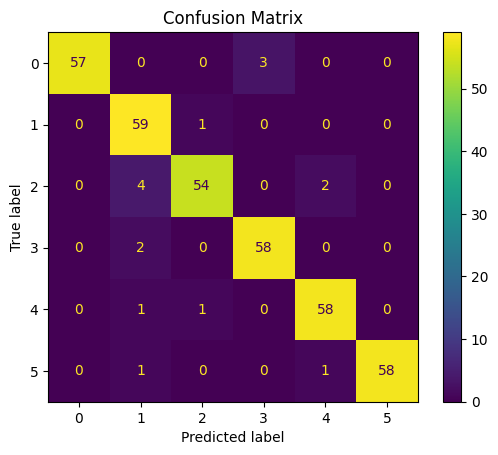

CPU times: user 3.67 s, sys: 243 ms, total: 3.92 s
Wall time: 1min 50s


In [ ]:
%%time
# Tune model for each dataset
tune_model_search(model_tune_rf_jun, param_grid, X_train_jun, y_train_jun, X_test_jun, y_test_jun, cv=cv, search_type='random', n_iter=100)


Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Best Score: 0.8869047619047619
Best Parameters: {'n_estimators': 50, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_leaf_nodes': 40, 'max_depth': 13}
Mean Score: 0.8631, Std Dev: 0.0456 for Parameters: {'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_leaf_nodes': 15, 'max_depth': 11}
Mean Score: 0.8798, Std Dev: 0.0459 for Parameters: {'n_estimators': 50, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_leaf_nodes': 35, 'max_depth': 15}
Mean Score: 0.8417, Std Dev: 0.0433 for Parameters: {'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_leaf_nodes': 10, 'max_depth': 11}
Mean Score: 0.8774, Std Dev: 0.0452 for Parameters: {'n_estimators': 50, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_leaf_nodes': 30, 'max_depth': 17}
Mean Score: 0.8429, Std Dev: 0.0464 for Parameters: {'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_leaf_nodes': 10, 'm

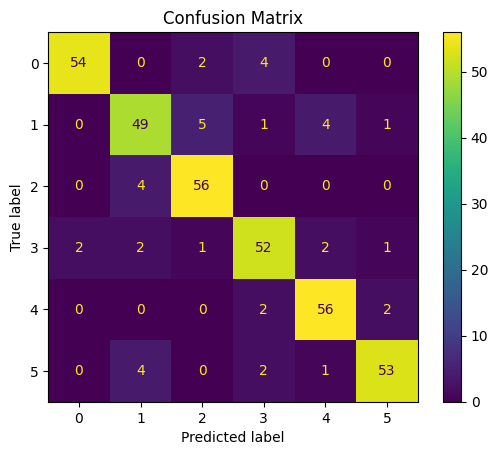

CPU times: user 2.63 s, sys: 155 ms, total: 2.79 s
Wall time: 1min 53s


In [ ]:
%%time
# Tune model for each dataset
tune_model_search(model_tune_rf_jul, param_grid, X_train_jul, y_train_jul, X_test_jul, y_test_jul, cv=cv, search_type='random', n_iter=100)


Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Best Score: 0.944047619047619
Best Parameters: {'n_estimators': 50, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_leaf_nodes': 40, 'max_depth': 17}
Mean Score: 0.9333, Std Dev: 0.0283 for Parameters: {'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_leaf_nodes': 15, 'max_depth': 11}
Mean Score: 0.9393, Std Dev: 0.0289 for Parameters: {'n_estimators': 50, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_leaf_nodes': 35, 'max_depth': 15}
Mean Score: 0.9226, Std Dev: 0.0338 for Parameters: {'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_leaf_nodes': 10, 'max_depth': 11}
Mean Score: 0.9369, Std Dev: 0.0297 for Parameters: {'n_estimators': 50, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_leaf_nodes': 30, 'max_depth': 17}
Mean Score: 0.9226, Std Dev: 0.0338 for Parameters: {'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_leaf_nodes': 10, 'ma

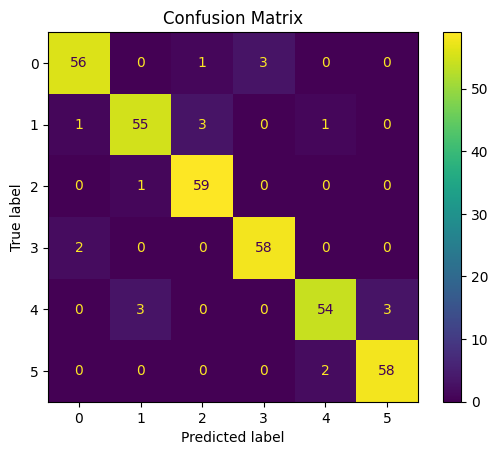

CPU times: user 2.56 s, sys: 168 ms, total: 2.73 s
Wall time: 1min 49s


In [ ]:
%%time
# Tune model for each dataset
tune_model_search(model_tune_rf_ags, param_grid, X_train_ags, y_train_ags, X_test_ags, y_test_ags, cv=cv, search_type='random', n_iter=100)
